<a href="https://colab.research.google.com/github/IgaIgs/wine-quality-prediction/blob/main/Data_Science_Major_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1) Intro to this notebook

## predicting the quality of wine using a real Vinho Verde dataset
### comparing performance of Logistic Regression, Support Vector Machine, Random Forest, Decision Tree and K-Nearest Neighbor for classification and regresion

#### one data set for white (4899) and one for red (1700) wine
#### tools:
  * pands
  * seaborn
  * numpy
  * matplotlib
  * sklearn
  * imblearn

## 1.1. Setting up the Codelab codebase
* imports
* ignore future warnings

In [ ]:
import matplotlib.pyplot as plt # for summary statistics
import matplotlib.ticker as ticker

# for plotting
import pandas as pd
import seaborn as sns
import numpy as np
import graphviz

from collections import Counter
from imblearn.over_sampling import (
    SMOTE, 
    ADASYN, 
    RandomOverSampler,
    SVMSMOTE
)
from imblearn.metrics import classification_report_imbalanced
from imblearn.pipeline import Pipeline as PipelineImb, make_pipeline as make_pipeline_imb

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import plot_confusion_matrix
from sklearn import tree
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.dummy import DummyClassifier
from sklearn.metrics import (
    classification_report,
    r2_score,
    explained_variance_score,
    confusion_matrix,
    accuracy_score,
    log_loss,
    recall_score,
    roc_curve,
    roc_auc_score,
    f1_score,
    precision_score,
    mean_absolute_error,
    mean_squared_error,
)
from sklearn.model_selection import (
    cross_val_score,
    cross_val_predict,
    GridSearchCV,
    train_test_split,
    KFold,
    StratifiedKFold,
    RepeatedStratifiedKFold,
    RepeatedKFold
)

from sklearn.svm import (
    LinearSVC,
    SVC,
    SVR
)


In [ ]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

## 1.2. Loading the red wine (rdf) and white wine (wdf) dataframes

In [ ]:
# red wine
url1 = 'https://raw.githubusercontent.com/IgaIgs/wine-quality-prediction/main/DATA/winequality-red.csv'
rdf = pd.read_csv(url1, delimiter=";")
print(rdf.shape)

# white wine
url2 = 'https://raw.githubusercontent.com/IgaIgs/wine-quality-prediction/main/DATA/winequality-white.csv'
wdf = pd.read_csv(url2, delimiter=";")
print(wdf.shape)

pred_feat = 'quality'

(1599, 12)
(4898, 12)


## 1.3. Initial look at the data

### The first 10 entries in the **red wine** dataset

In [ ]:
rdf.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


### first 10 entries in the **white wine** dataset

In [ ]:
wdf.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


### the dataset has the following attributes:

In [ ]:
rdf.columns

#wdf.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

## 1.4. Summary statistics for numerical variables

In [ ]:
# all the original features
numerical = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']

# outcome variable we are trying to predict
predict = ["quality"]

### Check if there are any null values

In [ ]:
print("Null values summary for Red Wine")
print(rdf.isnull().sum())

print("\nNull values summary for White Wine")
print(wdf.isnull().sum())

Null values summary for Red Wine
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

Null values summary for White Wine
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


### Get the insight into some of the main metrics of the data

In [ ]:
print("RED WINE")
rdf.describe()

RED WINE


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [ ]:
print("WHITE WINE")
wdf.describe()

WHITE WINE


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


### Additonaly, for numerical variables, we can plot their distribution across the dataset to detect any outliers

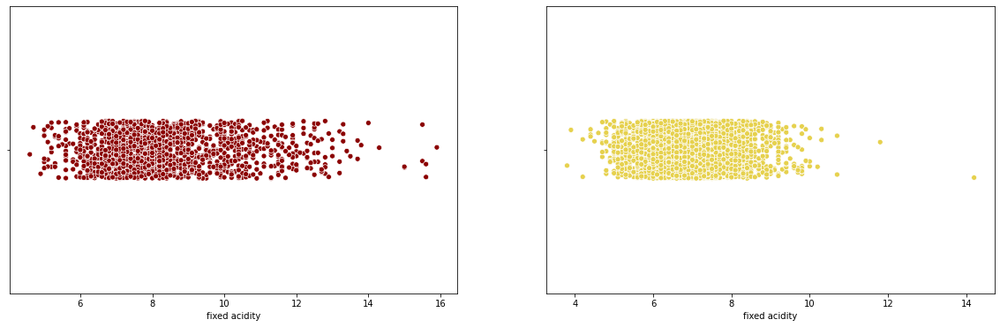

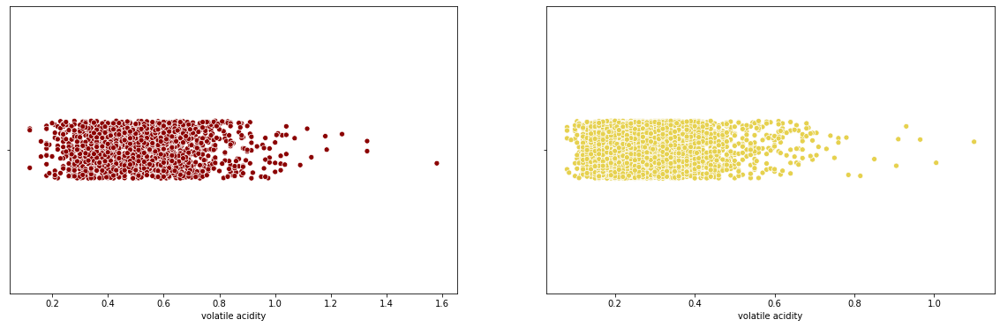

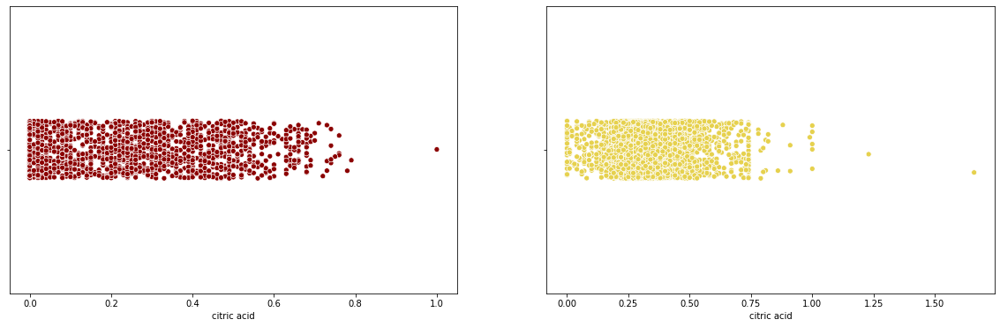

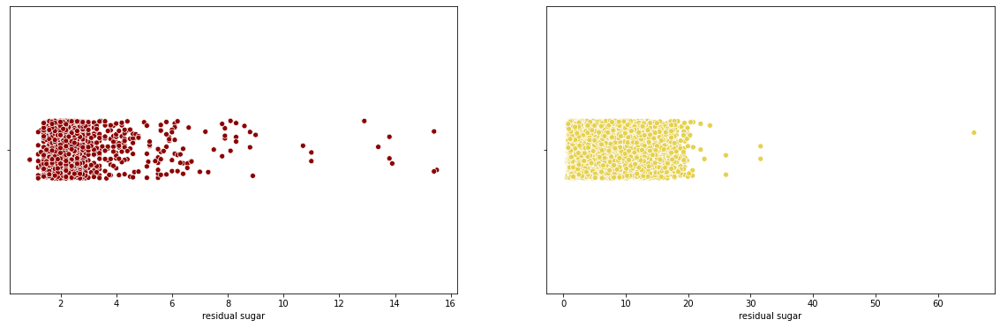

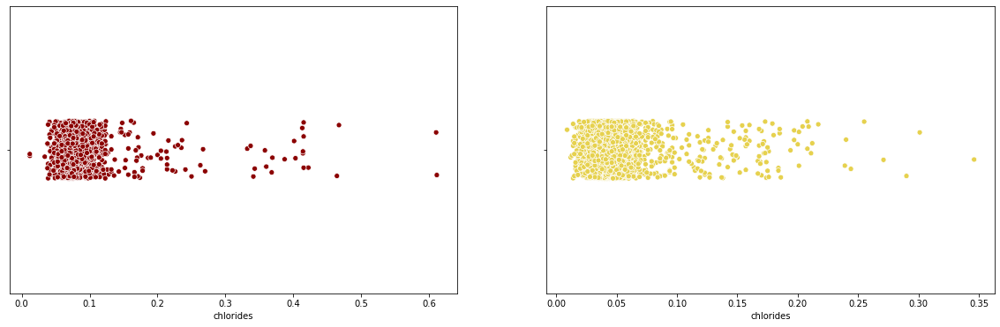

...

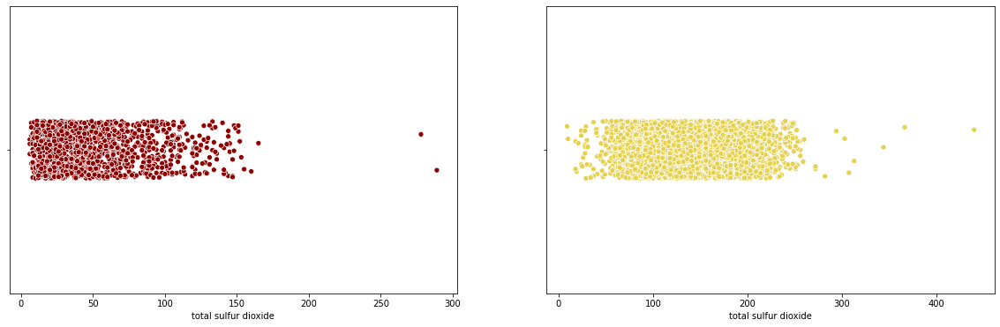

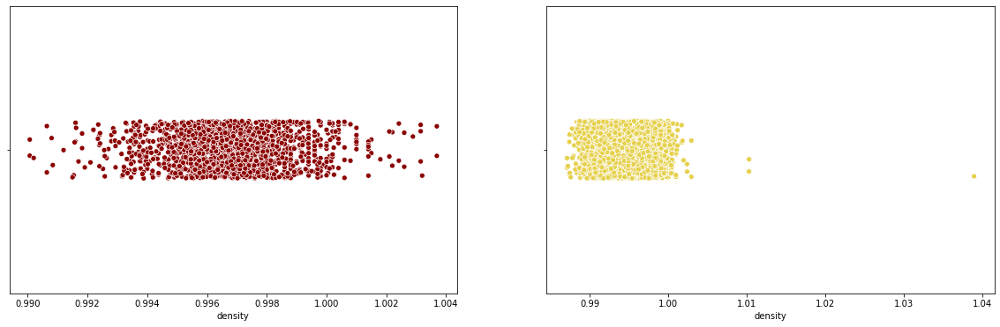

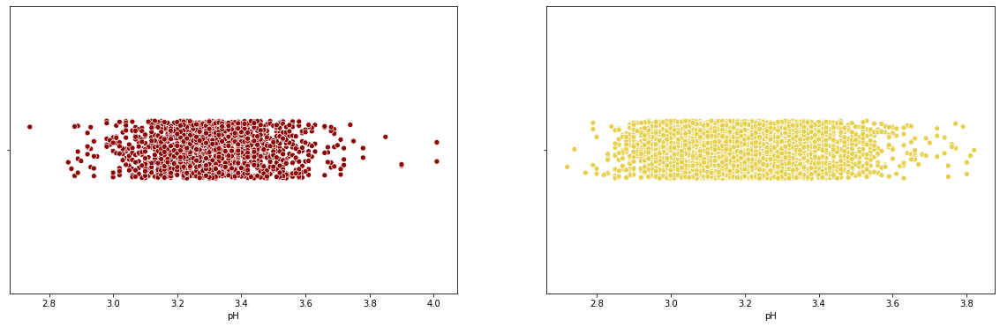

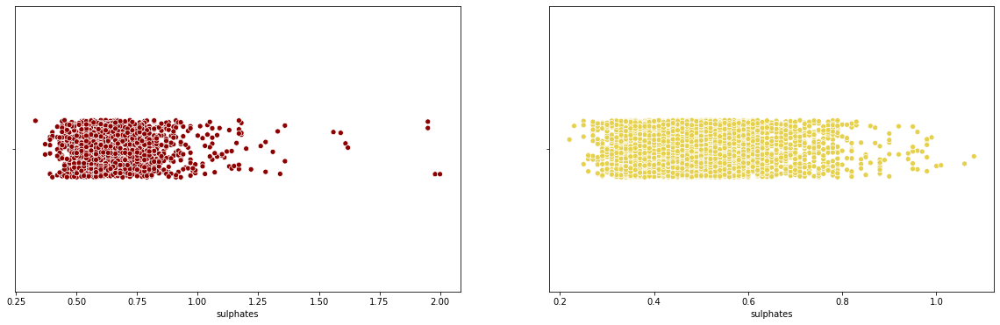

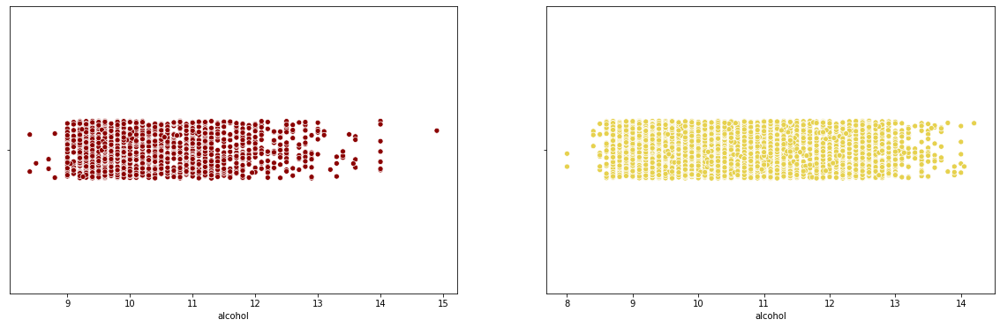

In [ ]:
for v in numerical:
    # creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
    f, (ax_1_r, ax_2_w) = plt.subplots(1, 2, sharex=False, figsize=(20,6))
    #red wine
    r = sns.stripplot(data=rdf, x=v, ax=ax_1_r, color="darkred", edgecolor='w', linewidth=0.7, size=6)
    #white wine
    w = sns.stripplot(data=wdf, x=v, ax=ax_2_w, color="#e6d14e", edgecolor='w', linewidth=0.7, size=6)
    plt.show()

#### The following outliers were detected:<br>

1. Red wine: <br>
  * total sulfur deoxide (above 270)

2. White wine:
  * fixed acidity (above 14)
  * citric acid (above 1.5)
  * residual sugar (above 60)
  * free sulfur dioxide (above 250)
  * total sulfur dioxide (above 400)
  * density (above 1.03)

#### Deleting the outliers

In [ ]:
## Red wine
print("Red wine values pre-deletion: {}".format(rdf.shape))

#look at the outliers
rdf[rdf["total sulfur dioxide"] > 250]

#delete the outliers
rdf_no_out = rdf[rdf["total sulfur dioxide"] < 250]
rdf = rdf_no_out

print("Red wine values after deletion: {}\n".format(rdf.shape))

## White wine
print("White wine values pre-deletion: {}".format(wdf.shape))

wdf_out = wdf[(wdf["fixed acidity"] > 14) | (wdf["citric acid"] > 1.5) |
    (wdf["residual sugar"] > 60) | (wdf["free sulfur dioxide"] > 250) | 
    (wdf["free sulfur dioxide"] > 250) | (wdf["total sulfur dioxide"] > 250) | 
    (wdf["density"] > 1.03)]

print("Outliers for white wine shape: {}". format(wdf_out.shape))

# delete by index
wdf_no_out = wdf.drop(wdf_out.index)
wdf = wdf_no_out

# 27 less values
print("White wine values after deletion: {}".format(wdf.shape))

Red wine values pre-deletion: (1599, 12)
Red wine values after deletion: (1597, 12)

White wine values pre-deletion: (4898, 12)
Outliers for white wine shape: (27, 12)
White wine values after deletion: (4871, 12)


### Investigate all the quality ratings given in each dataset

In [ ]:
print("All unique values for quality in the RED wine dataset are: {}\n".format(np.unique(rdf['quality'])))

print("All unique values for quality in the WHITE wine dataset are: {}".format(np.unique(wdf['quality'])))

All unique values for quality in the RED wine dataset are: [3 4 5 6 7 8]

All unique values for quality in the WHITE wine dataset are: [3 4 5 6 7 8 9]


# 2) Exploring the dataset

## 2.1. Analyse the distribution of the outcome variable `quality`

**Seperately for red and white wine**

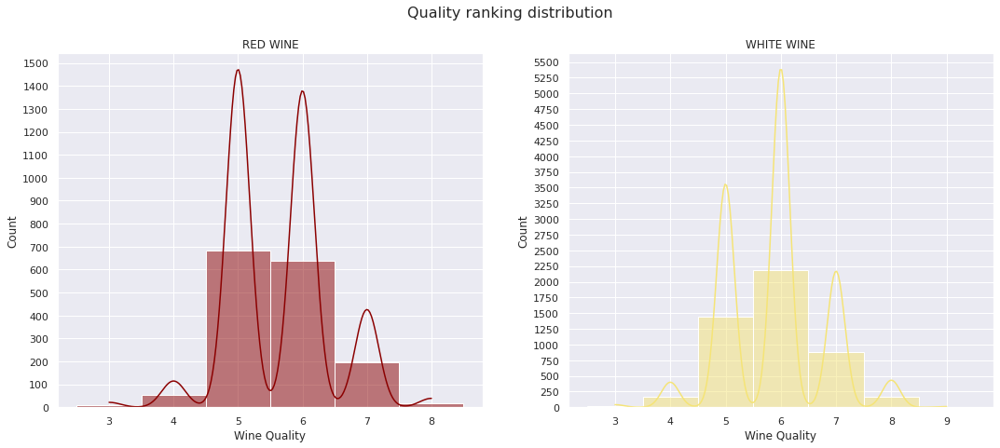

In [ ]:
# creating a figure composed of two matplotlib.Axes objects
sns.set(style="darkgrid")

f, (ax_1, ax_2) = plt.subplots(1, 2, sharex=False, figsize=(18,7))

r = sns.histplot(data=rdf, x="quality", kde=True, binwidth=1, color='darkred', discrete=True, common_norm=False, ax=ax_1)
r.yaxis.set_major_locator(ticker.MultipleLocator(100)); r.yaxis.set_major_formatter(ticker.ScalarFormatter())

w = sns.histplot(data=wdf, x="quality", kde=True, binwidth=1, color='#f5e476', alpha=0.5, discrete=True, ax=ax_2)
w.yaxis.set_major_locator(ticker.MultipleLocator(250)); w.yaxis.set_major_formatter(ticker.ScalarFormatter())

f.suptitle("Quality ranking distribution", fontsize=16)
ax_1.set_xlabel('Wine Quality'); ax_2.set_xlabel('Wine Quality')
ax_1.set_title("RED WINE"); ax_2.set_title("WHITE WINE"); 
plt.show()

**Both wine types on one plot using density**

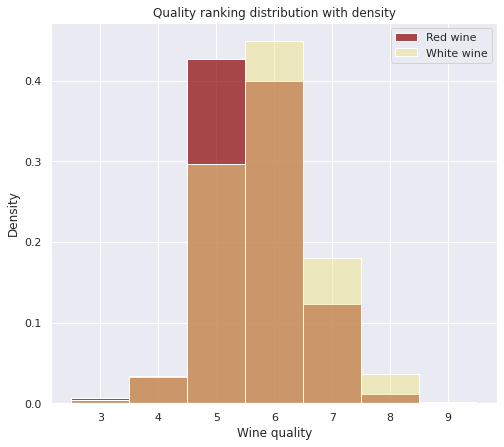

In [ ]:
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
f = plt.figure(figsize=(8, 7))
sns.set(style="darkgrid")

r = sns.histplot(data=rdf, x="quality", color="darkred", label="Red wine", binwidth=1, stat="density", alpha=0.7, discrete=True)
w = sns.histplot(data=wdf, x="quality", color="khaki", label="White wine", binwidth=1, stat="density", alpha=0.5, discrete=True)

plt.title("Quality ranking distribution with density")
plt.xlabel("Wine quality")
plt.legend() 
plt.show()

1. **Overall observations for both wines**
  * normal distribution (bell-shaped) with most wines being in the 'medium' quality group (5-6/10) and least samples being on the extremes (either very low, or very high quality)
  * distribution shifted slightly to the right, towards the better wines: there is more samples ranked 5 or higher than 5 or lower.
  * the 3rd most numerous rating given was 7

2. **Observations for each wine type**
  * Red wine
    * most wines were perceived 5 and 6 with little difference in between (around 50 more have been rated 5/10 in comparison to 6/10)
    * no ratings below 3 or above 8 were given
  * White wine
    * most wines were perceived to be between 6/10 with a significant difference to the second score 5/10 and even more so to the 3rd 7/10 (confirmed by density curve). 
  * no ratings below 3 or above 9 (less than 100 white wines with this rating though)

3. **Comparison**
  * White wine was usually perceived to be higher quality than red wine
    * more often given 6-9/10 ratings than red wine
    * out of the two most common ratings, 5 and 6 out of 10, the lower one is more numerous in red wine, whereas the higher one is prevalent in white wine
    * both wines get the 4/10 rating equally often
    * red wine gets the 3/10 rating slightly more often


## 2.2. Discretise the alcohol content vaiables into low, mid and high categories
* explore the relationship between alcohol content and wine quality,
* create a 3-valued "alcohol_cat" variable based on alcohol content distribution:
  * low < (average - stddev),  
  * (average - stddev) < mid < (average + stddev), 
  * high > (average + stddev). 


### 2.2.3. A look at the distribution of alcohol content in both wines to understand where the given thresholds come from
* histogram,
* density graph,
* boxplot

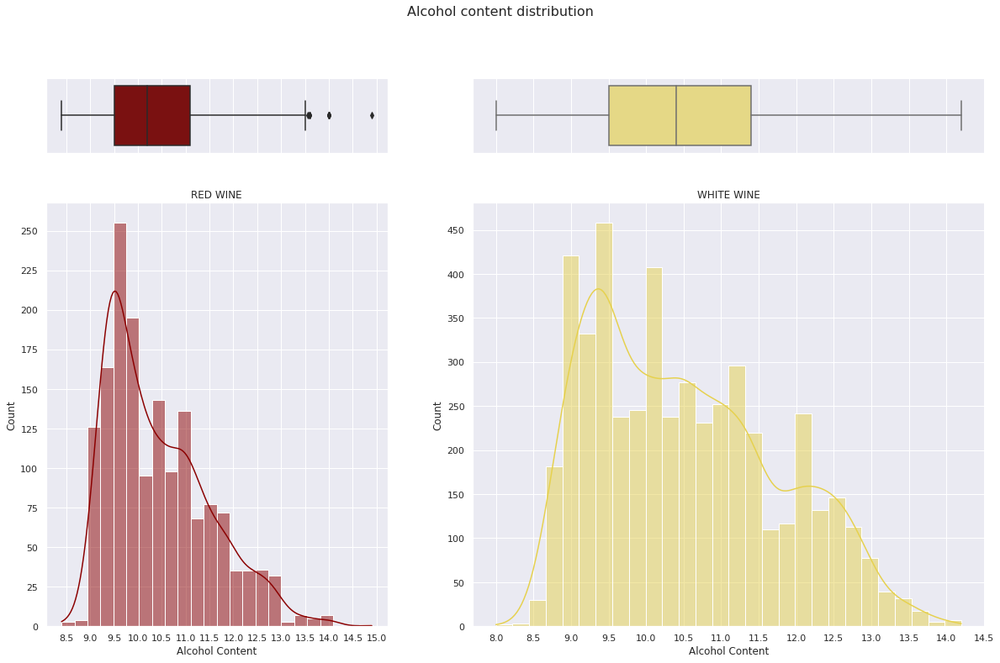

In [ ]:
# creating a figure composed of multiple matplotlib.Axes objects
f, ((ax_box, ax_box2), (ax_hist, ax_hist2)) = plt.subplots(2, 2, sharex='col', gridspec_kw={"height_ratios": (.15, .85), "width_ratios": (.40, .60)}, figsize=(20,12))
 
# assigning a graph to each ax
sns.boxplot(data=rdf, x="alcohol", ax=ax_box, color="darkred")
r = sns.histplot(data=rdf, x="alcohol", ax=ax_hist, kde=True, color="darkred")

r.yaxis.set_major_locator(ticker.MultipleLocator(25)); r.yaxis.set_major_formatter(ticker.ScalarFormatter())
r.xaxis.set_major_locator(ticker.MultipleLocator(0.5)); r.xaxis.set_major_formatter(ticker.ScalarFormatter())
 
# assigning a graph to each ax
sns.boxplot(data=wdf, x="alcohol", ax=ax_box2, color="#f5e476")
w = sns.histplot(data=wdf, x="alcohol", ax=ax_hist2, kde=True, color="#e6d14e")
 
w.yaxis.set_major_locator(ticker.MultipleLocator(50)); w.yaxis.set_major_formatter(ticker.ScalarFormatter())
w.xaxis.set_major_locator(ticker.MultipleLocator(0.5)); w.xaxis.set_major_formatter(ticker.ScalarFormatter())

# Remove x axis name for the boxplot
f.suptitle("Alcohol content distribution", fontsize=16)
ax_box.set(xlabel=''); ax_box2.set(xlabel='')
ax_hist.set_xlabel('Alcohol Content'); ax_hist2.set_xlabel('Alcohol Content')
ax_hist.set_title("RED WINE"); ax_hist2.set_title("WHITE WINE"); 
plt.show()

We can observe 3 areas where the patterns of density and count visibly change (especially in white wine) dividing the alcohol content axis into 3 distinct sections
1. before the 1st peak - till around 9.2-9.5
2. between the 1st peak to the 2nd spike inclusive - till around 11.2-11.7
3. after the 2nd spike till the end

**As shown in the calculations below, those areas match exactly to the proposed discretisation points:**

### 2.2.4. Discretising alcohol content

In [ ]:
#red wine
low_thresh_r = np.average(rdf['alcohol']) - np.std(rdf['alcohol']) #9.357648814102783
high_thresh_r = np.average(rdf['alcohol']) + np.std(rdf['alcohol']) #11.488317414790275

#discretise
rdf['alcohol_cat'] = pd.cut(x=rdf['alcohol'], bins= [0, low_thresh_r, high_thresh_r, 15], labels=["low", "mid", "high"])

# white wine
low_thresh_w = np.average(wdf['alcohol']) - np.std(wdf['alcohol']) #9.283772111232736
high_thresh_w = np.average(wdf['alcohol']) + np.std(wdf['alcohol']) #11.744761984316469

#discretise
wdf['alcohol_cat'] = pd.cut(x=wdf['alcohol'], bins= [0, low_thresh_w, high_thresh_w, 15], labels=["low", "mid", "high"])


# visualise 
print("Quality metrics in the 3 alcohol categories")
rdf.groupby(["alcohol_cat"])['quality'].describe()

Quality metrics in the 3 alcohol categories


,count,mean,std,min,25%,50%,75%,max
alcohol_cat,,,,,,,,
low,194.0,5.247423,0.611308,3.0,5.0,5.0,6.0,7.0
mid,1125.0,5.526222,0.746568,3.0,5.0,5.0,6.0,8.0
high,278.0,6.341727,0.756526,4.0,6.0,6.0,7.0,8.0


## 2.3. Describe the distribution of wine quality separately for low, mid and high alcohol content

### 2.3.1. Hitograms for relationship between alcohol content and quality without normalisation
* clearly shows the effect of the Gaussian distribution
  * the mid alcohol content is more than 3 times overrepresented in comparison to low or high groups

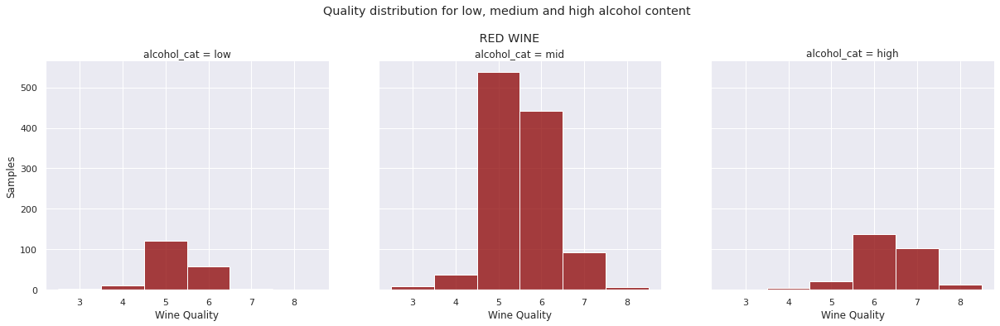

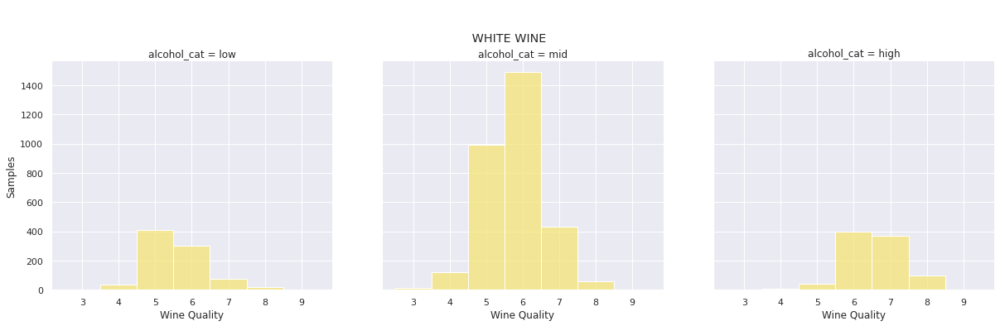

In [ ]:
r = sns.FacetGrid(rdf, col='alcohol_cat', height=6, aspect=1)
r.map_dataframe(sns.histplot, x="quality", color="darkred", discrete=True)

w = sns.FacetGrid(wdf, col="alcohol_cat", height=6, aspect=1)
w.map_dataframe(sns.histplot, x="quality", color="#f5e476", discrete=True)

r.fig.tight_layout(pad=5); w.fig.tight_layout(pad=5)
r.fig.suptitle('Quality distribution for low, medium and high alcohol content\n\n RED WINE'); w.fig.suptitle('\n\n WHITE WINE')
r.set_xlabels("Wine Quality"); w.set_xlabels("Wine Quality");
r.set_ylabels("Samples"); w.set_ylabels("Samples");

plt.show()

#### Despite lack of normalisation we can still observe the following <br>

* **Red Wine**:
  1. HIGH alcohol content
    *  The only one with rating 6/10 being the most numerous and 7/10 the 2nd most numerous. 
    * There are no or close to none 3/10 ratings.
  2. MID alcohol content
    * Already has the 5/10 as the prevailing score with a significant advantage over the next one - 6/10. 
    * 7/10 is still more common than 4/10.
  3. LOW alcohol content 
    * Ratings 7/10 and above are nearly nonexistent compared to other ratings.
    * 5/10 is still the most common but is now twice as numerous as 6/10.

* **White Wine**: <br>
  1. HIGH alcohol content 
    * 6/10 quality rating is the most common, followed closely by 7. 
    * The only group with rating 8/10 on 3rd place.
    * The only group where ratings 7/10 and 8/10 are MORE common than 5. 
    * Little to no ratings below 6.
  2. MID alcohol content 
    * The 6/10 is still prevailing, but 5/10 is the 2nd most common. 
    * 3rd place goes to 7, but it's more than 2 times less common than the 5/10.
    * Unlike in HIGH group, here the ratings below 6 are much more common than above 6.
    * 4/10 is twice as common as 8/10
  3. LOW alcohol content 
    * The only category where the 5/10 rating is the most numerous. 
    * The 6/10 follows by a small margin. 


### 2.3.2. The same histograms, but normalised using density

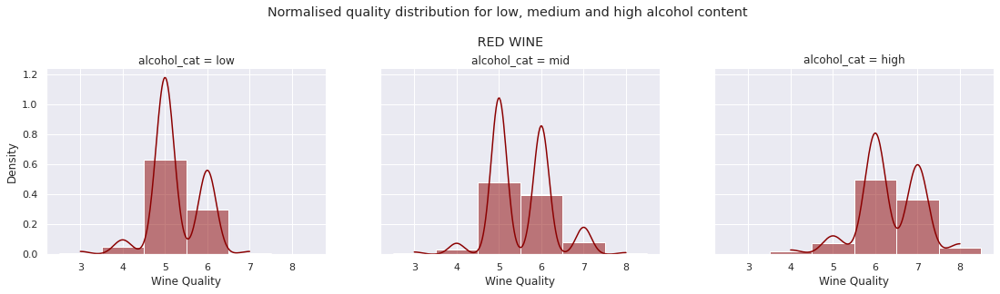

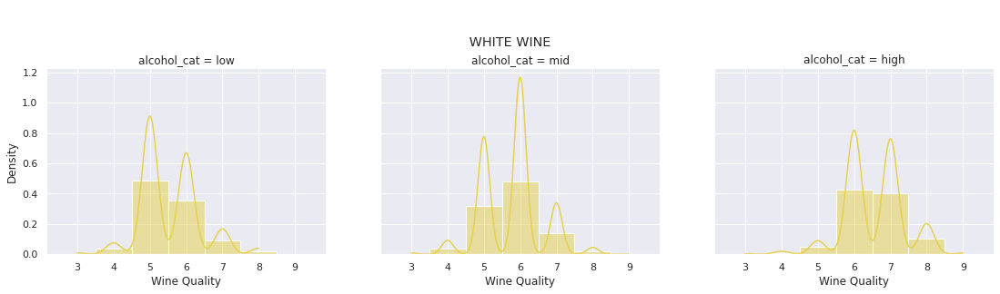

In [ ]:
r = sns.FacetGrid(rdf, col='alcohol_cat', height=5, aspect=1.1)
r.map_dataframe(sns.histplot, x="quality", binwidth=1, stat="density", common_norm="True", kde=True, color="darkred", discrete=True)

w = sns.FacetGrid(wdf, col="alcohol_cat", height=5, aspect=1.1)
w.map_dataframe(sns.histplot, x="quality", binwidth=1, stat="density", common_norm="True", kde=True, color="#e6d14e", discrete=True)

r.fig.tight_layout(pad=5); w.fig.tight_layout(pad=5)
r.fig.suptitle('Normalised quality distribution for low, medium and high alcohol content\n\n RED WINE'); w.fig.suptitle('\n\n WHITE WINE')
r.set_xlabels("Wine Quality"); w.set_xlabels("Wine Quality");
r.set_ylabels("Density"); w.set_ylabels("Density");

plt.show()

#### Now we can now more directly compare the ratings between groups and observe the following for both wines:
1. High alcohol content wines are given a score of 6 and above on quality scale much often than mid or low alcohol content wines. 
  * In red wine the ratings 6-8/10 are the most common here out of all groups
  * In White wine the 8/10 rating is pretty much nonexistent in the lower alcohol groups compared to this one
2. Mid alcohol content wines are given a score in range 6-7 on the quality scale much more often than the low alcohol wines and are less often given a score below 6, but more often than the high alcohol wines.
  * In both wines the 5/10 rating is less common in this group than in low
  * In both wins, the 6/10 is more common in this group than in low
3. Low alcohol content wines are most often given 5/10 out of all groups and the least often given a score of 6 or above

### 2.3.3. Violin plots comparing quality distribution in each of the 3 alcohol content groups to confirm our findings

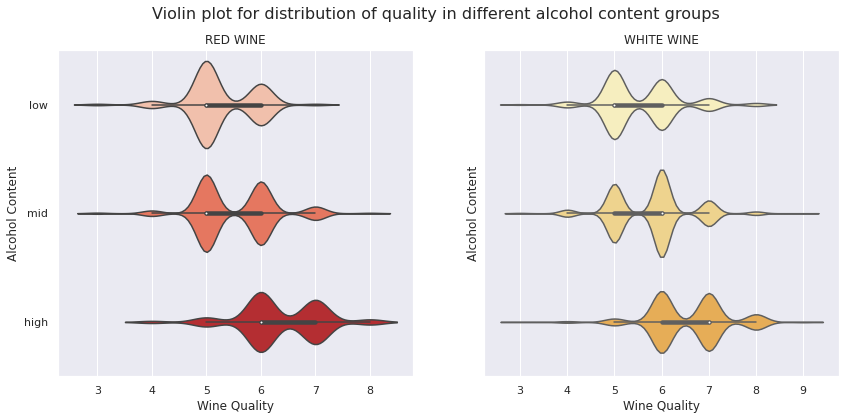

In [ ]:
# creating a figure composed of two matplotlib.Axes objects
f, (ax_1, ax_2) = plt.subplots(1, 2, sharex=False, sharey=True, figsize=(14,6))

sns.violinplot(y=rdf["alcohol_cat"], x=rdf["quality"], palette="Reds", ax=ax_1)
sns.violinplot(y=wdf["alcohol_cat"], x=wdf["quality"], palette=sns.color_palette("YlOrBr"), ax=ax_2)

f.suptitle("Violin plot for distribution of quality in different alcohol content groups", fontsize=16)
ax_1.set_xlabel('Wine Quality'); ax_2.set_xlabel('Wine Quality')
ax_1.set_ylabel('Alcohol Content'); ax_2.set_ylabel('Alcohol Content')
ax_1.set_title("RED WINE"); ax_2.set_title("WHITE WINE"); 
plt.show()

### 2.3.4. Conclusions about the relationship between alcohol content and quality?<br>
* The alcohol content has a visible, strong positive correlation with the quality of both the red and white wine. 
* Along with the content of alcohol in the wine, the quality of said wine also increases, which can be clearly seen on the violin plots. 
* Wines in the high alcohol content group are perceived better and most often given the highest ratings (7 and above). 
* The mid alcohol content wines have a good balance between the two middle range ratings (5 and 6), whereas the low quality wines are most often perceived low quality with rating 5/10 being by far the most prevalent.
--------
<br>

Based on the violin plots, we can also see that if we were to divide the wine quality into two groups, 'high' and 'low', we could just take the majority of the low alcohol content ratings and the lower half of the mid alcohol content wines to get the 'low' quality wine ratings. Similarly, if we take the majority of the higih alcohol content wines and the better part of the mid category, we would get the 'high' quality wines. This could be the first indication that a good threshold for dividing the quality into 'low' and 'high' classes would be:
* low: ' < 6 '
* high: ' 6 >= '

## 2.4. Plot the residual sugar variable to identify a suitable threshold to separate "sweet" from "dry" wines.

### 2.4.1. Residual sugar histograms for both wines with the count of samples

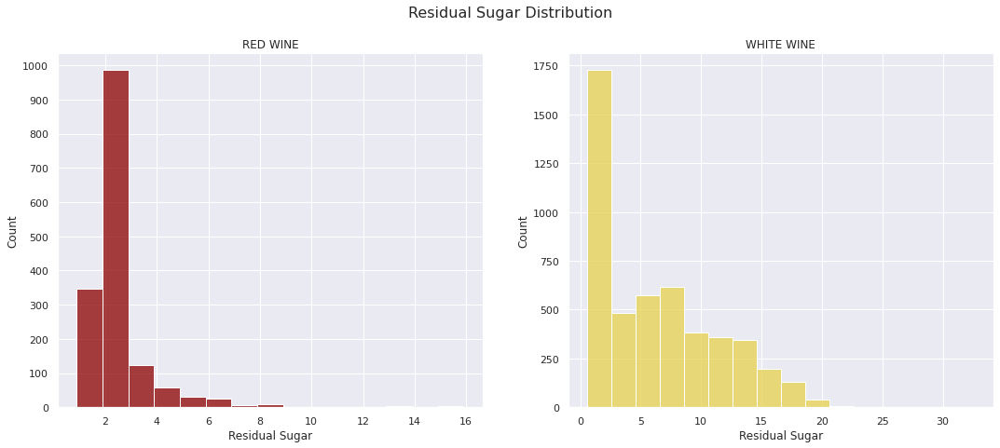

In [ ]:
# creating a figure composed of two matplotlib.Axes objects
f, (ax_1, ax_2) = plt.subplots(1, 2, sharex=False, figsize=(18,7))

r = sns.histplot(x="residual sugar", data=rdf, binwidth=1, color="darkred", ax=ax_1)
r.yaxis.set_major_locator(ticker.MultipleLocator(100)); r.yaxis.set_major_formatter(ticker.ScalarFormatter())

w = sns.histplot(x="residual sugar", data=wdf, binwidth=2, color="#e6d14e", ax=ax_2)
w.yaxis.set_major_locator(ticker.MultipleLocator(250)); w.yaxis.set_major_formatter(ticker.ScalarFormatter())

f.suptitle("Residual Sugar Distribution", fontsize=16)
ax_1.set_xlabel('Residual Sugar'); ax_2.set_xlabel('Residual Sugar')
ax_1.set_title("RED WINE"); ax_2.set_title("WHITE WINE"); 
plt.show()

* Residual sugar (RS) (grams/Litre) is the level of grape monosaccharides, which were not converted into alcohol during fermentation (https://winefolly.com/tips/wines-from-dry-to-sweet-chart/). 
* Most high-quality red wines are dry, with RS below 8-10 g/L, whereas only 3 regions in Europe make high quality off dry, or sweet, white wines with RS above 10g/L, the rest is dry(https://winefolly.com/deep-dive/sugar-in-wine-chart/). 
* Particularly Vinho Verde is said to be very dry, or even ‘bone dry’ (http://thewinestable.com.sg/blog-residual-sugar). 

**As can be seen on the plots, most wines in this dataset are actually ‘dry’, meaning a different approach to the separation is needed.** 

### 2.4.2. Residual sugar histograms with box plots to choose thresholds based on distribution

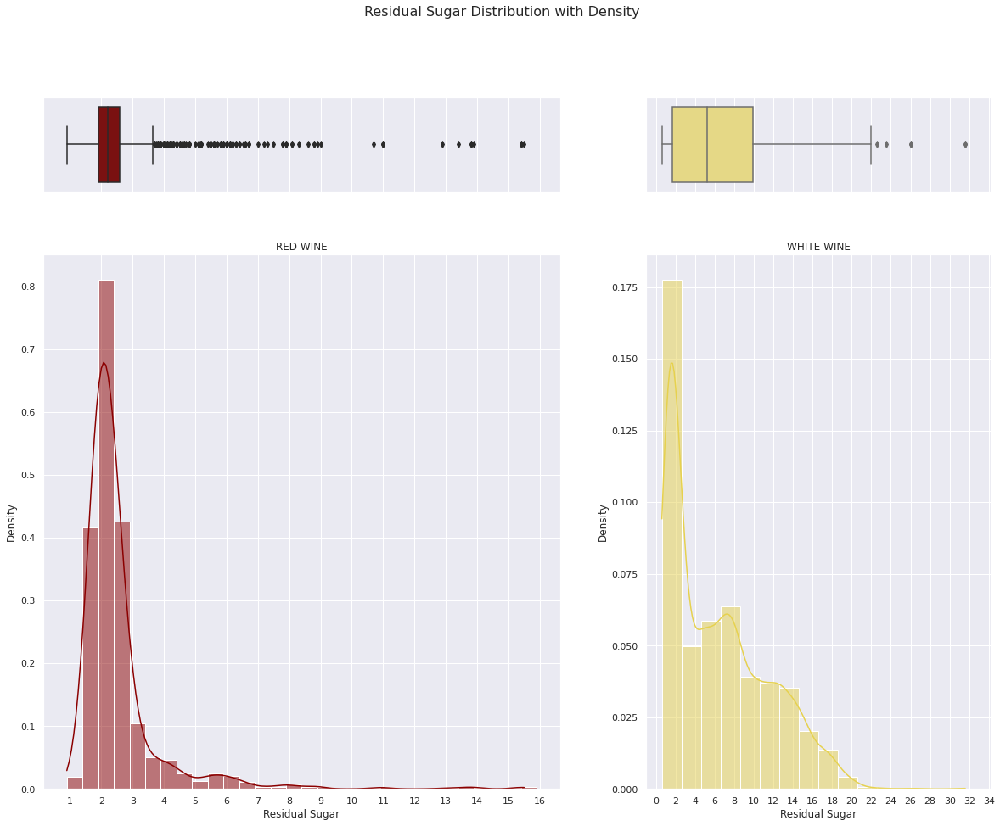

In [ ]:
# creating a figure composed of multiple matplotlib.Axes objects
f, ((ax_box, ax_box2), (ax_hist, ax_hist2)) = plt.subplots(2, 2, sharex='col', gridspec_kw={"height_ratios": (.15, .85), "width_ratios": (.60, .40)}, figsize=(20,15))
 
# assigning a graph to each ax
sns.boxplot(data=rdf, x="residual sugar", ax=ax_box, color="darkred")
r = sns.histplot(data=rdf, x="residual sugar", ax=ax_hist, binwidth=0.5, kde=True, stat="density", color="darkred")
r.xaxis.set_major_locator(ticker.MultipleLocator(1)); r.xaxis.set_major_formatter(ticker.ScalarFormatter())
 
# assigning a graph to each ax
sns.boxplot(data=wdf, x="residual sugar", ax=ax_box2, color="#f5e476")
w = sns.histplot(data=wdf, x="residual sugar", ax=ax_hist2, binwidth=2, kde=True, stat="density", color="#e6d14e")
w.xaxis.set_major_locator(ticker.MultipleLocator(2)); w.xaxis.set_major_formatter(ticker.ScalarFormatter())

# Remove x axis name for the boxplot
f.suptitle("Residual Sugar Distribution with Density", fontsize=16)
ax_box.set(xlabel=''); ax_box2.set(xlabel='')
ax_hist.set_xlabel('Residual Sugar'); ax_hist2.set_xlabel('Residual Sugar')
ax_hist.set_title("RED WINE"); ax_hist2.set_title("WHITE WINE"); 
plt.show()

#### Possible thresholds for discretising the Residual Sugar variable into two classes and creating a new "isSweet" binary variable

1. Based on the above graphs and comparing to how the alcohol content was categorised:
* for white wine: around 6.5 - right before the 2nd peak
* for red wine: right before 4 - when the small curve starts (3.9?)

2. Other candidates worth exploring:
* median:  medium value, 50th percentile
* 75% percentile (third quartile (Q3/75th Percentile): the middle value between the median and the highest value (not the “maximum”) of the dataset.)
* mean

I'll create seperate columns of data for the product of discretization based on each of the thresholds to then observe whether there is any correlation between sugar and quality and which thresholds represents it best. 

### 2.4.3. Dividing the residual sugar variable on chosen threshold

In [ ]:
# RED WINE
# based on graphs
sweet_my_r = 3.9
# other candidates
sweet_median_r = np.median(rdf['residual sugar']) #2.2
sweet_75_r = np.percentile(rdf['residual sugar'], 75) #2.6
sweet_mean_r = np.mean(rdf['residual sugar']) #2.5315904821540403

#discretise
rdf['isSweetMy'] = pd.cut(x=rdf['residual sugar'], bins= [0, sweet_my_r, np.amax(rdf['residual sugar'])], labels=[0, 1])
rdf['isSweetMd'] = pd.cut(x=rdf['residual sugar'], bins= [0, sweet_median_r, np.amax(rdf['residual sugar'])], labels=[0, 1])
rdf['isSweet75'] = pd.cut(x=rdf['residual sugar'], bins= [0, sweet_75_r, np.amax(rdf['residual sugar'])], labels=[0, 1])
rdf['isSweetMn'] = pd.cut(x=rdf['residual sugar'], bins= [0, sweet_mean_r, np.amax(rdf['residual sugar'])], labels=[0, 1])

###################################################

# WHITE WINE
# based on graphs
sweet_my_w = 6.5
# the other candidates
sweet_median_w = np.median(wdf['residual sugar'])   #5.2
sweet_75_w = np.percentile(wdf['residual sugar'], 75)   #9.875 
sweet_mean_w = np.mean(wdf['residual sugar'])   #6.3664237322931765

#discretise
wdf['isSweetMy'] = pd.cut(x=wdf['residual sugar'], bins= [0, sweet_my_w, np.amax(wdf['residual sugar'])], labels=[0, 1])
wdf['isSweetMd'] = pd.cut(x=wdf['residual sugar'], bins= [0, sweet_median_w, np.amax(wdf['residual sugar'])], labels=[0, 1])
wdf['isSweet75'] = pd.cut(x=wdf['residual sugar'], bins= [0, sweet_75_w, np.amax(wdf['residual sugar'])], labels=[0, 1])
wdf['isSweetMn'] = pd.cut(x=wdf['residual sugar'], bins= [0, sweet_mean_w, np.amax(wdf['residual sugar'])], labels=[0, 1])

###################################################

wdf.head(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,alcohol_cat,isSweetMy,isSweetMd,isSweet75,isSweetMn
0,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,low,1,1,1,1
1,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,mid,0,0,0,0
2,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,mid,1,1,0,1
3,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,mid,1,1,0,1
4,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,mid,1,1,0,1
5,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,mid,1,1,0,1
6,6.2,0.32,0.16,7.00,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,mid,1,1,0,1
7,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,low,1,1,1,1
8,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,mid,0,0,0,0
9,8.1,0.22,0.43,1.50,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6,mid,0,0,0,0


### 2.4.4. Histograms showing the relationship between sweetness and quality of wine for each of the thresholds
* just my process of selecting the one that shows the best correlation with quality (if such exists at all)

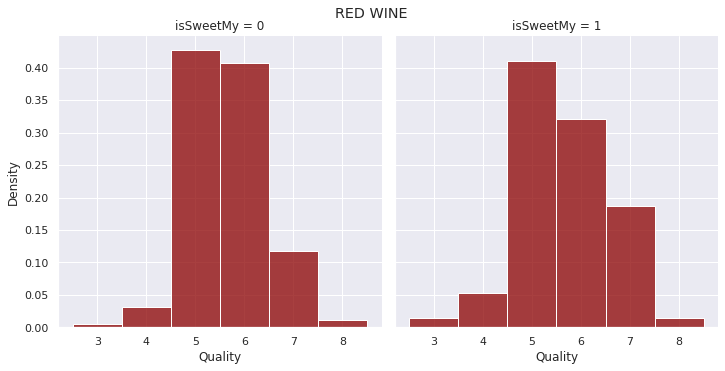

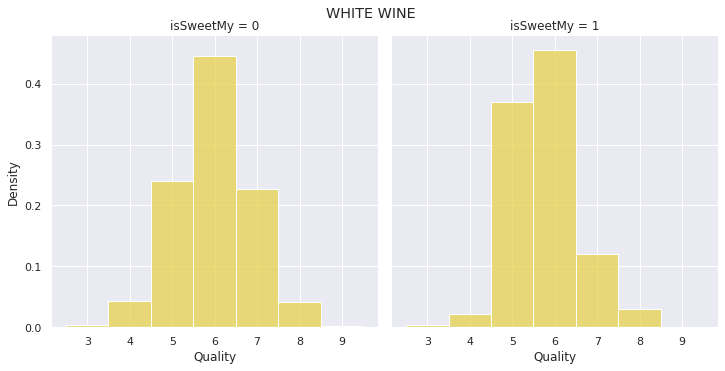

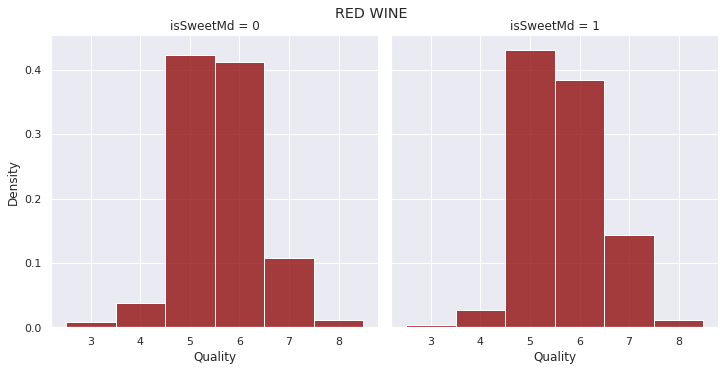

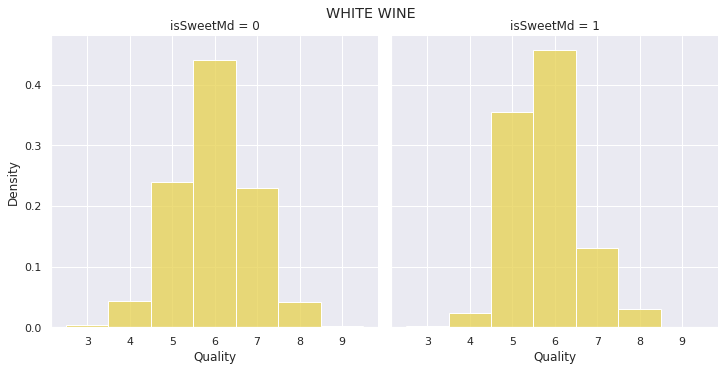

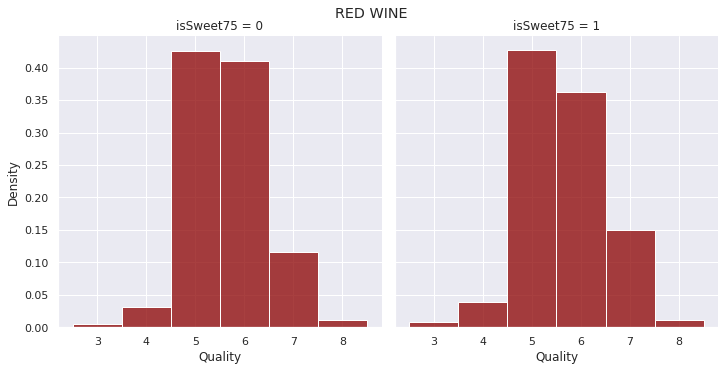

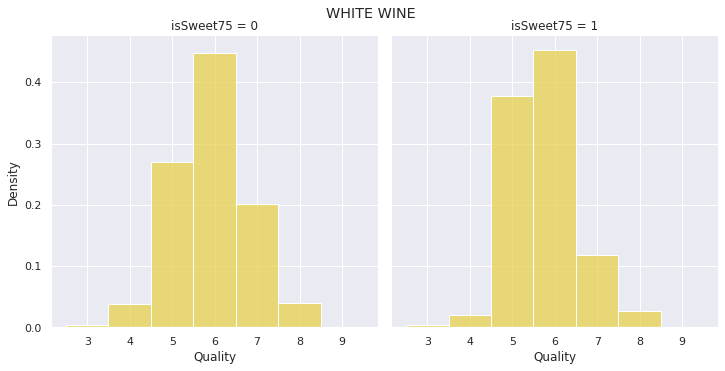

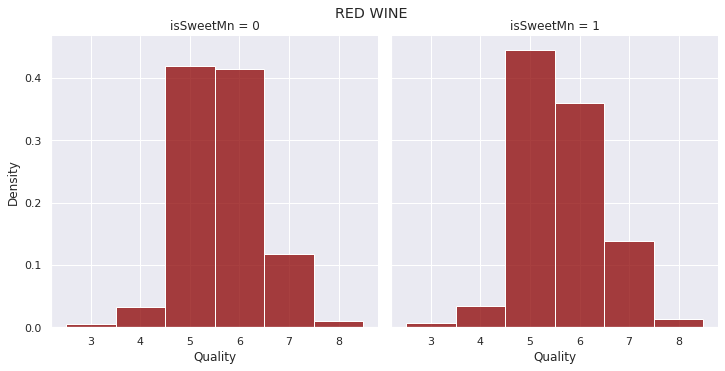

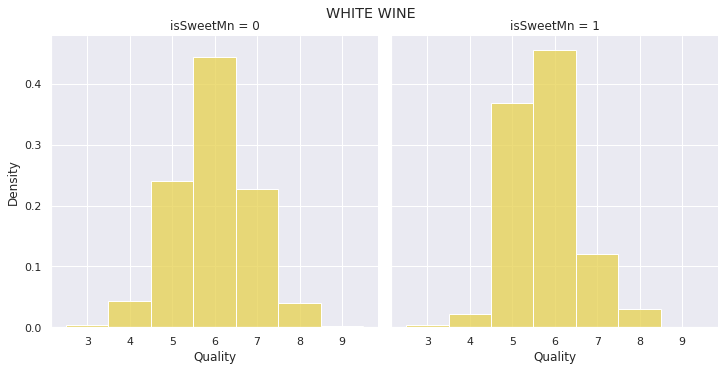

In [ ]:
sweet_cat = [	'isSweetMy', 'isSweetMd',	'isSweet75',	'isSweetMn']

for s in sweet_cat:

  sns.set(style="darkgrid")
  r = sns.FacetGrid(rdf, col=s, height=5, aspect=1)
  w = sns.FacetGrid(wdf, col=s, height=5, aspect=1)

  r.map_dataframe(sns.histplot, x="quality", discrete=True, stat="density", color="darkred")
  w.map_dataframe(sns.histplot, x="quality", discrete=True, stat="density", color="#e6d14e")

  r.fig.subplots_adjust(top=0.9); w.fig.subplots_adjust(top=0.9)
  r.fig.suptitle('RED WINE'); w.fig.suptitle('WHITE WINE')
  r.set_axis_labels("Quality", "Density"); w.set_axis_labels("Quality", "Density")

  plt.show()

#### Analysis of the thresholds

1. isSweetMy
* RED WINE
  * Dry wine gets the 5/10 and 6/10 more often than the sweet wine and these are also the two most prevalent ratings in the dry wines. 
  * Sweet wines get much more often the 7/10 rating and roughly as often the 8/10
  * The sweet wines get less 6/10 than the dry ones
  * Can see a small positive correlation
* WHITE WINE
  * Dry wines are given the high scores of 7 and 8 more often than sweet wines
  * The score of 6 is given with roughly the same frequency in both types
  *  Sweet wines get the 5/10 score more often than dry wines
  * Can observe a slight negative correlation

2. isSweetMd
* RED WINE
  * Nearly no difference
  * Sweet wines get more 7/10 than dry but less 6ths (but not by much)
* WHITE WINE
  * mostly the same conclusion as in isSweetMy but shows the difference between '5' and '7'ratings worse

3. isSweet75
* RED WINE
  * as isSweetMd
* WHITE WINE
  * 'dry' wines now have much more '5' than '7'

4. isSweetMn
RED WINE, WHITE WINE
  * as isSweetMd




#### Conclusion: **It seems that isSweetMy shows the differences between dry and sweet wines the best, therefore this is the one I will continue the analysis with**

## 2.5. Relationship between quality and residual sugar based on chosen threshold
* Question: Are sweet wines perceived as lower or higher quality than dry wines?

### 2.5.1. Histograms comparing quality distribution in `dry` and `sweet` wine categories to examine the correlation (or lack thereof) between residual sugar and quality

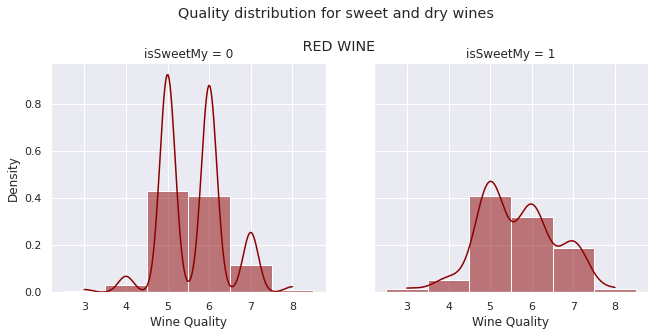

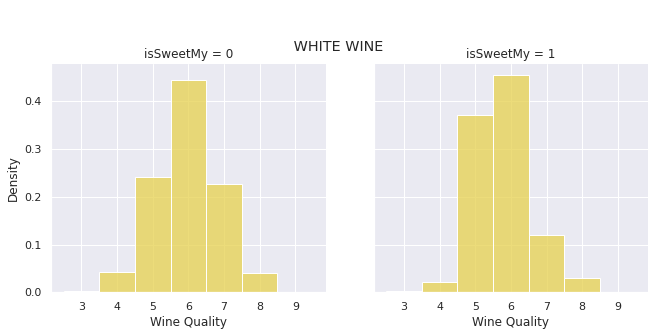

In [ ]:
sns.set(style="darkgrid")

r = sns.FacetGrid(rdf, col="isSweetMy", height=5, aspect=1)
w = sns.FacetGrid(wdf, col="isSweetMy", height=5, aspect=1)

r.map_dataframe(sns.histplot, x="quality", discrete=True, stat="density", color="darkred", kde=True)
w.map_dataframe(sns.histplot, x="quality", discrete=True, stat="density", color="#e6d14e")

r.fig.tight_layout(pad=4); w.fig.tight_layout(pad=4)
r.fig.suptitle('Quality distribution for sweet and dry wines\n\n RED WINE'); w.fig.suptitle('\n\n WHITE WINE')
r.set_axis_labels("Wine Quality", "Density"); w.set_axis_labels("Wine Quality", "Density")

plt.show()

### 2.5.2. Based on those graphs we can establish that:

----------**Red Wine**-----------<br>
1. The sweets wines have a better ratio of 6/10 and 7/10 ratings density than the dry wines - in sweets more 7/10 ratings were given, while the 6/10 density dropped
2. The density of the 5/10 rating is roughly the same in both wines
3. Dry wines get 3 and 4/10 ratings more often than sweet wines
4. There are no striking patterns or differences between sweet and dry wine that would indicate that residual sugar itself influences the quality of wine in any significant way. Therefore, it is unlikely to be chosen to train the machine learning models.
5. There is potentially a very small positive correlation - sweeter wines seem to be perceived higher quality (this will be later verified with a correlation matrix)
<br>

---------**White Wine**----------<br>
1. Dry wines are given the high scores 7 (significantly) and 8 (slightly) more often than sweet wines
2. The 6/10 rating is only slightly more common in sweet wines
3. Sweet wines get the 5/10 rating much more often than dry wines
4. There sems to be a slight negative correlation - the drier wines are perceived higher quality (will also be later verified with a correlation matrix)


# 3) Correlation analysis


## 3.1. Analyse correlations between each pair of variables
### Pair grid with pairplots for all variables with
1. scatterplots on the upper part of the grid
2. histplot with kde curve on the diagonal showing the overall distribution of the variable in the dataset
3. kdeplots on the bottom part of the grid

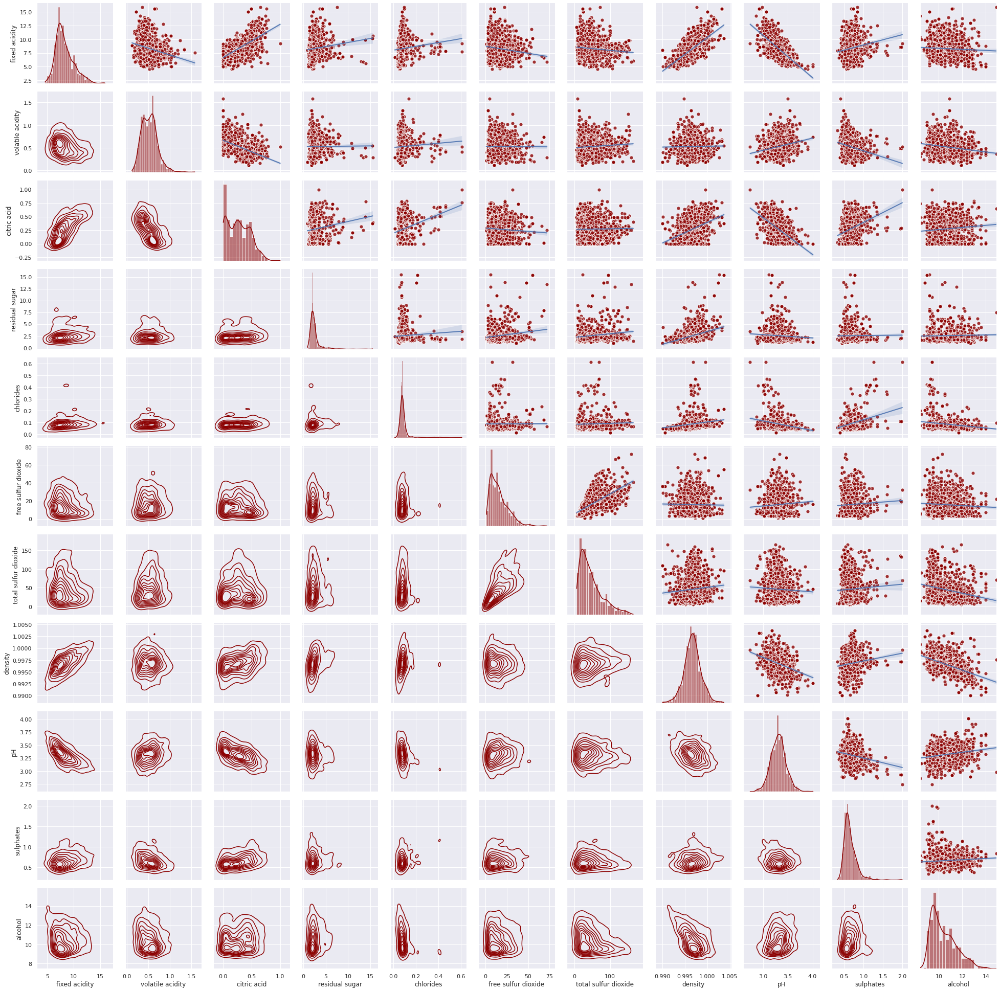

In [ ]:
# red wine
r = sns.PairGrid(rdf[numerical], diag_sharey=False)
r.map_upper(sns.regplot, color="darkred", scatter_kws={"s": 50, 'edgecolor':"w"}, line_kws={"color":"b", "alpha":0.9, "lw":2})
r.map_diag(sns.histplot, kde=True, color="darkred")
r.map_lower(sns.kdeplot, color="darkred", shade=False)
plt.show()

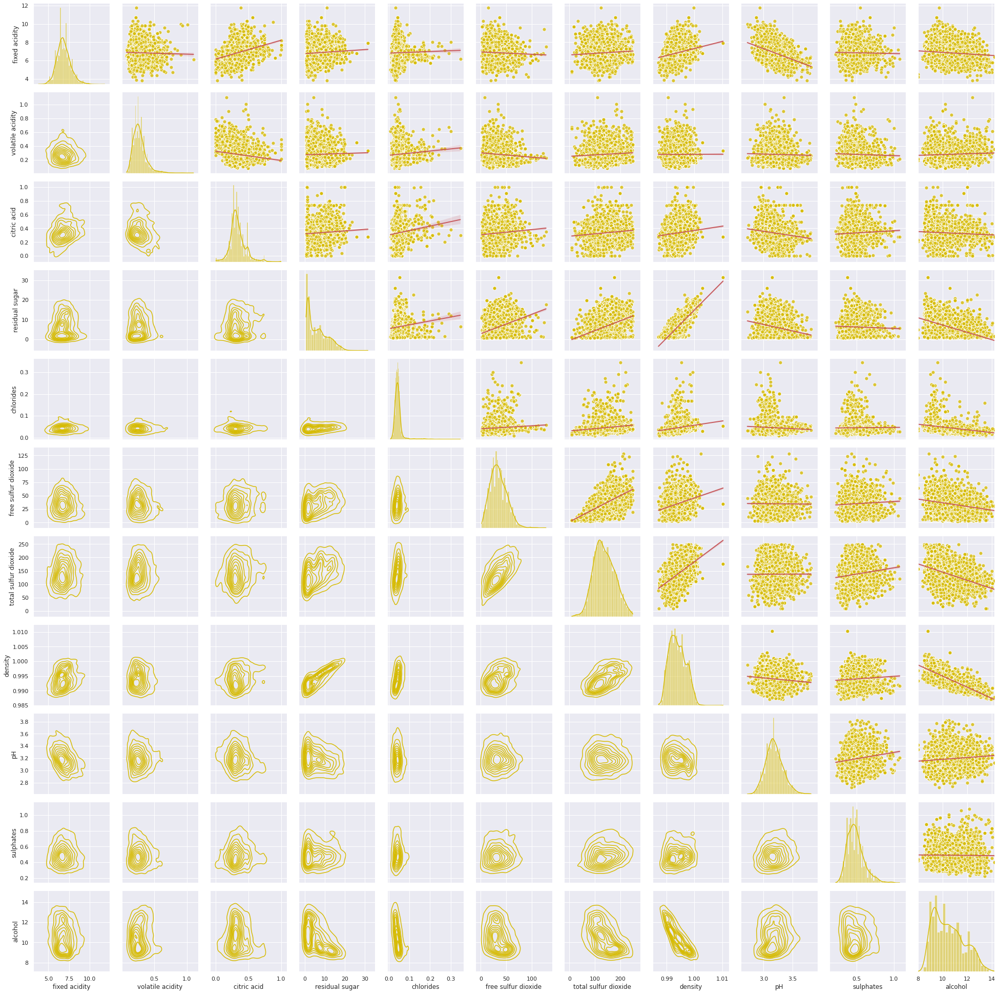

In [ ]:
# white wine

w = sns.PairGrid(wdf[numerical], diag_sharey=False)
w.map_upper(sns.regplot, color="#d6bb04", scatter_kws={"s": 50, 'edgecolor':"w"}, line_kws={"color":"r", "alpha":0.9, "lw":2})
w.map_diag(sns.histplot, kde=True, color="#d6bb04")
w.map_lower(sns.kdeplot, color="#d6bb04", shade=False)
plt.show()

## 3.2. Analyse correlations between each variable and the quality

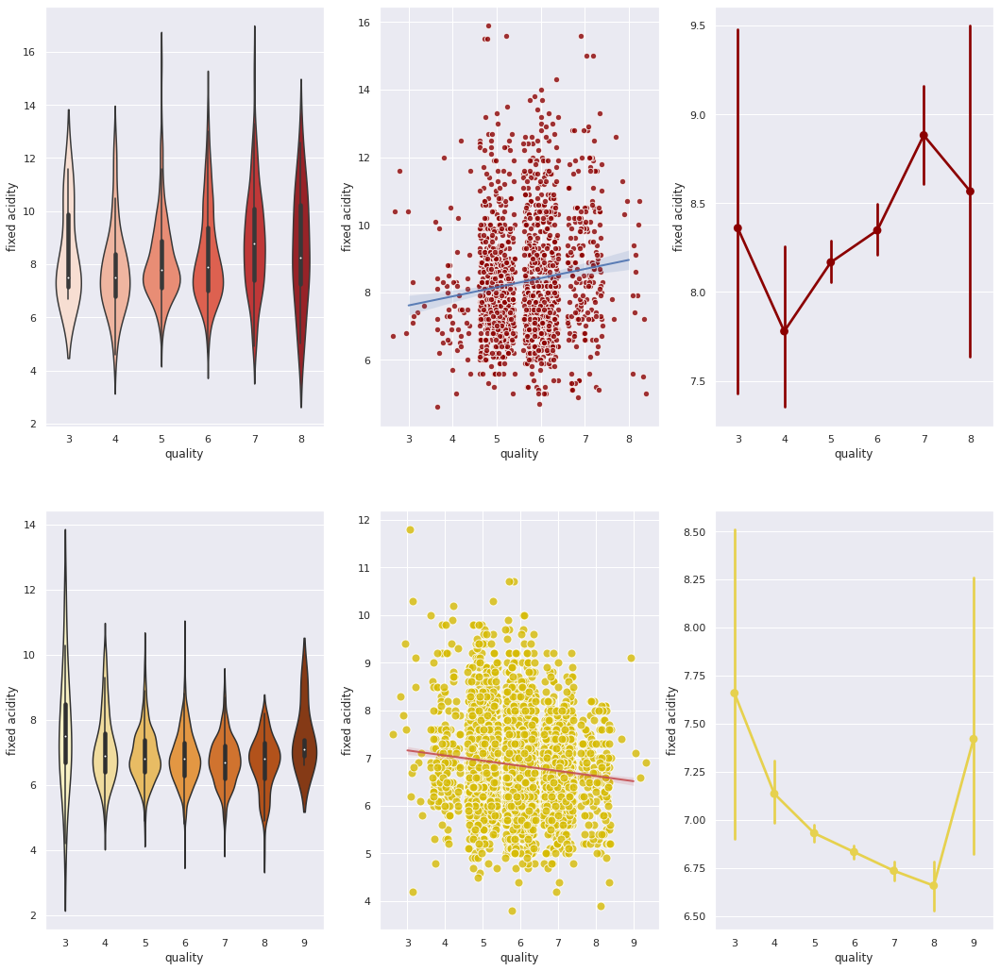

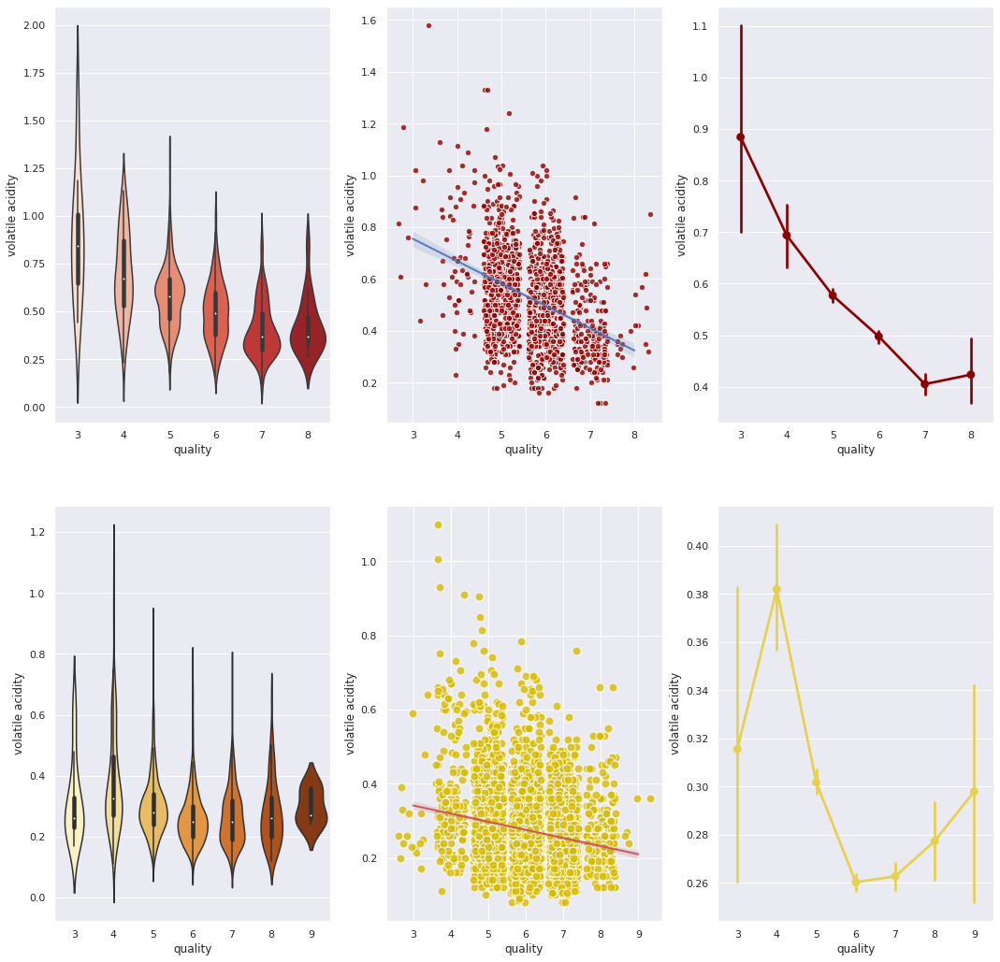

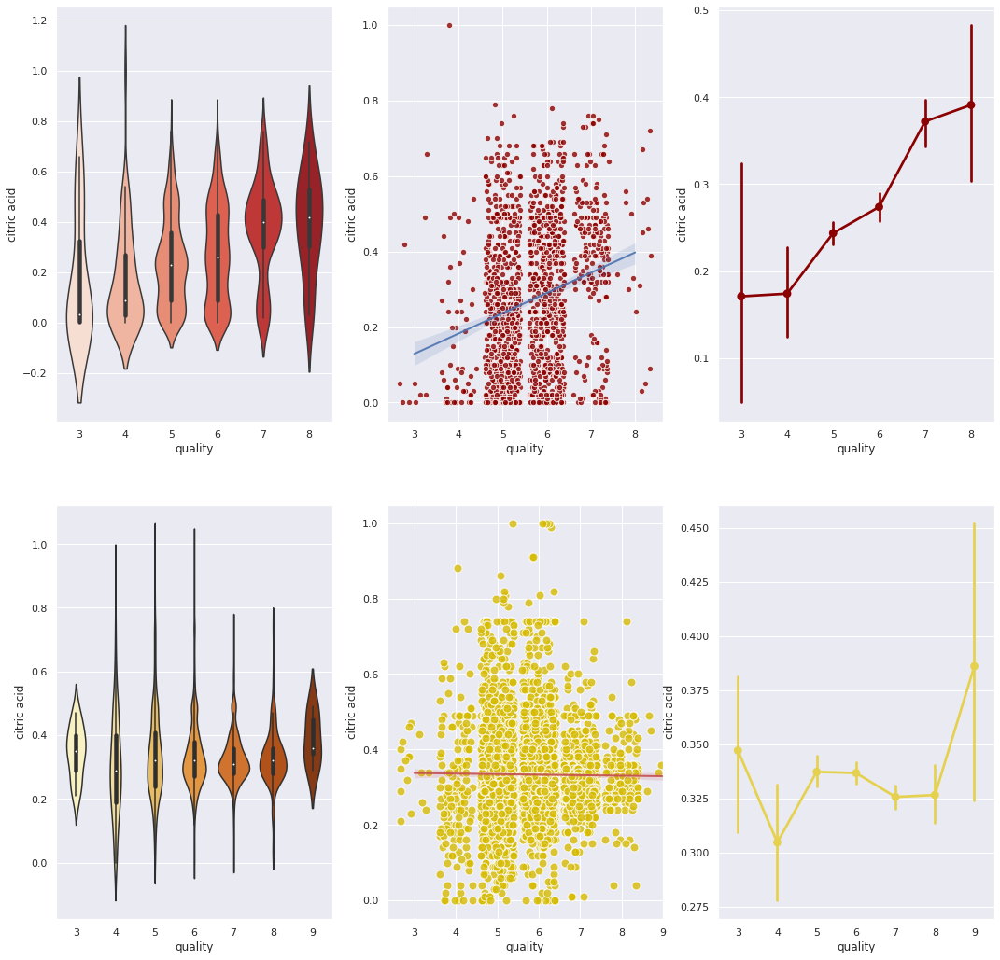

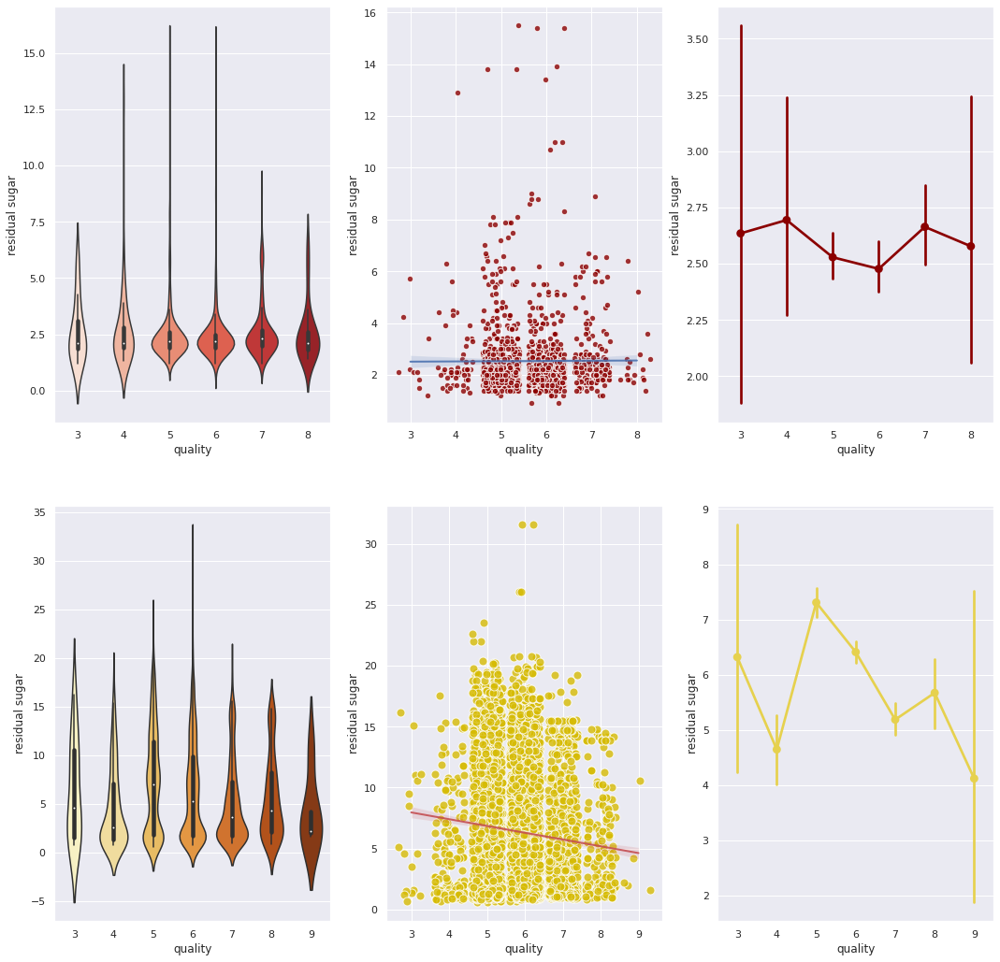

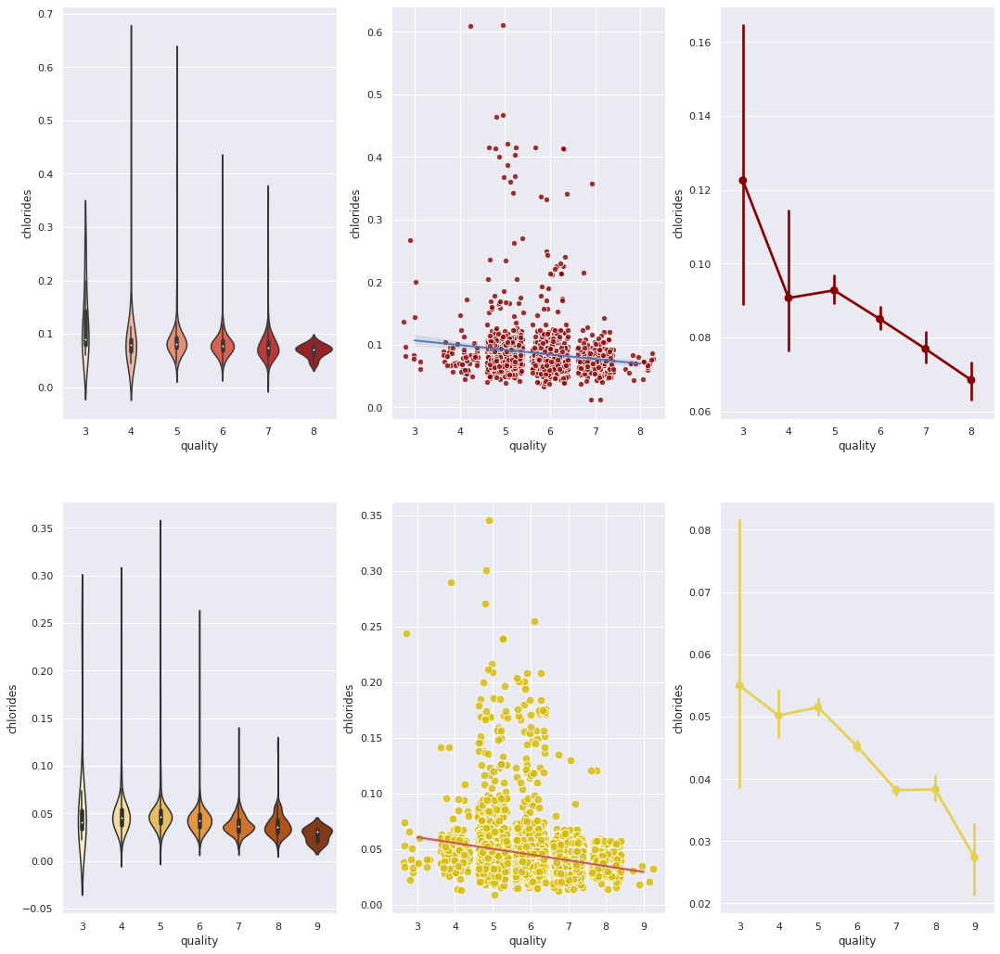

...

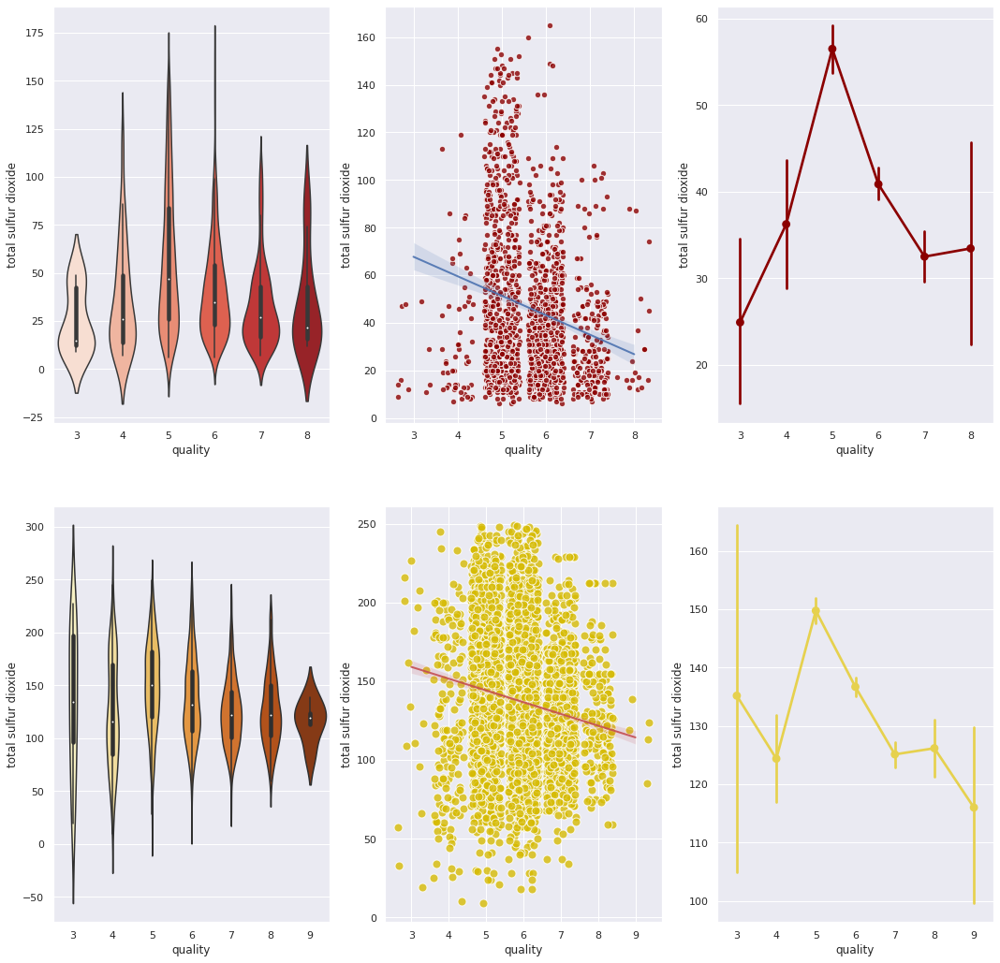

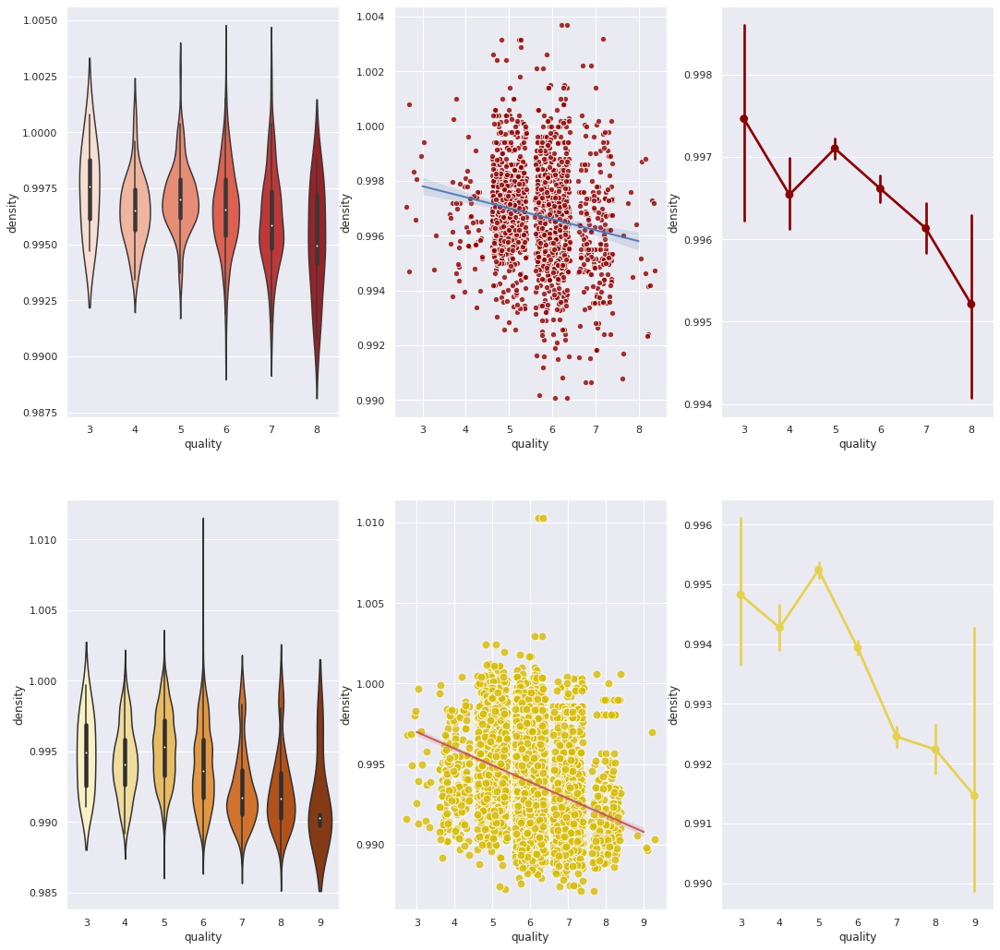

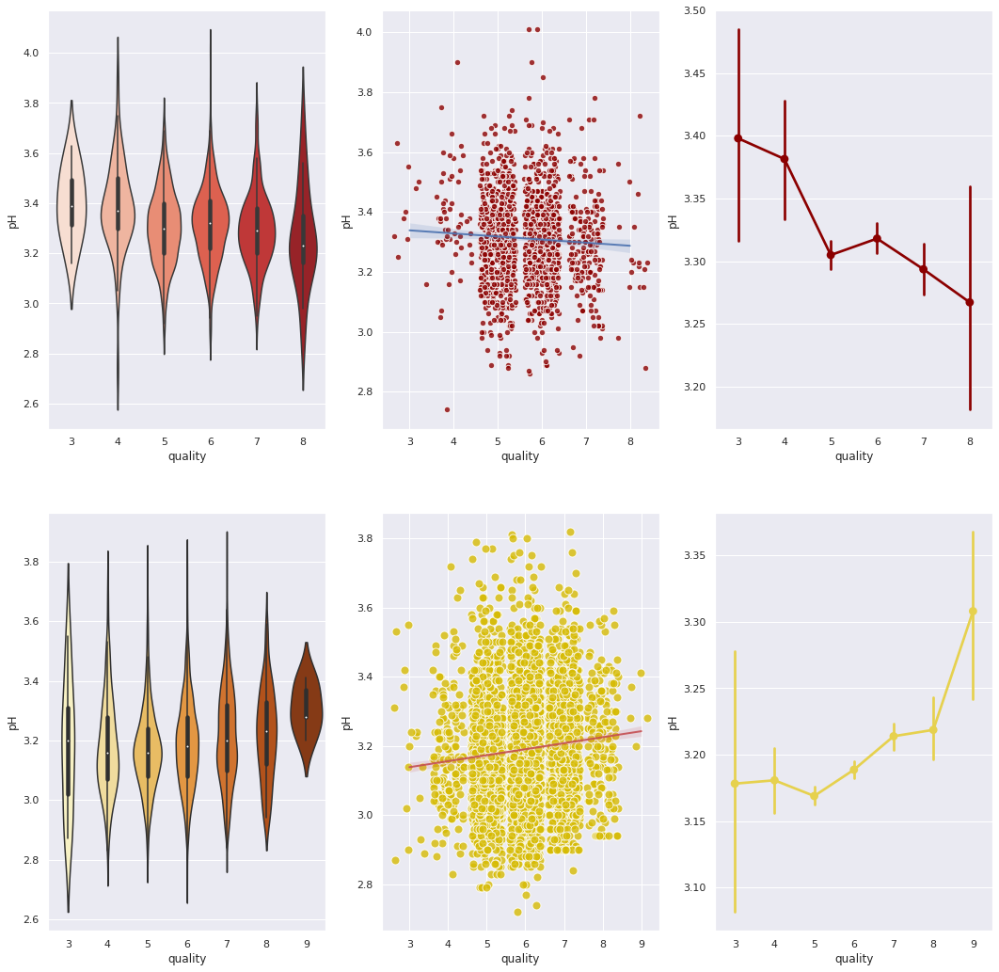

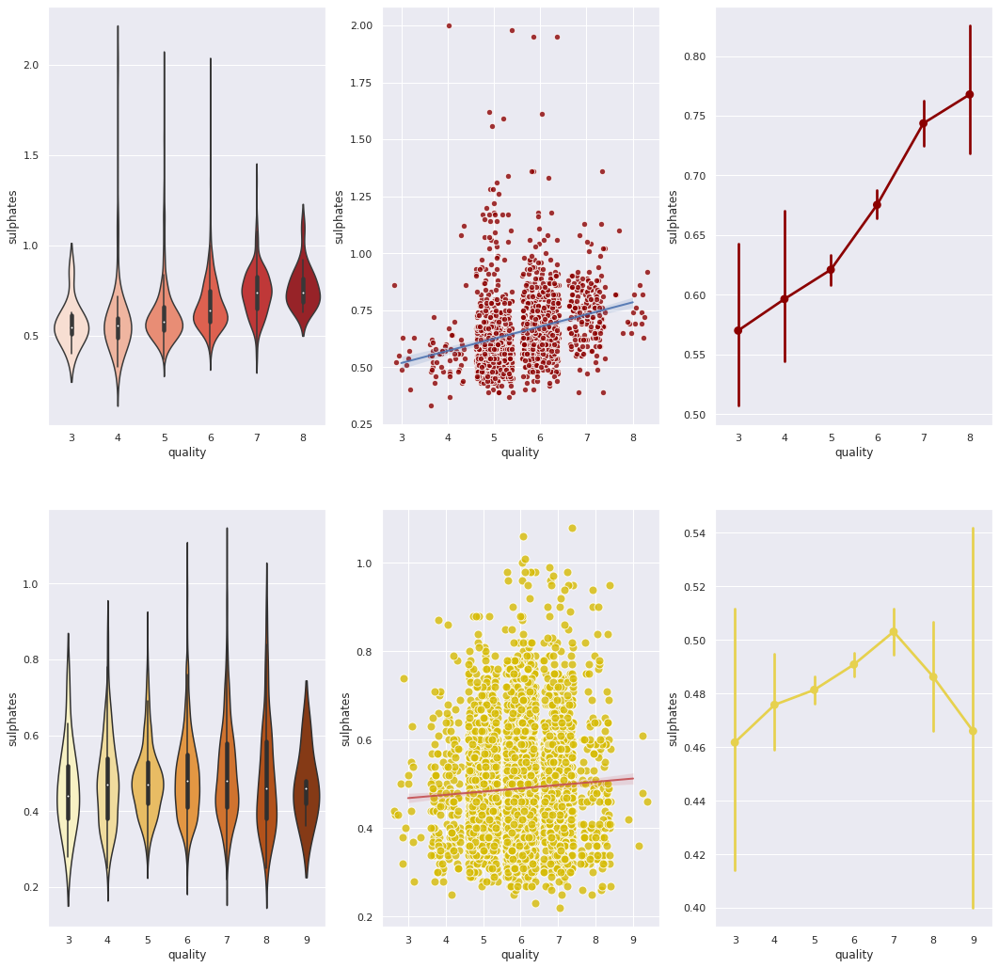

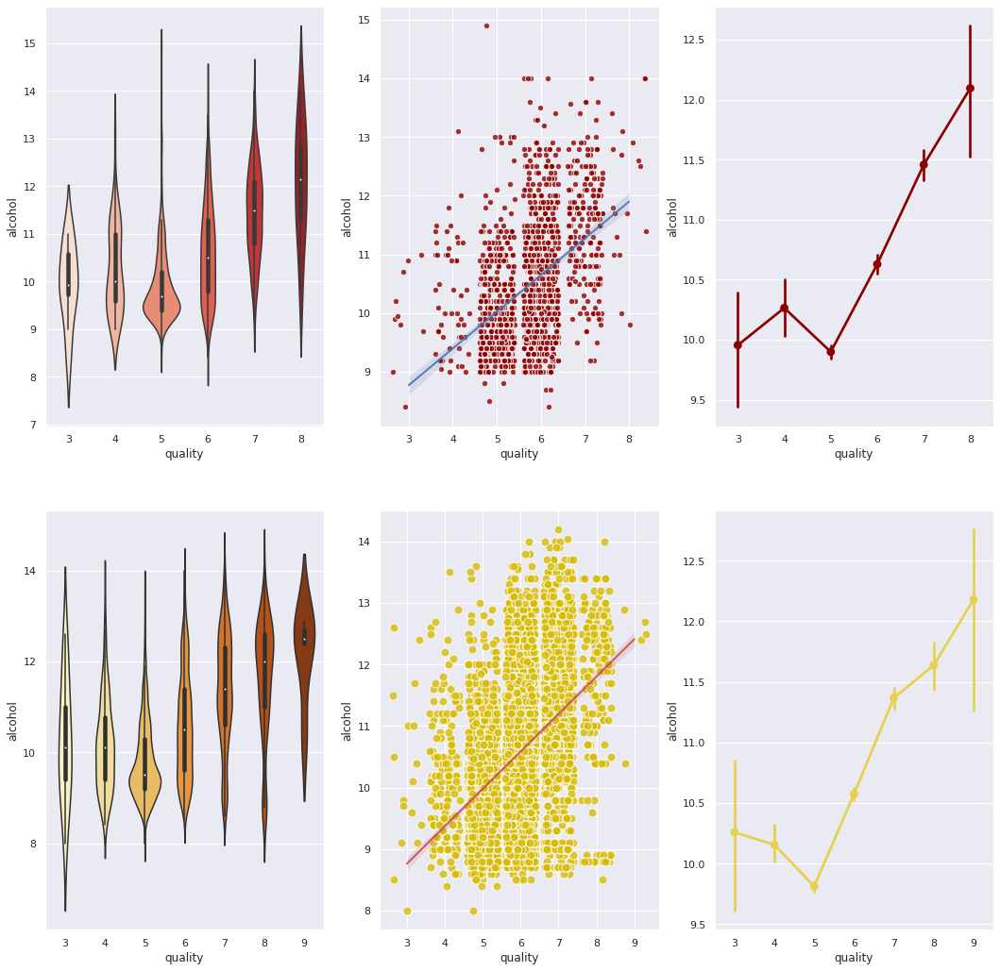

In [ ]:
for v in numerical:
  
  # creating a figure composed of multiple matplotlib.Axes objects (ax_box and ax_hist)
  f, ((ax_1_r, ax_2_r, ax_3_r), (ax_1_w, ax_2_w, ax_3_w)) = plt.subplots(2, 3, sharex=False, figsize=(18,18))

  #red wine
  sns.violinplot(x='quality', y=v, data=rdf, palette="Reds", ax=ax_1_r)
  sns.regplot(x="quality", y=v, data=rdf, color="darkred", ax=ax_2_r, x_jitter=.4, scatter_kws={"s": 40, 'edgecolor':"w"}, line_kws={"color":"b", "alpha":0.9, "lw":2})
  sns.pointplot(x='quality', y=v, data=rdf, ax=ax_3_r, color="darkred")

  #white wine
  sns.violinplot(x='quality', y=v, data=wdf, palette="YlOrBr", ax=ax_1_w)
  sns.regplot(x="quality", y=v, data=wdf, color="#d6bb04", ax=ax_2_w, x_jitter=.4, scatter_kws={"s": 80, 'edgecolor':"w"}, line_kws={"color":"r", "alpha":0.9, "lw":2})
  sns.pointplot(x='quality', y=v, data=wdf, ax=ax_3_w, color="#e6d14e")

  plt.show()

### Observations

The variables which relationship with quality stands out the most at first glance are:<br>

**RED WINE**
  * sulphates - positive
  * alcohol - positive
  * volatile acidity - negative
  * total sulphur dioxide - negative


**WHITE WINE**
  * alcohol
  * density
  * chlorides



## 3.3. Correlation matrices between all features and quality
Final confirmation of the findings in the previous points and one of the lasts steps to deciding which features to use for the model.

* Pairwise comparisons between all features show that some variables, such as citric acid, residual sugar, or alcohol, do not have normal, Gaussian distribution, and that not for all pairs can the linearity of relationship be clearly defined. 

* The Spearman’s correlation coefficient, due to its non-parametric nature, deals with such data better than Pearson’s correlation, while still measuring the relationship between two variables, as opposed to Kendall’s dependence 

https://ademos.people.uic.edu/Chapter22.html#:~:text=we%20can%20see%20pearson%20and,they%20correlate%20normally%20distributed%20data. 

* Since Spearman’s method is more reliable in presence of outliers and still performs equally good to Pearson’s when the data turns out to be Gaussian, it was chosen for the calculation of correlations matrices 
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3576830/

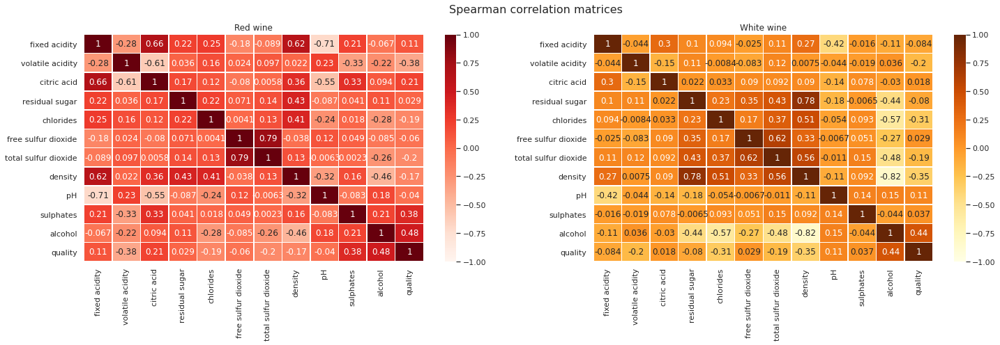

In [ ]:
# creating a figure composed of two matplotlib.Axes objects
f, (ax_1, ax_2) = plt.subplots(1, 2, sharex=False, figsize=(24,6))

sns.heatmap(rdf.corr(method="spearman"), annot=True, linewidths=.5, vmin=-1, vmax=1, cmap='Reds', ax=ax_1)
sns.heatmap(wdf.corr(method="spearman"), annot=True, linewidths=.5, vmin=-1, vmax=1, cmap='YlOrBr', ax=ax_2)

f.suptitle("Spearman correlation matrices", fontsize=16)
ax_1.set_title("Red wine"); ax_2.set_title("White wine"); 
plt.show()

We can observe that for **red wine** the quality is the most correlated with:
1. alcohol - positive correlation 0.48
2. volatile acidity - negative correlation -0.39
3. sulpahates - positive correlation 0.25
4. citric acid - positvie correlation 0.23

For **white wine** the correlations look as follows:
1. alcohol - positive corr 0.44
2. density - negative corr -0.31
3. chlorides - negatie corr -0.21

Volatile acidity places itself only at 4th place for white wine with -0.19 negative correlation

# 4) Machine learning for binary classification problem

## 4.1. Choosing the best threshold for all binary classifiers using logistic regression with all features

### 4.1.1 Prepare the data

#### From the dataframe without outliers, which was prepared in the data pre-processing phase, delete unused categorical variables

In [ ]:
# no categorical variables that were made in the pre-processing of the data
rdf_binary = rdf.drop(columns=['isSweetMd',	'isSweet75',	'isSweetMn'])
wdf_binary = wdf.drop(columns=['isSweetMd',	'isSweet75',	'isSweetMn'])

rdf_binary.head(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,alcohol_cat,isSweetMy
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,mid,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,mid,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,mid,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,mid,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,mid,0
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,mid,0
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5,mid,0
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,mid,0
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,mid,0
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5,mid,1


#### Perform one-hot encoding on the alcohol_cat categorical variable

* One-hot encoding with pandas get_dummies function (https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html). 
* One-hot encoding is a common categorical encoding technique, which creates new binary columns for each category, thus avoiding improper weighting of the values (as in case of assigning 0 to ‘cat’ and 1 to ‘dog’, indicating ‘dog’ is ‘more’)(https://pbpython.com/categorical-encoding.html) and making the categorical variable easier to use by the models (https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/). 


<br>
** In this case, because alcohol_cat is ordinal, direct label encoding could have been used, but for the sake of practice we stick with onehot encoding

In [ ]:
rdf_binary = pd.get_dummies(rdf_binary, columns = ['alcohol_cat'])
wdf_binary = pd.get_dummies(wdf_binary, columns = ['alcohol_cat'])

wdf_binary.head(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweetMy,alcohol_cat_low,alcohol_cat_mid,alcohol_cat_high
0,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0
1,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0
2,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0
3,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0
4,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0
5,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0
6,6.2,0.32,0.16,7.00,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,1,0,1,0
7,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0
8,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0
9,8.1,0.22,0.43,1.50,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6,0,0,1,0


#### Divide quality into "high" and "low", denoted by 1 and 0, respectively, on thresholds of 6, 5 and 7.

In [ ]:
# divide the quality into 0 and 1 for different thresholds and create suitable columns
rdf_binary['quality_6'] = pd.cut(x=rdf_binary['quality'], bins=[0, 6, 10], right=False, labels=[0,1])
rdf_binary['quality_5'] = pd.cut(x=rdf_binary['quality'], bins=[0, 5, 10], right=False, labels=[0,1])
rdf_binary['quality_7'] = pd.cut(x=rdf_binary['quality'], bins=[0, 7, 10], right=False, labels=[0,1])

wdf_binary['quality_6'] = pd.cut(x=wdf_binary['quality'], bins=[0, 6, 10], right=False, labels=[0,1])
wdf_binary['quality_5'] = pd.cut(x=wdf_binary['quality'], bins=[0, 5, 10], right=False, labels=[0,1])
wdf_binary['quality_7'] = pd.cut(x=wdf_binary['quality'], bins=[0, 7, 10], right=False, labels=[0,1])

wdf_binary.head(20)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweetMy,alcohol_cat_low,alcohol_cat_mid,alcohol_cat_high,quality_6,quality_5,quality_7
0,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0,1,1,0
1,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0,1,1,0
2,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0,1,1,0
3,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0,1,1,0
4,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0,1,1,0
5,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0,1,1,0
6,6.2,0.32,0.16,7.00,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,1,0,1,0,1,1,0
7,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0,1,1,0
8,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0,1,1,0
9,8.1,0.22,0.43,1.50,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6,0,0,1,0,1,1,0


#### Split the raw, unbalanced data to features and outcome

In [ ]:
# unbalanced data

# threshold 6
XR_unb_6 = rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values #take numpy arrays of the dataframes
yR_unb_6 = rdf_binary['quality_6'].values

XW_unb_6 = wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values
yW_unb_6 = wdf_binary['quality_6'].values

# threshold 5
XR_unb_5 = rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values
yR_unb_5 = rdf_binary['quality_5'].values

XW_unb_5 = wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values
yW_unb_5 = wdf_binary['quality_5'].values

# threshold 7
XR_unb_7 = rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values
yR_unb_7 = rdf_binary['quality_7'].values

XW_unb_7 = wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).values
yW_unb_7 = wdf_binary['quality_7'].values

print(XR_unb_6.shape, yR_unb_6.shape)
print(XW_unb_6.shape, yW_unb_6.shape)

(1597, 15) (1597,)
(4871, 15) (4871,)


### 4.1.2. Hold out validation with train_test_split function

#### Threshold 6

In [ ]:
# Split data in train / test before rebalancing
XR_train_unb6, XR_test6, yR_train_unb6, yR_test6 = train_test_split(XR_unb_6, yR_unb_6, train_size=0.8, test_size = 0.2, random_state=15)
XW_train_unb6, XW_test6, yW_train_unb6, yW_test6 = train_test_split(XW_unb_6, yW_unb_6, train_size=0.8, test_size = 0.2, random_state=15)

print("RED WINE")
print("Unbalanced train set:")
print(XR_train_unb6.shape); print(yR_train_unb6.shape)
print("Test set:")
print(XR_test6.shape); print(yR_test6.shape)

print("\nWHITE WINE")
print("Unbalanced train set:")
print(XW_train_unb6.shape), print(yW_train_unb6.shape)
print("Test set:")
print(XW_test6.shape), print(yW_test6.shape)

RED WINE
Unbalanced train set:
(1277, 15)
(1277,)
Test set:
(320, 15)
(320,)

WHITE WINE
Unbalanced train set:
(3896, 15)
(3896,)
Test set:
(975, 15)
(975,)


(None, None)

#### Threshold 5

In [ ]:
# Split data in train / test before rebalancing
XR_train_unb5, XR_test5, yR_train_unb5, yR_test5 = train_test_split(XR_unb_5, yR_unb_5, train_size=0.8, test_size = 0.2, random_state=15)
XW_train_unb5, XW_test5, yW_train_unb5, yW_test5 = train_test_split(XW_unb_5, yW_unb_5, train_size=0.8, test_size = 0.2, random_state=15)

print("RED WINE")
print("Unbalanced train set:")
print(XR_train_unb5.shape); print(yR_train_unb5.shape)
print("Test set:")
print(XR_test5.shape); print(yR_test5.shape)


print("\nWHITE WINE")
print("Unbalanced train set:")
print(XW_train_unb5.shape), print(yW_train_unb5.shape)
print("Test set:")
print(XW_test5.shape), print(yW_test5.shape)

RED WINE
Unbalanced train set:
(1277, 15)
(1277,)
Test set:
(320, 15)
(320,)

WHITE WINE
Unbalanced train set:
(3896, 15)
(3896,)
Test set:
(975, 15)
(975,)


(None, None)

#### Threshold 7

In [ ]:
# Split data in train / test before rebalancing
XR_train_unb7, XR_test7, yR_train_unb7, yR_test7 = train_test_split(XR_unb_7, yR_unb_7, train_size=0.8, test_size = 0.2, random_state=15)
XW_train_unb7, XW_test7, yW_train_unb7, yW_test7 = train_test_split(XW_unb_7, yW_unb_7, train_size=0.8, test_size = 0.2, random_state=15)

print("RED WINE")
print("Unbalanced Train set:")
print(XR_train_unb7.shape); print(yR_train_unb7.shape)
print("Test set:")
print(XR_test7.shape); print(yR_test7.shape)


print("\nWHITE WINE")
print("Unbalanced train set:")
print(XW_train_unb7.shape), print(yW_train_unb7.shape)
print("Test set:")
print(XW_test7.shape), print(yW_test7.shape)

RED WINE
Unbalanced Train set:
(1277, 15)
(1277,)
Test set:
(320, 15)
(320,)

WHITE WINE
Unbalanced train set:
(3896, 15)
(3896,)
Test set:
(975, 15)
(975,)


(None, None)

### 4.1.3. Define a function to be used to train and evaluate all classification models.


* sklearn pipeline with:
  - standardisation
  - normalisation
  - classification model
  - posibility to rebalance with any technique - going to be used later
  
* stratified k-fold validation strategy (skf)
* cross validation scores on training set using using the pipeline and skf
* printing basic training set metrics
* prediction report for training set based on cross validation predictions
* predictions on the test set with the pipeline fitted on the training set
* printing basic metrics for test set
* Prediction report for test set

In [ ]:
def imb_kfold_train_eval(X_train, y_train, X_test, y_test, wine_type, distrib, oversampler, model):

  # define the pipeline with standardisation, normalisation of the data, oversampling and finally a model of choice
    
  if distrib:
    if oversampler == None:
      pipeline_imb = make_pipeline_imb(StandardScaler(), MinMaxScaler(), model)
    else:
      pipeline_imb = make_pipeline_imb(oversampler, StandardScaler(), MinMaxScaler(), model)
  else:
    if oversampler == None:
      pipeline_imb = make_pipeline_imb(model)
    else:
      pipeline_imb = make_pipeline_imb(oversampler, model)
  

  # define the k-fold cross validation strategy
  skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

  #training set
  accuracy_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='accuracy', cv=skf)
  recall_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='recall', cv=skf)
  f1_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='f1', cv=skf)
  precision_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='precision', cv=skf)

  if oversampler == None:
    print(f"Results for unbalanced data\n")
  else:
    print(f"Results for rebalancing the data with {oversampler}\n")

  print(f"Training set metrics for {wine_type}:\n")
  print(f"Mean Accuracy: {accuracy_scores.mean():.3f} (± {accuracy_scores.std() * 2:.3f})")
  print(f"Mean Recall score: {recall_scores.mean():.3f} (± {recall_scores.std() * 2:.3f})")
  print(f"Mean Precision score: {precision_scores.mean():.3f} (± {precision_scores.std() * 2:.3f})")
  print(f"Mean f1-score: {f1_scores.mean():.3f} (± {f1_scores.std() * 2:.3f})")

  # predictions on training set
  preds = cross_val_predict(pipeline_imb, X_train, y_train, cv=skf)

  # test set
  pipeline_imb.fit(X_train, y_train)
  test_preds = pipeline_imb.predict(X_test)

  print(f"\nTest set metrics for {wine_type}:\n")
  print(f"Mean Accuracy: {accuracy_score(y_test, test_preds):.3f}")
  print(f"Mean Recall score: {recall_score(y_test, test_preds):.3f}")
  print(f"Mean Precision score: {precision_score(y_test, test_preds):.3f}")
  print(f"Mean f1-score: {f1_score(y_test, test_preds):.3f}")
  
  # training set report
  print(f"\n{wine_type} Predictions Report on TRAINING set: \n")
  print(classification_report(y_train, preds))

  # test set report
  print(f"\n{wine_type} Predictions Report on TEST set: \n")
  print(classification_report(y_test, test_preds))

  # return the classifier
  return pipeline_imb

### 4.1.4. Check the balance of quality values for each threshold

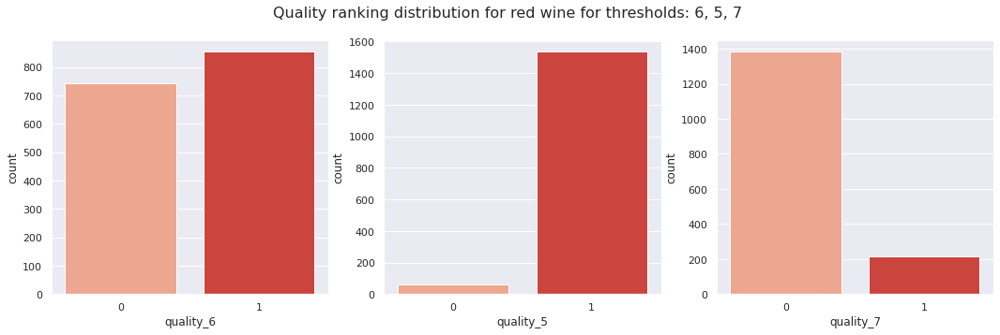

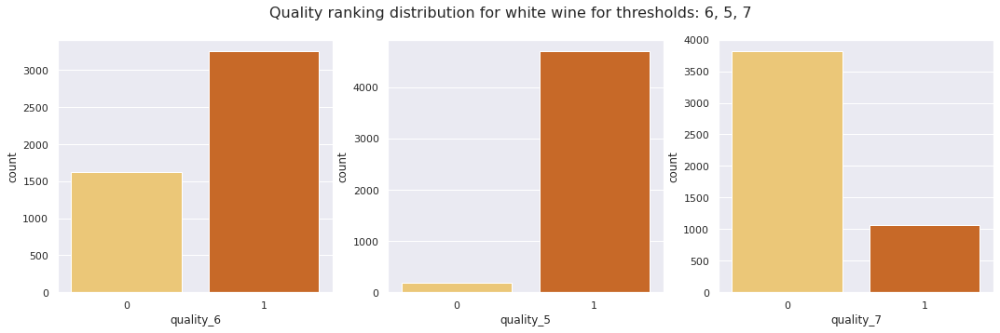

In [ ]:
f, (ax_1_r, ax_2_r, ax_3_r) = plt.subplots(1, 3, sharex=False, figsize=(18,5))

sns.countplot(x='quality_6', data=rdf_binary, ax=ax_1_r, palette="Reds")
sns.countplot(x='quality_5', data=rdf_binary, ax=ax_2_r, palette="Reds")
sns.countplot(x='quality_7', data=rdf_binary, ax=ax_3_r, palette="Reds")

f.suptitle("Quality ranking distribution for red wine for thresholds: 6, 5, 7", fontsize=16)
plt.show()

f, (ax_1_w, ax_2_w, ax_3_w) = plt.subplots(1, 3, sharex=False, figsize=(18,5))

f.suptitle("Quality ranking distribution for white wine for thresholds: 6, 5, 7", fontsize=16)
sns.countplot(x='quality_6', data=wdf_binary, ax=ax_1_w, palette="YlOrBr")
sns.countplot(x='quality_5', data=wdf_binary, ax=ax_2_w, palette="YlOrBr")
sns.countplot(x='quality_7', data=wdf_binary, ax=ax_3_w, palette="YlOrBr")

plt.show()

* Threshold 6: In red wine the discrepancy between the low and high quality ratings for threshold of 6 is not that big, whereas for white wine the high quality ratings are about twice as numerous as the low quality ones.

* Threshold 5 and 7: both wines severely imbalanced.

### 4.1.5. Training and evaluating the unbalanced Logistic Regression models
* accuracy, recall, precision, f1score
* classification reports
* combined ROC curves and AUC scores

Specify the model

In [ ]:
log_reg = LogisticRegression(random_state=10, solver="lbfgs", max_iter=10000)

#### Threshold 6

In [ ]:
### Threshold 6

#Red wine
log_reg6_r_unb = imb_kfold_train_eval(XR_train_unb6, yR_train_unb6, XR_test6, yR_test6, "RED WINE", True, None, log_reg)

#white wine
log_reg6_w_unb = imb_kfold_train_eval(XW_train_unb6, yW_train_unb6, XW_test6, yW_test6, "WHITE WINE", True, None, log_reg)

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.742 (± 0.045)
Mean Recall score: 0.722 (± 0.071)
Mean Precision score: 0.776 (± 0.059)
Mean f1-score: 0.747 (± 0.046)

Test set metrics for RED WINE:

Mean Accuracy: 0.731
Mean Recall score: 0.712
Mean Precision score: 0.783
Mean f1-score: 0.746

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.71      0.76      0.74       601
           1       0.77      0.72      0.75       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.74      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.68      0.76      0.72       143
           1       0.78      0.71      0.75       177

    accuracy                           0.73       320
   macro avg       0.73      0.73  

#### Threshold 5

In [ ]:
### Threshold 5 

#Red wine
log_reg5_r_unb = imb_kfold_train_eval(XR_train_unb5, yR_train_unb5, XR_test5, yR_test5, "RED WINE", True, None, log_reg)

#white wine
log_reg5_w_unb = imb_kfold_train_eval(XW_train_unb5, yW_train_unb5, XW_test5, yW_test5, "WHITE WINE", True, None, log_reg)

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.958 (± 0.004)
Mean Recall score: 1.000 (± 0.000)
Mean Precision score: 0.958 (± 0.004)
Mean f1-score: 0.979 (± 0.002)

Test set metrics for RED WINE:

Mean Accuracy: 0.969
Mean Recall score: 1.000
Mean Precision score: 0.969
Mean f1-score: 0.984

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        53
           1       0.96      1.00      0.98      1224

    accuracy                           0.96      1277
   macro avg       0.48      0.50      0.49      1277
weighted avg       0.92      0.96      0.94      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.97      1.00      0.98       310

    accuracy                           0.97       320
   macro avg       0.48      0.50  

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Accuracy: 0.965 (± 0.001)
Mean Recall score: 1.000 (± 0.000)
Mean Precision score: 0.965 (± 0.001)
Mean f1-score: 0.982 (± 0.001)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.958
Mean Recall score: 1.000
Mean Precision score: 0.958
Mean f1-score: 0.979

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       1.00      0.01      0.03       138
           1       0.97      1.00      0.98      3758

    accuracy                           0.97      3896
   macro avg       0.98      0.51      0.51      3896
weighted avg       0.97      0.97      0.95      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        41
           1       0.96      1.00      0.98       934

    accuracy                           0.96       975
   macro avg       0.48    

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Threshold 7

In [ ]:
### Threshold 7 

#Red wine
log_reg7_r_unb = imb_kfold_train_eval(XR_train_unb7, yR_train_unb7, XR_test7, yR_test7, "RED WINE", True, None, log_reg)

#white wine
log_reg7_w_unb = imb_kfold_train_eval(XW_train_unb7, yW_train_unb7, XW_test7, yW_test7, "WHITE WINE", True, None, log_reg)

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.882 (± 0.014)
Mean Recall score: 0.303 (± 0.106)
Mean Precision score: 0.645 (± 0.092)
Mean f1-score: 0.410 (± 0.111)

Test set metrics for RED WINE:

Mean Accuracy: 0.863
Mean Recall score: 0.175
Mean Precision score: 0.389
Mean f1-score: 0.241

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1102
           1       0.65      0.30      0.41       175

    accuracy                           0.88      1277
   macro avg       0.77      0.64      0.67      1277
weighted avg       0.86      0.88      0.86      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       280
           1       0.39      0.17      0.24        40

    accuracy                           0.86       320
   macro avg       0.64      0.57  

#### Combined ROC curve

Threshold 6: ROC AUC=0.770
Threshold 5: ROC AUC=0.801
Threshold 7: ROC AUC=0.795


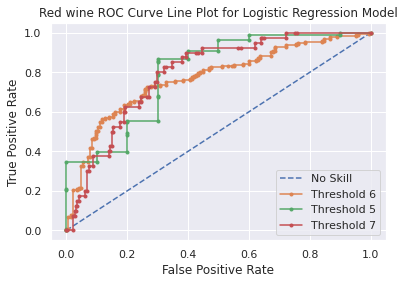

Threshold 6: ROC AUC=0.824
Threshold 5: ROC AUC=0.756
Threshold 7: ROC AUC=0.798


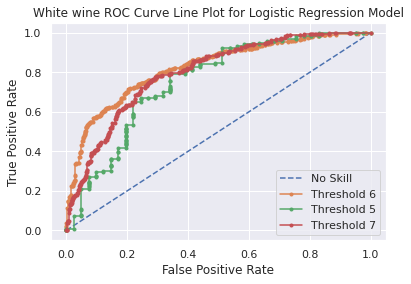

In [ ]:
print('Threshold 6: ROC AUC=%.3f' % (lr_auc_r6))
print('Threshold 5: ROC AUC=%.3f' % (lr_auc_r5))
print('Threshold 7: ROC AUC=%.3f' % (lr_auc_r7))

# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_r_6, tpr_r_6, marker='.', label='Threshold 6')
plt.plot(fpr_r_5, tpr_r_5, marker='.', label='Threshold 5')
plt.plot(fpr_r_7, tpr_r_7, marker='.', label='Threshold 7')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("Red wine ROC Curve Line Plot for Logistic Regression Model")
plt.show()

print('Threshold 6: ROC AUC=%.3f' % (lr_auc_w6))
print('Threshold 5: ROC AUC=%.3f' % (lr_auc_w5))
print('Threshold 7: ROC AUC=%.3f' % (lr_auc_w7))

# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_w_6, tpr_w_6, marker='.', label='Threshold 6')
plt.plot(fpr_w_5, tpr_w_5, marker='.', label='Threshold 5')
plt.plot(fpr_w_7, tpr_w_7, marker='.', label='Threshold 7')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("White wine ROC Curve Line Plot for Logistic Regression Model")
plt.show()

### 4.1.6. Accuracy and prediction report summary

RED WINE<br>
(on test set)

1. accuracy 
* 6 -> 73%
* 5-> 97%
* 7-> 87%
2. precision:
* 6 -> most balanced for both classes, with 71 and 77 for 0 and 1 respectively for training set with a dip to 68% for 0 class in test set
* 5 -> negative class is nearly or completely undetected, great for 1 (0.96) with the vast majority of samples from the set. In testing the precision for 0 was  0 as no samples were detected for this class. 96% for positive class in training and testing (this is the majority class)
* 7 -> 90% for the majority, negative class in training and 89 in testing. However, for the minority class it was 65 in training which fell to 39 in testing. This is still a better balance than for the threshold of 5 but this data was also less imbalanced. 
3. recall
* 6 -> 76% in training and test for 0,  72 and 71 for 1 in test
* 5 -> absolutely terrible for both training and testing (0.0). No samples were found. For positive class the recall was 100% for both training and testing.
* 7 -> of course the recall for the majority class (0) is high for both training and testing (0.97 and 0.96). But for the minority only aout 30% and 17% of the real positive samples were detected. With that in mind, the precision doesn't impress either, should be higher if the model was well skilled.
4. f-score
* 6 -> 72 and 75 for 0 and 1 in testing
* 5 ->> 0 and 98 for 0 and 1 in testing
* 7 -> 92 and 24 for 0 and 1 in testing

WHITE WINE<br>
(on test set) 

1. accuracy 
* 6-> 75%
* 5 -> 96%
* 7 -> 79%
2. precision
* 6 -> 67 and 76 for 0 and 1 classes in training and then a little increase to 72 for 0 in testing. Good score already, which can surely be improved with tuning of the model. 
* 5 -> 100% but for nonexistent recall (only 0.01) of all the negative samples. But in testing it was already 00%. Majority, positive class has 97 and 96% in training and testing.
* 7 -> 83 % for the majority, negative class in training and 81 in testing. The minority class had 62% precision in training which fell to 57% in testing.
3. recall
* 6 -> 0.45 for the minority class and 0.89 for the majority class in training. In testing the recall for 0 goes to 46% which is not too good. 91% for 1. Needs some rebalancing.
* 5 -> only 1% for negative class in both training and testing, 100% for both sets for postive class.
* 7 -> For 0 class 95% in training and testing. Under 30% for the minority class in both sets.
4. f1-score
* 6 -> 0.56 and 0.83 for 0 and 1 in testing
* 5 -> 0.0 and 98 for 0 and 1 in testing
* 7 -> 87 and 34 for 0 and 1 in testing

### 4.1.7. SUMMARY

Based on the above analysis it seems that the '6' is the best threshold to proceed with further analysis and the quest for the best performing model for binary wine quality classification. It is best balanced, with a slight advantage of the 'high' quality wines over the 'low' quality ones but not enough of an imablance to skew the metrics and make it hard to evaluate a model and get reliable results on unseen data. We can see that despite the accuracy for thresholds 5 and 7 being enticingly high, it stems solely from the fact that just by naively predicting the majority class every single time, we would still get such a result. However, by looking at precision and recall we can see that the minority classes are severely underdetected despite their low count and that in some cases, even if they finally get detected, they are still predicted wrongly. Therefore, for the easse of further analysis and model development and in search for the most balanced model I will use the '6' threshold to find the best binary classifier for this wine data.

## 4.2. Feature selection for the quality predicting models
* with the assumption that "high" quality starts from 6 and above, while the "low" quality is everything below 6:
0. "low": <6
1. "high": >=6

### 4.2.1. Determine feature importance
  * Decision Tree Classifier
  * SelectKBest


To have a better picture, a combination of features chosen by intrinsic (DecisionTree built-in feature_importance parameter) and filter-based (ANOVA correlation coefficient) methods will be selected. For the latter, because the input is numerical and output categorical, the easiest correlation based method to use would be the ANOVA correlation cofficient, available via the sklearn f_classif() function. 

https://machinelearningmastery.com/feature-selection-with-real-and-categorical-data/

#### Red wine

Decision Tree Feature Importance

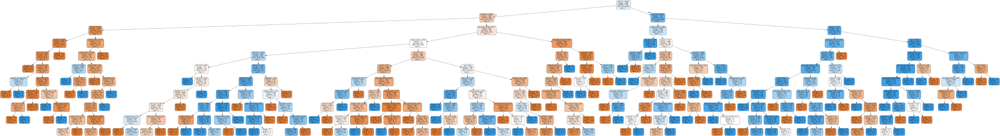

In [ ]:
## DECISION TREE CLASSIFIER

# criterion=entropy to enable us to run the feature importance
# setting max depth to control overfitting

# rdt_ft - red wine decision tree for features
rdt_ft = DecisionTreeClassifier(random_state=15, criterion="entropy", max_depth=10)
rdt_ft.fit(XR_unb_6, yR_unb_6)

# graphic representation
dot_data = tree.export_graphviz(rdt_ft, out_file=None, 
    feature_names=rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).columns,    
    class_names=rdf_binary['quality_6'].unique().astype(str),  
    filled=True, rounded=True,  
    special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [ ]:
#Running feature importance for red wine
print("Decision Tree Feature importance for RED WINE: \n")

r_feat_cols = []
r_feat_im = []

for indx, column in enumerate(rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1)):
  r_feat_cols.append(column)
  r_feat_im.append(rdt_ft.feature_importances_[indx])


# create a dataframe with the features and their importances
r_feat_df = zip(r_feat_cols, r_feat_im)
r_feat_df = pd.DataFrame(r_feat_df, columns=["Red wine feature", "Feature Importance"]).sort_values("Feature Importance", ascending=False).reset_index()

r_feat_df

Decision Tree Feature importance for RED WINE: 



,index,Red wine feature,Feature Importance
0,10,alcohol,0.251784
1,9,sulphates,0.137781
2,6,total sulfur dioxide,0.099814
3,4,chlorides,0.097734
4,1,volatile acidity,0.084748
5,2,citric acid,0.065988
6,8,pH,0.063136
7,3,residual sugar,0.056681
8,0,fixed acidity,0.047249
9,7,density,0.043242


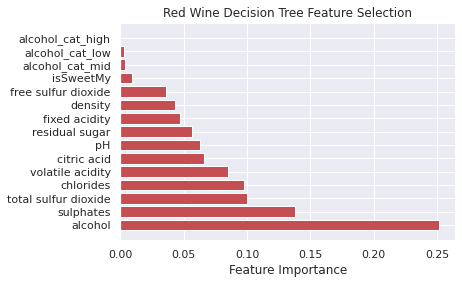

In [ ]:
plt.barh(y=r_feat_df["Red wine feature"], width=r_feat_df["Feature Importance"], color='r')
plt.xlabel("Feature Importance")
plt.title("Red Wine Decision Tree Feature Selection")
plt.show()

Sklearn ANOVA Feature Selection

In [ ]:
# apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=f_classif, k=15)
fit = bestfeatures.fit(XR_unb_6, yR_unb_6)

print("SelectKBest Feature Importance for RED WINE\n")

rdfscores = pd.DataFrame(fit.scores_)
rdfcolumns = pd.DataFrame(rdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).columns)

#concat two dataframes for better visualization 
featureScores_r = pd.concat([rdfcolumns, rdfscores], axis=1)
featureScores_r.columns = ['Red wine feature','SelectKBest Feature Importance']  #naming the dataframe columns
featureScores_r = featureScores_r.sort_values("SelectKBest Feature Importance", ascending=False).reset_index()
featureScores_r

SelectKBest Feature Importance for RED WINE



,index,Red wine feature,SelectKBest Feature Importance
0,10,alcohol,369.670162
1,14,alcohol_cat_high,212.226316
2,1,volatile acidity,182.536220
3,6,total sulfur dioxide,105.200397
4,9,sulphates,80.596457
5,12,alcohol_cat_low,46.104875
6,13,alcohol_cat_mid,44.509133
7,7,density,40.483266
8,2,citric acid,40.411972
9,4,chlorides,19.059327


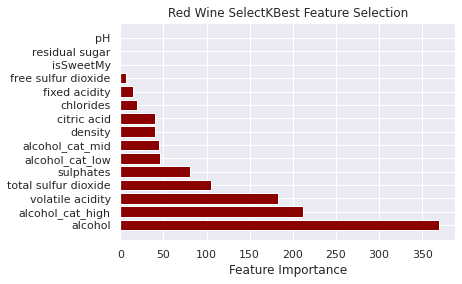

In [ ]:
plt.barh(y=featureScores_r["Red wine feature"], width=featureScores_r["SelectKBest Feature Importance"], color='darkred')
plt.xlabel("Feature Importance")
plt.title("Red Wine SelectKBest Feature Selection")
plt.show()

#### White Wine

Decision Tree Feature Importance

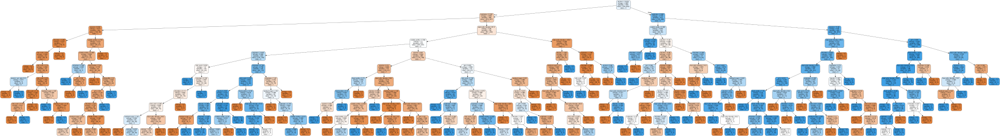

In [ ]:
# wdt - white wine decision tree
wdt_ft = DecisionTreeClassifier(random_state=15, criterion="entropy", max_depth=10)
wdt_ft.fit(XW_unb_6, yW_unb_6)

# graphic representation
dot_data = tree.export_graphviz(rdt_ft, out_file=None, 
    feature_names=wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).columns,    
    class_names=wdf_binary['quality_6'].unique().astype(str),  
    filled=True, rounded=True,  
    special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [ ]:
print("Decision Tree Feature importance for WHITE WINE \n")

w_feat_cols = []
w_feat_im = []

for indx, column in enumerate(wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1)):
  w_feat_cols.append(column)
  w_feat_im.append(wdt_ft.feature_importances_[indx])

# create a dataframe with the features and their importances
w_feat_df = zip(w_feat_cols, w_feat_im)
w_feat_df = pd.DataFrame(w_feat_df, columns=["White wine feature", "Feature Importance"]).sort_values("Feature Importance", ascending=False).reset_index()

w_feat_df

Decision Tree Feature importance for WHITE WINE 



,index,White wine feature,Feature Importance
0,10,alcohol,0.277520
1,1,volatile acidity,0.162945
2,5,free sulfur dioxide,0.114100
3,0,fixed acidity,0.076740
4,3,residual sugar,0.065041
5,6,total sulfur dioxide,0.063525
6,8,pH,0.053005
7,2,citric acid,0.052240
8,7,density,0.050293
9,9,sulphates,0.047544


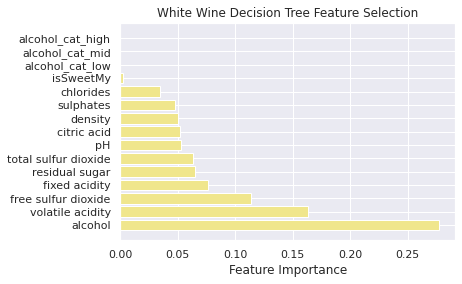

In [ ]:
plt.barh(y=w_feat_df["White wine feature"], width=w_feat_df["Feature Importance"], color='khaki')
plt.xlabel("Feature Importance")
plt.title("White Wine Decision Tree Feature Selection")
plt.show()

Sklearn ANOVA Feature Selection

In [ ]:
# apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=f_classif, k=15)
fit = bestfeatures.fit(XW_unb_6, yW_unb_6)

wdfscores = pd.DataFrame(fit.scores_)
wdfcolumns = pd.DataFrame(wdf_binary.drop(['quality', 'quality_6', 'quality_7', 'quality_5'], axis=1).columns)

# concat two dataframes for better visualization 
featureScores_w = pd.concat([wdfcolumns, wdfscores], axis=1)
featureScores_w.columns = ['White wine feature','SelectKBest Feature Importance']
featureScores_w = featureScores_w.sort_values("SelectKBest Feature Importance", ascending=False).reset_index()
featureScores_w

,index,White wine feature,SelectKBest Feature Importance
0,10,alcohol,830.437645
1,14,alcohol_cat_high,417.956035
2,7,density,397.385773
3,1,volatile acidity,262.024488
4,12,alcohol_cat_low,186.398826
5,4,chlorides,168.555986
6,6,total sulfur dioxide,129.496266
7,11,isSweetMy,63.653651
8,3,residual sugar,43.349020
9,0,fixed acidity,40.380286


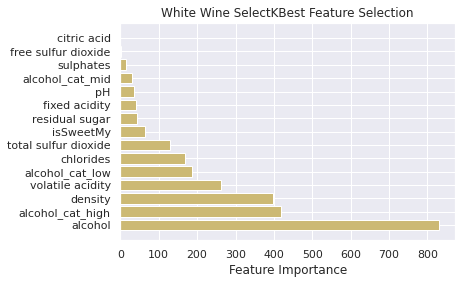

In [ ]:
plt.barh(y=featureScores_w["White wine feature"], width=featureScores_w["SelectKBest Feature Importance"], color='y')
plt.xlabel("Feature Importance")
plt.title("White Wine SelectKBest Feature Selection")
plt.show()

### 4.2.2. Conclusions and chosen features




#### Red wine

* Mostly following the result of the SelectKBest selection and choosing the first 4 features from there. 
* However, based on my previous correlation analysis and the Decision Tree Fature Importance I am adding chlorides as I found it to have a significant impact on the quality as well. 

In [ ]:
# features to train on:
feat_to_train_r = featureScores_r.iloc[[0, 1, 2, 3, 4, 9], [1]]
feat_to_train_r

,Red wine feature
0,alcohol
1,alcohol_cat_high
2,volatile acidity
3,total sulfur dioxide
4,sulphates
9,chlorides


#### White wine

* Similarly to red wine I am going to rely on the SelectKBest selection, with support from Decision Tree and my correlation matrices. 
* Based on the first one, I chose alcohol, alcohol_cat_high, volatile density, chlorides and isSweetMy. 
  * Despite the correlation matrices showing that sugar isn't important, other sources showed that the sweetness is actually much more relelvant for white wine than red so I am going to trust the feature importance here.
  * I have omitted density as it has a very high correlation with alcohol and this could lower the accuracy of the model
  * I also omitted alcohol_cat_low as I already have two other alcohol columns
  * I omitted total sulphur dioxide as in the decision tree classifier it is  lower than free sulfur dioxide which I chose. This has also been confirmed in this study: https://www.sciencedirect.com/science/article/pii/S0167923609001377

In [ ]:
#features to train the model
feat_to_train_w = featureScores_w.iloc[[0, 1, 3, 5, 7, 13], [1]]
feat_to_train_w

,White wine feature
0,alcohol
1,alcohol_cat_high
3,volatile acidity
5,chlorides
7,isSweetMy
13,free sulfur dioxide


## 4.3. Prepare the dataframes with selected features

#### Binary dataframes for both wines with selected features

In [ ]:
rdf_bin_sf = rdf_binary.loc[:,['alcohol', 'alcohol_cat_high', 'sulphates', 'chlorides', 'total sulfur dioxide', 'volatile acidity', 'quality_6']]

wdf_bin_sf = wdf_binary.loc[:,['alcohol', 'alcohol_cat_high', 'volatile acidity', 'isSweetMy', 'free sulfur dioxide', 'chlorides', 'quality_6']]

wdf_bin_sf.head(10)

,alcohol,alcohol_cat_high,volatile acidity,isSweetMy,free sulfur dioxide,chlorides,quality_6
0,8.8,0,0.27,1,45.0,0.045,1
1,9.5,0,0.30,0,14.0,0.049,1
2,10.1,0,0.28,1,30.0,0.050,1
3,9.9,0,0.23,1,47.0,0.058,1
4,9.9,0,0.23,1,47.0,0.058,1
5,10.1,0,0.28,1,30.0,0.050,1
6,9.6,0,0.32,1,30.0,0.045,1
7,8.8,0,0.27,1,45.0,0.045,1
8,9.5,0,0.30,0,14.0,0.049,1
9,11.0,0,0.22,0,28.0,0.044,1


#### Split the raw, unbalanced data to features and outcome

In [ ]:
# unbalanced data

# threshold 6
XR_unb_sf = rdf_bin_sf.drop(['quality_6'], axis=1).values
yR_unb_sf = rdf_bin_sf['quality_6'].values

XW_unb_sf = wdf_bin_sf.drop(['quality_6'], axis=1).values
yW_unb_sf = wdf_bin_sf['quality_6'].values

print(XR_unb_sf.shape, yR_unb_sf.shape)
print(XW_unb_sf.shape, yW_unb_sf.shape)

(1597, 6) (1597,)
(4871, 6) (4871,)


## 4.4. Prepare new training and test sets for the classification models

In [ ]:
# RED WINE
XR_train, XR_test, yR_train, yR_test = train_test_split(XR_unb_sf, yR_unb_sf, train_size=0.8, test_size = 0.2, random_state=15)

# WHITE WINE
XW_train, XW_test, yW_train, yW_test = train_test_split(XW_unb_sf, yW_unb_sf, train_size=0.8, test_size=0.2, random_state=15)

## 4.5. Logistic Regression
* with the assumption that "high" quality starts from 6 and above, while the "low" quality is everything below 6:
0. "low": <6
1. "high": >=6

### 4.5.1. Fitting and evaluating models on **imbalanced** data
* no rebalancing techniques are used

#### Red wine

In [ ]:
log_reg_unb_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, None, LogisticRegression(random_state=10, solver="lbfgs", max_iter=10000))

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.741 (± 0.041)
Mean Recall score: 0.726 (± 0.065)
Mean Precision score: 0.772 (± 0.052)
Mean f1-score: 0.748 (± 0.043)

Test set metrics for RED WINE:

Mean Accuracy: 0.734
Mean Recall score: 0.734
Mean Precision score: 0.774
Mean f1-score: 0.754

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.71      0.76      0.73       601
           1       0.77      0.73      0.75       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.74      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.69      0.73      0.71       143
           1       0.77      0.73      0.75       177

    accuracy                           0.73       320
   macro avg       0.73      0.73  

#### White wine

In [ ]:
log_reg_unb_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, None, LogisticRegression(random_state=10, solver="lbfgs", max_iter=10000))

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Accuracy: 0.741 (± 0.020)
Mean Recall score: 0.899 (± 0.024)
Mean Precision score: 0.759 (± 0.018)
Mean f1-score: 0.823 (± 0.013)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.757
Mean Recall score: 0.908
Mean Precision score: 0.766
Mean f1-score: 0.831

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.67      0.42      0.52      1289
           1       0.76      0.90      0.82      2607

    accuracy                           0.74      3896
   macro avg       0.72      0.66      0.67      3896
weighted avg       0.73      0.74      0.72      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.72      0.47      0.57       333
           1       0.77      0.91      0.83       642

    accuracy                           0.76       975
   macro avg       0.75    

### 4.5.2. Fitting and evaluating models on **balanced** data
* comparing various oversampling techniques:
  - SMOTE
  - RandomOverSampler
  - SVMSMOTE
  - ADASYN

In [ ]:
model = LogisticRegression(random_state=10, solver="lbfgs", max_iter=10000)

### RED WHITE

# SMOTE
log_reg_reb_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, SMOTE(random_state=42), model)
print("\n ------------------------------------------------------------------ \n")
# RandomOVerSampler
log_reg_reb2_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, RandomOverSampler(random_state=42), model)
print("\n ------------------------------------------------------------------ \n")
# SVMSMOTE
log_reg_reb3_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, SVMSMOTE(random_state=42), model)

print("\n ================================================================== \n")

### WHITE WINE

# ADASYN
log_reg_reb_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, ADASYN(random_state=42), model)
print("\n ------------------------------------------------------------------ \n")
# RandomOVerSampler
log_reg_reb2_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, RandomOverSampler(random_state=42), model)
print("\n ------------------------------------------------------------------ \n")
# SVMSMOTE
log_reg_reb3_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, SVMSMOTE(random_state=42), model)

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.739 (± 0.027)
Mean Recall score: 0.685 (± 0.058)
Mean Precision score: 0.796 (± 0.065)
Mean f1-score: 0.735 (± 0.026)

Test set metrics for RED WINE:

Mean Accuracy: 0.734
Mean Recall score: 0.695
Mean Precision score: 0.799
Mean f1-score: 0.743

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.69      0.80      0.74       601
           1       0.79      0.68      0.74       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.75      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

#### Confusion matrices for each oversampler

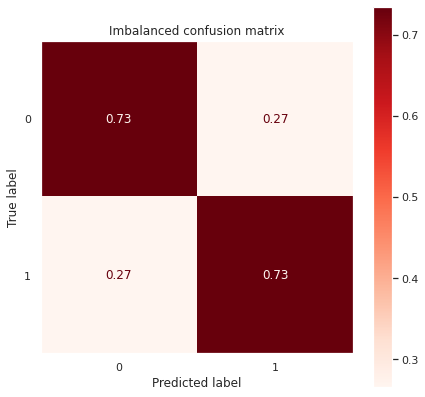

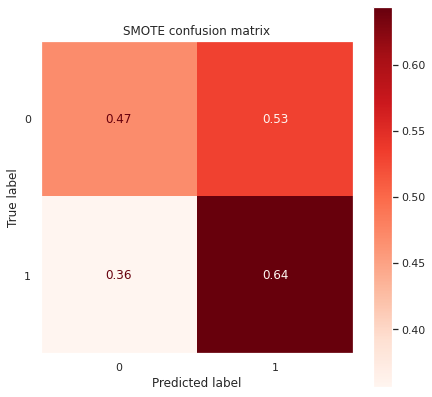

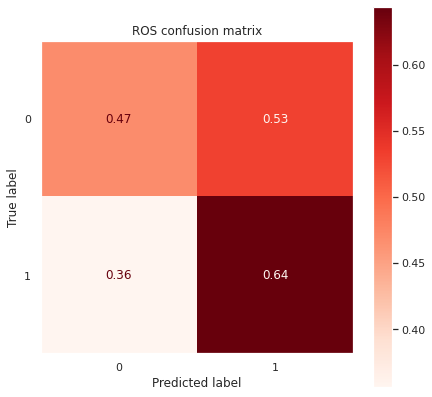

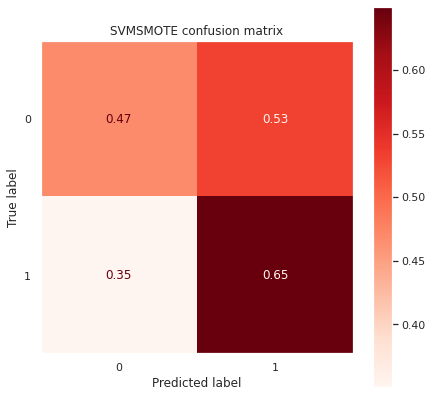

In [ ]:
titles_options = [("Imbalanced confusion matrix", log_reg_unb_r), ("SMOTE confusion matrix", log_reg_reb_r), ("ROS confusion matrix", log_reg_reb2_r),("SVMSMOTE confusion matrix", log_reg_reb3_r)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XR_test, yR_test,
                                 cmap="Reds", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

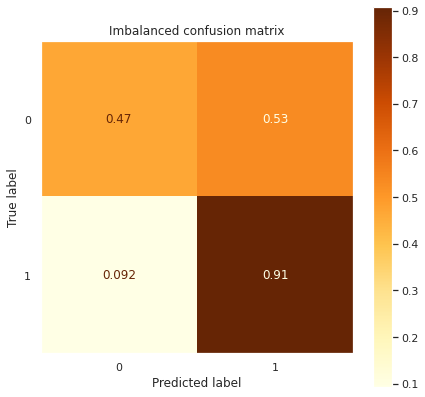

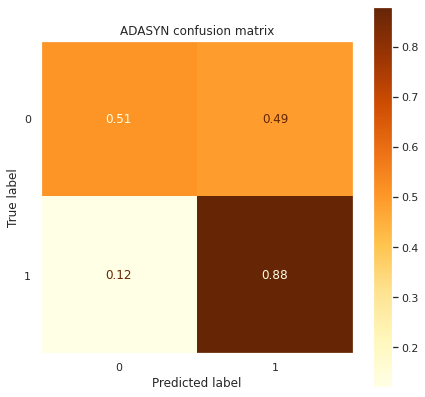

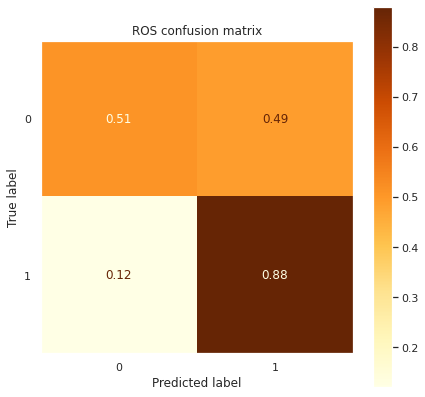

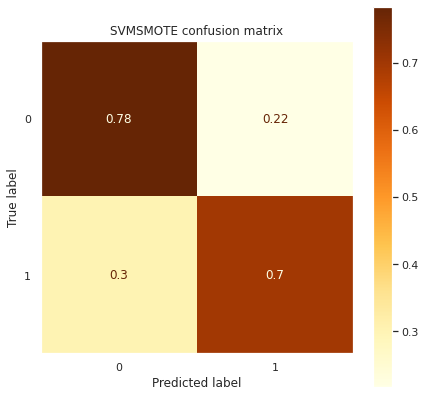

In [ ]:
titles_options = [("Imbalanced confusion matrix", log_reg_unb_w), ("ADASYN confusion matrix", log_reg_reb_w), ("ROS confusion matrix", log_reg_reb2_w),("SVMSMOTE confusion matrix", log_reg_reb3_w)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XW_test, yW_test,
                                 cmap="YlOrBr", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

### 4.5.4. ROC Curve for models trained on both the balanced and unbalanced data

Unbalanced Threshold 6: ROC AUC=0.799
SMOTE & ADASYN Balanced Threshold 6: ROC AUC=0.615
RandomOverSampler Balanced Threshold 6: ROC AUC=0.615
SVMSMOTE Balanced Threshold 6: ROC AUC=0.615


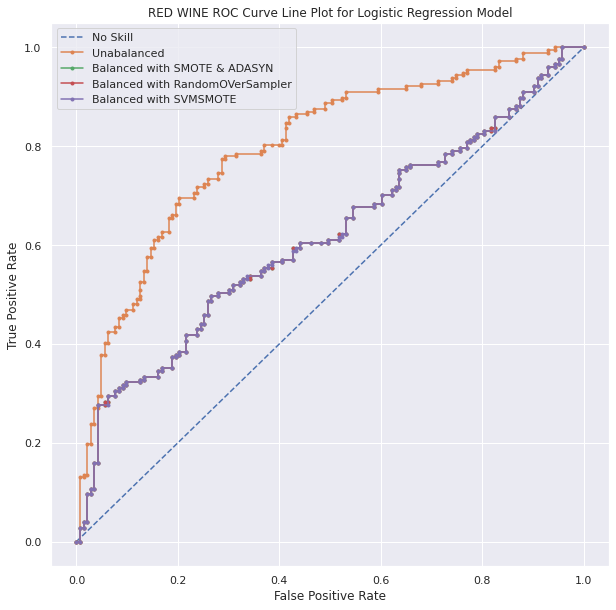

Unbalanced Threshold 6: ROC AUC=0.818
SMOTE & ADASYN Balanced Threshold 6: ROC AUC=0.816
RandomOverSampler Balanced Threshold 6: ROC AUC=0.816
SVMSMOTE Balanced Threshold 6: ROC AUC=0.818


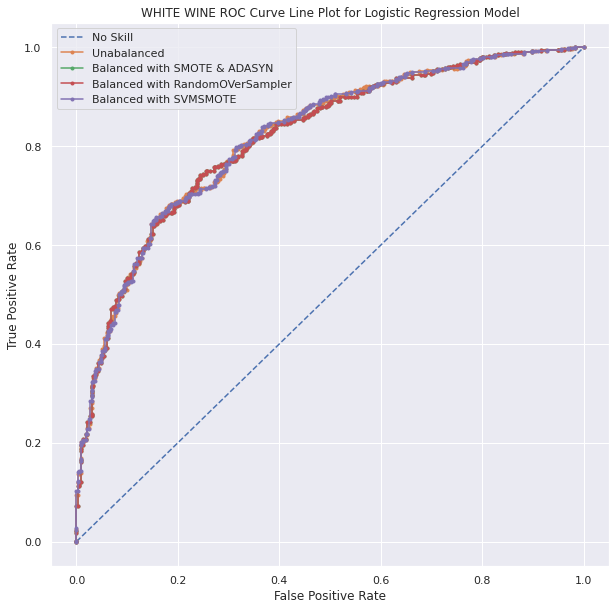

In [ ]:
## RED WINE

# predict probabilities
lr_probs_unb = log_reg_unb_r.predict_proba(XR_test)
lr_probs = log_reg_reb_r.predict_proba(XR_test)
lr_probs2 = log_reg_reb2_r.predict_proba(XR_test)
lr_probs3 = log_reg_reb3_r.predict_proba(XR_test)

# keep probabilities for the positive outcome only
lr_probs_unb = lr_probs_unb[:, 1]
lr_probs = lr_probs[:, 1]
lr_probs2 = lr_probs2[:, 1]
lr_probs3 = lr_probs3[:, 1]

# calculate scores
lr_auc_ru = roc_auc_score(yR_test, lr_probs_unb)
lr_auc_r = roc_auc_score(yR_test, lr_probs)
lr_auc_r2 = roc_auc_score(yR_test, lr_probs2)
lr_auc_r3 = roc_auc_score(yR_test, lr_probs3)

# calculate roc curves
fpr_r_u, tpr_r_u, _ = roc_curve(yR_test, lr_probs_unb)
fpr_r, tpr_r, _ = roc_curve(yR_test, lr_probs)
fpr_r2, tpr_r2, _ = roc_curve(yR_test, lr_probs2)
fpr_r3, tpr_r3, _ = roc_curve(yR_test, lr_probs3)


## WHITE WINE

# predict probabilities
lr_probs_unb = log_reg_unb_w.predict_proba(XW_test)
lr_probs = log_reg_reb_w.predict_proba(XW_test)
lr_probs2 = log_reg_reb2_w.predict_proba(XW_test)
lr_probs3 = log_reg_reb3_w.predict_proba(XW_test)

# keep probabilities for the positive outcome only
lr_probs_unb = lr_probs_unb[:, 1]
lr_probs = lr_probs[:, 1]
lr_probs2 = lr_probs2[:, 1]
lr_probs3 = lr_probs3[:, 1]

# calculate scores
lr_auc_wu = roc_auc_score(yW_test, lr_probs_unb)
lr_auc_w = roc_auc_score(yW_test, lr_probs)
lr_auc_w2 = roc_auc_score(yW_test, lr_probs2)
lr_auc_w3 = roc_auc_score(yW_test, lr_probs3)

# calculate roc curves
fpr_w_u, tpr_w_u, _ = roc_curve(yW_test, lr_probs_unb)
fpr_w, tpr_w, _ = roc_curve(yW_test, lr_probs)
fpr_w2, tpr_w2, _ = roc_curve(yW_test, lr_probs2)
fpr_w3, tpr_w3, _ = roc_curve(yW_test, lr_probs3)


print('Unbalanced Threshold 6: ROC AUC=%.3f' % (lr_auc_ru))
print('SMOTE & ADASYN Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_r))
print('RandomOverSampler Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_r2))
print('SVMSMOTE Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_r3))

# plot the roc curve for the model
plt.figure(figsize=(10,10))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_r_u, tpr_r_u, marker='.', label='Unabalanced')
plt.plot(fpr_r, tpr_r, marker='.', label='Balanced with SMOTE & ADASYN')
plt.plot(fpr_r2, tpr_r2, marker='.', label='Balanced with RandomOVerSampler')
plt.plot(fpr_r3, tpr_r3, marker='.', label='Balanced with SVMSMOTE')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("RED WINE ROC Curve Line Plot for Logistic Regression Model")
plt.show()

print('Unbalanced Threshold 6: ROC AUC=%.3f' % (lr_auc_wu))
print('SMOTE & ADASYN Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_w))
print('RandomOverSampler Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_w2))
print('SVMSMOTE Balanced Threshold 6: ROC AUC=%.3f' % (lr_auc_w3))

# plot the roc curve for the model
plt.figure(figsize=(10,10))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_w_u, tpr_w_u, marker='.', label='Unabalanced')
plt.plot(fpr_w, tpr_w, marker='.', label='Balanced with SMOTE & ADASYN')
plt.plot(fpr_w2, tpr_w2, marker='.', label='Balanced with RandomOVerSampler')
plt.plot(fpr_w3, tpr_w3, marker='.', label='Balanced with SVMSMOTE')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("WHITE WINE ROC Curve Line Plot for Logistic Regression Model")
plt.show()

### 4.5.5. SUMMARY

1. RED WINE

Based on the above analysis, the best balancing techniques turn out to be SMOTE and ROS. This is a little surprising to me as the literature suggest that the latter is actually the worst oversampling mechanism, especially when evaluated with cross validation, which I did. They  provides the best average testing accuracy, recall, precision and f1-score. ROC AUC scores don't vary accross techniques. 

Yet, in comparison with **imbalanced** data, the classification matrices suggest they perform much worse, prediciting the positive class much better than the negative. They have higher mean testing precision, but lower mean recall (with larger difference than in case of precision), which is more important for us in this work. Their ROC AUC score and curve also look worse than in the imbalanced data.

  **Therefore, summing up, although the differences are really small it seems like the logistic regression for red wine performs better on the imbalanced data than on the best, SMOTE or ROS balanced data.**

2. WHITE WINE

  Best balancing algorithms are ROS and SVMSMOTE. They have in essense the same results in the classification report but, by small margins, ROS wins in mean test scores. Both techniques have worse mean accuracy, recall and f1score than the imbalancced model but this one is severely imbalanced and all the performance comes from the 'high' quality class, whilst the 'low' one performs really poorly. In terms of ROC AUC scores, all techniques have nearly the same scores.

  **All in all, SVMSMOTE and ROS balanced models perform the best and overperform the imbalanced model, which could be expected as the white wine data was much more imbalanced than red wine.**

## 4.6. SVM - Support Vector Machine

### Linear Support Vector Classifier

#### Red wine
* Based on the results from logistic regression suggesting that imbalanced and SMOTE and ROS balanced models perform best, I will try all and compare for this algorithm as well

1st place

In [ ]:
lsvc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, None, LinearSVC(C=1, max_iter=10000))

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.743 (± 0.050)
Mean Recall score: 0.731 (± 0.062)
Mean Precision score: 0.773 (± 0.064)
Mean f1-score: 0.751 (± 0.048)

Test set metrics for RED WINE:

Mean Accuracy: 0.744
Mean Recall score: 0.734
Mean Precision score: 0.788
Mean f1-score: 0.760

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.71      0.76      0.74       601
           1       0.77      0.73      0.75       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.74      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.70      0.76      0.72       143
           1       0.79      0.73      0.76       177

    accuracy                           0.74       320
   macro avg       0.74      0.74  

2nd place

In [ ]:
lsvc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, RandomOverSampler(random_state=42), LinearSVC(C=1, max_iter=10000))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Accuracy: 0.741 (± 0.044)
Mean Recall score: 0.698 (± 0.056)
Mean Precision score: 0.790 (± 0.070)
Mean f1-score: 0.740 (± 0.042)

Test set metrics for RED WINE:

Mean Accuracy: 0.731
Mean Recall score: 0.689
Mean Precision score: 0.797
Mean f1-score: 0.739

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       601
           1       0.79      0.70      0.74       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.75      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.67      0.78      0.72       143
           1       0.

3rd place

In [ ]:
lsvc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, SMOTE(random_state=42), LinearSVC(C=1, max_iter=10000))

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.742 (± 0.043)
Mean Recall score: 0.701 (± 0.043)
Mean Precision score: 0.791 (± 0.077)
Mean f1-score: 0.743 (± 0.036)

Test set metrics for RED WINE:

Mean Accuracy: 0.728
Mean Recall score: 0.684
Mean Precision score: 0.796
Mean f1-score: 0.736

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       601
           1       0.79      0.70      0.74       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.75      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

#### White wine
* trying the two best techniques found by analysing logitic regression: SVMSMOTE and ROS

1st place 
* mean scores and accuracy look better and the recall in classification report is more balanced

In [ ]:
lsvc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, RandomOverSampler(random_state=42), LinearSVC(C=1, max_iter=10000))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for WHITE WINE:

Mean Accuracy: 0.699 (± 0.036)
Mean Recall score: 0.673 (± 0.057)
Mean Precision score: 0.847 (± 0.040)
Mean f1-score: 0.750 (± 0.037)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.731
Mean Recall score: 0.699
Mean Precision score: 0.867
Mean f1-score: 0.774

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.53      0.75      0.62      1289
           1       0.85      0.67      0.75      2607

    accuracy                           0.70      3896
   macro avg       0.69      0.71      0.69      3896
weighted avg       0.74      0.70      0.71      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.58      0.79      0.67       333
           1 

2nd place

In [ ]:
lsvc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, SVMSMOTE(random_state=42), LinearSVC(C=1, max_iter=10000))

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.701 (± 0.033)
Mean Recall score: 0.678 (± 0.048)
Mean Precision score: 0.845 (± 0.047)
Mean f1-score: 0.752 (± 0.030)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.730
Mean Recall score: 0.702
Mean Precision score: 0.862
Mean f1-score: 0.774

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.53      0.75      0.62      1289
           1       0.84      0.68      0.75      2607

    accuracy                           0.70      3896
   macro avg       0.69      0.71      0.69      3896
weighted avg       0.74      0.70      0.71      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.58      0.78      0.66 

### Non-linear SVC

#### Red wine

1st place 
* also 1st place overall for Support Vector classifiers
* will be compared with Random Forest and KNN (already outperforms logistic regression for the same data)

In [ ]:
svc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, None, SVC())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.749 (± 0.057)
Mean Recall score: 0.725 (± 0.056)
Mean Precision score: 0.786 (± 0.072)
Mean f1-score: 0.754 (± 0.052)

Test set metrics for RED WINE:

Mean Accuracy: 0.759
Mean Recall score: 0.751
Mean Precision score: 0.801
Mean f1-score: 0.776

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.72      0.78      0.74       601
           1       0.79      0.72      0.75       676

    accuracy                           0.75      1277
   macro avg       0.75      0.75      0.75      1277
weighted avg       0.75      0.75      0.75      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.71      0.77      0.74       143
           1       0.80      0.75      0.78       177

    accuracy                           0.76       320
   macro avg       0.76      0.76  

2nd place

In [ ]:
svc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, RandomOverSampler(random_state=42), SVC())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Accuracy: 0.740 (± 0.044)
Mean Recall score: 0.679 (± 0.068)
Mean Precision score: 0.803 (± 0.082)
Mean f1-score: 0.734 (± 0.042)

Test set metrics for RED WINE:

Mean Accuracy: 0.747
Mean Recall score: 0.695
Mean Precision score: 0.820
Mean f1-score: 0.752

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.69      0.81      0.75       601
           1       0.80      0.68      0.73       676

    accuracy                           0.74      1277
   macro avg       0.75      0.74      0.74      1277
weighted avg       0.75      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.68      0.81      0.74       143
           1       0.

3rd place

In [ ]:
svc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, SMOTE(random_state=42), SVC())

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.742 (± 0.048)
Mean Recall score: 0.679 (± 0.060)
Mean Precision score: 0.806 (± 0.089)
Mean f1-score: 0.736 (± 0.042)

Test set metrics for RED WINE:

Mean Accuracy: 0.747
Mean Recall score: 0.701
Mean Precision score: 0.816
Mean f1-score: 0.754

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.69      0.81      0.75       601
           1       0.80      0.68      0.74       676

    accuracy                           0.74      1277
   macro avg       0.75      0.75      0.74      1277
weighted avg       0.75      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

#### White wine

1st place 
* better accuracy, f1 scores and the recall in classification report on test set
* also, 1st place overall for SVM classifier for white wine

In [ ]:
svc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, RandomOverSampler(random_state=42), SVC())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for WHITE WINE:

Mean Accuracy: 0.716 (± 0.032)
Mean Recall score: 0.687 (± 0.028)
Mean Precision score: 0.860 (± 0.038)
Mean f1-score: 0.764 (± 0.027)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.751
Mean Recall score: 0.731
Mean Precision score: 0.870
Mean f1-score: 0.794

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      1289
           1       0.86      0.69      0.76      2607

    accuracy                           0.72      3896
   macro avg       0.70      0.73      0.70      3896
weighted avg       0.76      0.72      0.72      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.60      0.79      0.68       333
           1 

2nd place

In [ ]:
svc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, SVMSMOTE(random_state=42), SVC())

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.718 (± 0.039)
Mean Recall score: 0.693 (± 0.038)
Mean Precision score: 0.858 (± 0.035)
Mean f1-score: 0.767 (± 0.034)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.745
Mean Recall score: 0.718
Mean Precision score: 0.871
Mean f1-score: 0.787

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      1289
           1       0.86      0.69      0.77      2607

    accuracy                           0.72      3896
   macro avg       0.71      0.73      0.71      3896
weighted avg       0.76      0.72      0.73      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.59      0.80      0.68 

## 4.7. Random Forests

* no standardisation or normalisation because random forests do not care for them

### Red wine

* trying all 3 best techniques: imbalanced, SMOTE and ROS to find the best one for Random Forest Classifier

1st place

In [ ]:
rf_r1 = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, SMOTE(random_state=42), RandomForestClassifier(n_estimators=100, random_state=13))

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.800 (± 0.047)
Mean Recall score: 0.784 (± 0.081)
Mean Precision score: 0.829 (± 0.051)
Mean f1-score: 0.805 (± 0.050)

Test set metrics for RED WINE:

Mean Accuracy: 0.844
Mean Recall score: 0.842
Mean Precision score: 0.871
Mean f1-score: 0.856

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.82      0.79       601
           1       0.83      0.78      0.81       676

    accuracy                           0.80      1277
   macro avg       0.80      0.80      0.80      1277
weighted avg       0.80      0.80      0.80      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

2nd place

In [ ]:
rf_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, RandomOverSampler(random_state=42), RandomForestClassifier(n_estimators=100, random_state=13))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Accuracy: 0.796 (± 0.055)
Mean Recall score: 0.783 (± 0.093)
Mean Precision score: 0.823 (± 0.043)
Mean f1-score: 0.802 (± 0.059)

Test set metrics for RED WINE:

Mean Accuracy: 0.841
Mean Recall score: 0.847
Mean Precision score: 0.862
Mean f1-score: 0.855

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.81      0.79       601
           1       0.82      0.78      0.80       676

    accuracy                           0.80      1277
   macro avg       0.80      0.80      0.80      1277
weighted avg       0.80      0.80      0.80      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.82      0.83      0.82       143
           1       0.

3rd place

In [ ]:
rf_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, None, RandomForestClassifier(n_estimators=100, random_state=13))

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.804 (± 0.057)
Mean Recall score: 0.802 (± 0.083)
Mean Precision score: 0.824 (± 0.051)
Mean f1-score: 0.812 (± 0.059)

Test set metrics for RED WINE:

Mean Accuracy: 0.828
Mean Recall score: 0.847
Mean Precision score: 0.843
Mean f1-score: 0.845

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.78      0.81      0.80       601
           1       0.82      0.80      0.81       676

    accuracy                           0.80      1277
   macro avg       0.80      0.80      0.80      1277
weighted avg       0.80      0.80      0.80      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.81      0.80      0.81       143
           1       0.84      0.85      0.85       177

    accuracy                           0.83       320
   macro avg       0.83      0.83  

### White wine

* trying the 2 best techniques for white wine: SVMSMOTE and ROS to find the best one for Random Forest Classifier

1st place 
* better accuracy and more balanced recall in the test set classification report, as well as better f1-scores

In [ ]:
rf_w1 = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", False, SVMSMOTE(random_state=42), RandomForestClassifier(n_estimators=100, random_state=13))

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.804 (± 0.023)
Mean Recall score: 0.844 (± 0.037)
Mean Precision score: 0.861 (± 0.010)
Mean f1-score: 0.852 (± 0.020)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.821
Mean Recall score: 0.855
Mean Precision score: 0.870
Mean f1-score: 0.863

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      1289
           1       0.86      0.84      0.85      2607

    accuracy                           0.80      3896
   macro avg       0.78      0.78      0.78      3896
weighted avg       0.81      0.80      0.81      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.73      0.75      0.74 

2nd place

In [ ]:
rf_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", False, RandomOverSampler(random_state=42), RandomForestClassifier(n_estimators=100, random_state=13))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for WHITE WINE:

Mean Accuracy: 0.807 (± 0.019)
Mean Recall score: 0.862 (± 0.033)
Mean Precision score: 0.852 (± 0.010)
Mean f1-score: 0.857 (± 0.016)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.814
Mean Recall score: 0.864
Mean Precision score: 0.855
Mean f1-score: 0.860

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.71      0.70      0.70      1289
           1       0.85      0.86      0.86      2607

    accuracy                           0.81      3896
   macro avg       0.78      0.78      0.78      3896
weighted avg       0.81      0.81      0.81      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.73      0.72      0.73       333
           1 

## 4.8. K-Nearest Neighbor Classifier

### Red wine

1st place 
* more balanced recall in classification report

In [ ]:
knn_r1 = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, SMOTE(random_state=42), KNeighborsClassifier(n_neighbors=3, weights='distance'))

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.784 (± 0.017)
Mean Recall score: 0.799 (± 0.039)
Mean Precision score: 0.794 (± 0.019)
Mean f1-score: 0.796 (± 0.019)

Test set metrics for RED WINE:

Mean Accuracy: 0.803
Mean Recall score: 0.831
Mean Precision score: 0.817
Mean f1-score: 0.824

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.77      0.77       601
           1       0.79      0.80      0.80       676

    accuracy                           0.78      1277
   macro avg       0.78      0.78      0.78      1277
weighted avg       0.78      0.78      0.78      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

2nd place

In [ ]:
knn_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, RandomOverSampler(random_state=42), KNeighborsClassifier(n_neighbors=3, weights='distance'))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Accuracy: 0.780 (± 0.016)
Mean Recall score: 0.793 (± 0.029)
Mean Precision score: 0.792 (± 0.029)
Mean f1-score: 0.792 (± 0.013)

Test set metrics for RED WINE:

Mean Accuracy: 0.794
Mean Recall score: 0.819
Mean Precision score: 0.810
Mean f1-score: 0.815

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.77      0.77       601
           1       0.79      0.79      0.79       676

    accuracy                           0.78      1277
   macro avg       0.78      0.78      0.78      1277
weighted avg       0.78      0.78      0.78      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.77      0.76      0.77       143
           1       0.

3rd place

In [ ]:
knn_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", True, None, KNeighborsClassifier(n_neighbors=3, weights='distance'))

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.779 (± 0.018)
Mean Recall score: 0.805 (± 0.040)
Mean Precision score: 0.784 (± 0.029)
Mean f1-score: 0.794 (± 0.018)

Test set metrics for RED WINE:

Mean Accuracy: 0.791
Mean Recall score: 0.831
Mean Precision score: 0.799
Mean f1-score: 0.814

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.75      0.76       601
           1       0.78      0.80      0.79       676

    accuracy                           0.78      1277
   macro avg       0.78      0.78      0.78      1277
weighted avg       0.78      0.78      0.78      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.78      0.74      0.76       143
           1       0.80      0.83      0.81       177

    accuracy                           0.79       320
   macro avg       0.79      0.79  

### White wine

1st place 
* much better accuracy and other mean scores
* better metrics in classification report as well


In [ ]:
knn_w1 = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, SVMSMOTE(random_state=42), KNeighborsClassifier(n_neighbors=5))

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.727 (± 0.035)
Mean Recall score: 0.750 (± 0.043)
Mean Precision score: 0.827 (± 0.029)
Mean f1-score: 0.786 (± 0.030)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.752
Mean Recall score: 0.774
Mean Precision score: 0.837
Mean f1-score: 0.804

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.57      0.68      0.62      1289
           1       0.83      0.75      0.79      2607

    accuracy                           0.73      3896
   macro avg       0.70      0.72      0.70      3896
weighted avg       0.74      0.73      0.73      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.62      0.71      0.66 

2nd place

In [ ]:
knn_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", True, RandomOverSampler(random_state=42), KNeighborsClassifier(n_neighbors=5))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for WHITE WINE:

Mean Accuracy: 0.718 (± 0.028)
Mean Recall score: 0.729 (± 0.020)
Mean Precision score: 0.829 (± 0.030)
Mean f1-score: 0.776 (± 0.021)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.743
Mean Recall score: 0.748
Mean Precision score: 0.844
Mean f1-score: 0.793

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.56      0.70      0.62      1289
           1       0.83      0.73      0.78      2607

    accuracy                           0.72      3896
   macro avg       0.69      0.71      0.70      3896
weighted avg       0.74      0.72      0.72      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.60      0.73      0.66       333
           1 

## 4.9. Decision Trees Classifier

### Red wine

1st place

In [ ]:
dtc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, SMOTE(random_state=42), DecisionTreeClassifier())

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.743 (± 0.032)
Mean Recall score: 0.747 (± 0.088)
Mean Precision score: 0.760 (± 0.035)
Mean f1-score: 0.747 (± 0.032)

Test set metrics for RED WINE:

Mean Accuracy: 0.753
Mean Recall score: 0.780
Mean Precision score: 0.775
Mean f1-score: 0.777

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.71      0.73      0.72       601
           1       0.76      0.73      0.74       676

    accuracy                           0.73      1277
   macro avg       0.73      0.73      0.73      1277
weighted avg       0.73      0.73      0.73      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

2nd place

In [ ]:
dtc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, None, DecisionTreeClassifier())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Accuracy: 0.732 (± 0.051)
Mean Recall score: 0.747 (± 0.054)
Mean Precision score: 0.745 (± 0.038)
Mean f1-score: 0.739 (± 0.054)

Test set metrics for RED WINE:

Mean Accuracy: 0.734
Mean Recall score: 0.746
Mean Precision score: 0.767
Mean f1-score: 0.756

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.72      0.72      0.72       601
           1       0.75      0.76      0.75       676

    accuracy                           0.74      1277
   macro avg       0.74      0.74      0.74      1277
weighted avg       0.74      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.70      0.72      0.71       143
           1       0.77      0.75      0.76       177

    accuracy                           0.73       320
   macro avg       0.73      0.73  

3rd place

In [ ]:
dtc_r = imb_kfold_train_eval(XR_train, yR_train, XR_test, yR_test, "RED WINE", False, RandomOverSampler(random_state=42), DecisionTreeClassifier())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Accuracy: 0.732 (± 0.029)
Mean Recall score: 0.754 (± 0.056)
Mean Precision score: 0.741 (± 0.053)
Mean f1-score: 0.755 (± 0.034)

Test set metrics for RED WINE:

Mean Accuracy: 0.719
Mean Recall score: 0.723
Mean Precision score: 0.757
Mean f1-score: 0.740

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.72      0.71      0.72       601
           1       0.74      0.76      0.75       676

    accuracy                           0.74      1277
   macro avg       0.73      0.73      0.73      1277
weighted avg       0.74      0.74      0.74      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.68      0.71      0.69       143
           1       0.

### White wine

1st

In [ ]:
dtc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", False, RandomOverSampler(random_state=42), DecisionTreeClassifier())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for WHITE WINE:

Mean Accuracy: 0.768 (± 0.012)
Mean Recall score: 0.834 (± 0.033)
Mean Precision score: 0.820 (± 0.019)
Mean f1-score: 0.825 (± 0.016)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.779
Mean Recall score: 0.836
Mean Precision score: 0.830
Mean f1-score: 0.833

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.65      0.64      0.65      1289
           1       0.83      0.83      0.83      2607

    accuracy                           0.77      3896
   macro avg       0.74      0.74      0.74      3896
weighted avg       0.77      0.77      0.77      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.68      0.67      0.67       333
           1 

2nd

In [ ]:
dtc_w = imb_kfold_train_eval(XW_train, yW_train, XW_test, yW_test, "WHITE WINE", False, SVMSMOTE(random_state=42), DecisionTreeClassifier())

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.757 (± 0.035)
Mean Recall score: 0.799 (± 0.035)
Mean Precision score: 0.835 (± 0.022)
Mean f1-score: 0.815 (± 0.031)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.776
Mean Recall score: 0.818
Mean Precision score: 0.839
Mean f1-score: 0.828

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.62      0.68      0.65      1289
           1       0.84      0.80      0.81      2607

    accuracy                           0.76      3896
   macro avg       0.73      0.74      0.73      3896
weighted avg       0.77      0.76      0.76      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.66      0.70      0.68 

## 4.10. Comparing confusion matrices for the two best models:
* Random Forest
* K-Nearest Neighbor

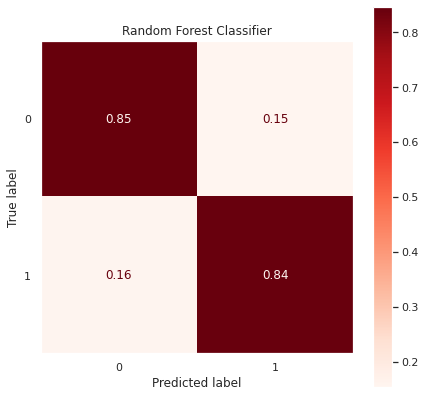

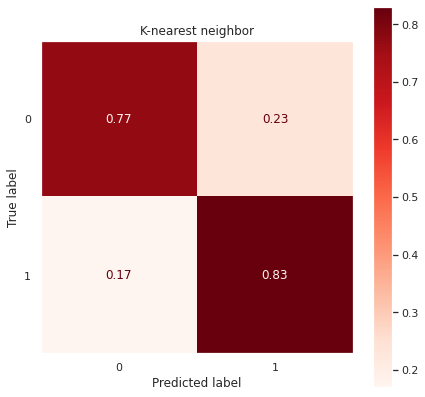

In [ ]:
titles_options = [("Random Forest Classifier", rf_r1), ("K-nearest neighbor", knn_r1)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XR_test, yR_test,
                                 cmap="Reds", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

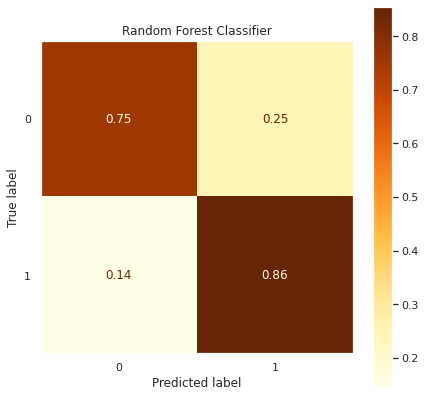

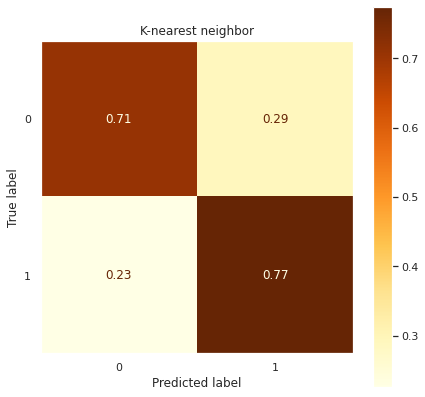

In [ ]:
titles_options = [("Random Forest Classifier", rf_w1), ("K-nearest neighbor", knn_w1)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XW_test, yW_test,
                                 cmap="YlOrBr", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

## 4.11. Comparing ROC curves and AUC scores for the two best models:
* Random Forest
* K-Nearest Neighbor

K nearest neighbor: ROC AUC=0.860
Random Forest: ROC AUC=0.887


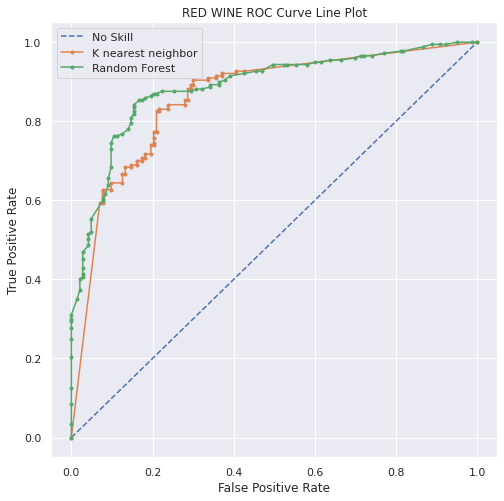

K nearest neighbor: ROC AUC=0.806
Random Forest: ROC AUC=0.885


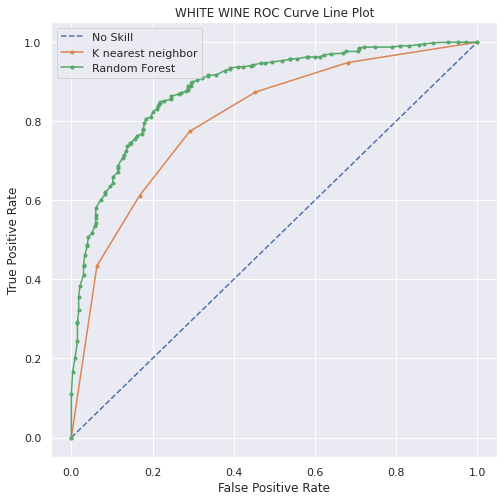

In [ ]:
## RED WINE

# predict probabilities
# k nearest
knn_probs = knn_r1.predict_proba(XR_test)
# random forests
rf_probs = rf_r1.predict_proba(XR_test)

# keep probabilities for the positive outcome only
knn_probs_r = knn_probs[:, 1]
rf_probs_r = rf_probs[:, 1]

# calculate scores
knn_auc_r = roc_auc_score(yR_test, knn_probs_r)
rf_auc_r = roc_auc_score(yR_test, rf_probs_r)

# calculate roc curves
fpr_r, tpr_r, _ = roc_curve(yR_test, knn_probs_r)
fpr_r2, tpr_r2, _ = roc_curve(yR_test, rf_probs_r)


## WHITE WINE

# predict probabilities
# k nearest
knn_probs = knn_w1.predict_proba(XW_test)
# random forests
rf_probs = rf_w1.predict_proba(XW_test)

# keep probabilities for the positive outcome only
knn_probs_w = knn_probs[:, 1]
rf_probs_w = rf_probs[:, 1]

# calculate scores
knn_auc_w = roc_auc_score(yW_test, knn_probs_w)
rf_auc_w = roc_auc_score(yW_test, rf_probs_w)

# calculate roc curves
fpr_w, tpr_w, _ = roc_curve(yW_test, knn_probs_w)
fpr_w2, tpr_w2, _ = roc_curve(yW_test, rf_probs_w)

############################
print('K nearest neighbor: ROC AUC=%.3f' % (knn_auc_r))
print('Random Forest: ROC AUC=%.3f' % (rf_auc_r))

# plot the roc curve for the model
plt.figure(figsize=(8,8))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_r, tpr_r, marker='.', label='K nearest neighbor')
plt.plot(fpr_r2, tpr_r2, marker='.', label='Random Forest')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("RED WINE ROC Curve Line Plot")
plt.show()

print('K nearest neighbor: ROC AUC=%.3f' % (knn_auc_w))
print('Random Forest: ROC AUC=%.3f' % (rf_auc_w))

###########################################################

# plot the roc curve for the model
plt.figure(figsize=(8,8))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_w, tpr_w, marker='.', label='K nearest neighbor')
plt.plot(fpr_w2, tpr_w2, marker='.', label='Random Forest')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("WHITE WINE ROC Curve Line Plot")
plt.show()

## 4.12. Summary
* For both the red and the white wine I found out that by far the best algorithm is the Random Forest Classifier. 
* The 2nd best was K-Nearest Neighbor, but the ROC and confusion matrices confirm its inferiority.

## 4.13. Hyper-parameter tuning for Random Forest Classifiers with GridSearchCV
### Parameters tuned:
* max_features
* n_estimators
* max_depth

#### Prepare the train and test sets
* gridsearch set: test for automatic training and testing inside GridSearchCV
* validation set: test sets which are held completely unseen throughout the GridSearch and are used to test the tuned model at the end

In [ ]:
# RED WINE
XR_gridsearch, XR_validation, yR_gridsearch, yR_validation = train_test_split(XR_unb_sf, yR_unb_sf, test_size=0.2, random_state=15)

# WHITE WINE
XW_gridsearch, XW_validation, yW_gridsearch, yW_validation = train_test_split(XW_unb_sf, yW_unb_sf, test_size=0.2, random_state=15)

In [ ]:
print(XR_gridsearch.shape, XR_validation.shape, yR_gridsearch.shape, yR_validation.shape)
print(XW_gridsearch.shape, XW_validation.shape, yW_gridsearch.shape, yW_validation.shape)

(1277, 6) (320, 6) (1277,) (320,)
(3896, 6) (975, 6) (3896,) (975,)


### Red wine

#### Baseline model with default parameters

In [ ]:
rfc_r_base = imb_kfold_train_eval(XR_gridsearch, yR_gridsearch, XR_validation, yR_validation, "RED WINE", False, SMOTE(random_state=42), RandomForestClassifier(random_state=13))

# Log loss on testing
pred_prob_test = rfc_r_base.predict_proba(XR_validation)
print(f"Log Loss: {log_loss(yR_validation, pred_prob_test):.3f}")

Results for rebalancing the data with SMOTE(k_neighbors=5, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Accuracy: 0.800 (± 0.047)
Mean Recall score: 0.784 (± 0.081)
Mean Precision score: 0.829 (± 0.051)
Mean f1-score: 0.805 (± 0.050)

Test set metrics for RED WINE:

Mean Accuracy: 0.844
Mean Recall score: 0.842
Mean Precision score: 0.871
Mean f1-score: 0.856

RED WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.77      0.82      0.79       601
           1       0.83      0.78      0.81       676

    accuracy                           0.80      1277
   macro avg       0.80      0.80      0.80      1277
weighted avg       0.80      0.80      0.80      1277


RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   sup

#### Tuning `max_features` and `n_estimators`

In [ ]:
# make pipeline with the sMOTE - best oversampling strategy for random forests
pipe = make_pipeline_imb(SMOTE(random_state=42), RandomForestClassifier())
# cross validation method
skf = StratifiedKFold(n_splits=10, random_state=42)
# parameters
params = {
    'randomforestclassifier__random_state': [13],
    'randomforestclassifier__max_features': ['sqrt', 'log2'],
    'randomforestclassifier__n_estimators': [10, 100, 500, 1000],
}

# scoring
scoring = ['accuracy', 'recall', 'precision', 'f1']
# grid search
grid = GridSearchCV(pipe, param_grid=params, cv=skf, scoring=scoring, refit='f1')

grid.fit(XR_gridsearch, yR_gridsearch)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('smote',
                                        SMOTE(k_neighbors=5, kind='deprecated',
                                              m_neighbors='deprecated',
                                              n_jobs=1, out_step='deprecated',
                                              random_state=42, ratio=None,
                                              sampling_strategy='auto',
                                              svm_estimator='deprecated')),
                                       ('randomforestclassifier',
                                        RandomFores...
                                                               warm_start=False))],
                                verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'randomforestclassifie

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for RED WINE: \n")
print(f"Mean recall {grid.cv_results_['mean_test_recall'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_recall'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_accuracy'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_accuracy'][grid.best_index_] * 2:.3f})")
print(f"Mean precision {grid.cv_results_['mean_test_precision'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_precision'][grid.best_index_] * 2:.3f})")

# test set
test_preds = grid.predict(XR_validation)
print(f"\nTest (validation) set metrics for RED WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yR_validation, test_preds):.3f}")
print(f"Mean Recall score: {recall_score(yR_validation, test_preds):.3f}")
print(f"Mean Precision score: {precision_score(yR_validation, test_preds):.3f}")
print(f"Mean f1-score: {f1_score(yR_validation, test_preds):.3f}")

# Log loss on testing
pred_prob_test = grid.predict_proba(XR_validation)
print(f"Log Loss: {log_loss(yR_validation, pred_prob_test):.3f}")

# test set report
print(f"\nRED WINE Predictions Report on TEST set: \n")
print(classification_report(yR_validation, test_preds))

{'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__n_estimators': 1000, 'randomforestclassifier__random_state': 13}

Gridsearch cross validation metrics for RED WINE: 

Mean recall 0.802 (± 0.090)
Mean accuracy 0.800 (± 0.052)
Mean precision 0.820 (± 0.072)

Test (validation) set metrics for RED WINE:

Mean Accuracy: 0.847
Mean Recall score: 0.853
Mean Precision score: 0.868
Mean f1-score: 0.860
Log Loss: 0.424

RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.82      0.84      0.83       143
           1       0.87      0.85      0.86       177

    accuracy                           0.85       320
   macro avg       0.84      0.85      0.85       320
weighted avg       0.85      0.85      0.85       320



#### Tuning `max_depth`

In [ ]:
pipe = make_pipeline_imb(SMOTE(random_state=42), RandomForestClassifier())
# cross validation method
skf = StratifiedKFold(n_splits=10, random_state=42)
# parameters
params = {
    'randomforestclassifier__max_depth': np.arange(10, 110, 10),
    'randomforestclassifier__random_state': [13],
    'randomforestclassifier__max_features': ['sqrt'],
    'randomforestclassifier__n_estimators': [1000],
}

# scoring
scoring = ['accuracy', 'recall', 'precision', 'f1']
# grid search
grid = GridSearchCV(pipe, param_grid=params, cv=skf, scoring=scoring, refit='f1')

grid.fit(XR_gridsearch, yR_gridsearch)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('smote',
                                        SMOTE(k_neighbors=5, kind='deprecated',
                                              m_neighbors='deprecated',
                                              n_jobs=1, out_step='deprecated',
                                              random_state=42, ratio=None,
                                              sampling_strategy='auto',
                                              svm_estimator='deprecated')),
                                       ('randomforestclassifier',
                                        RandomFores...
             iid='deprecated', n_jobs=None,
             param_grid={'randomforestclassifier__max_depth': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100]),
                         'randomforestclassifier__max_feat

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for RED WINE: \n")
print(f"Mean recall {grid.cv_results_['mean_test_recall'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_recall'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_accuracy'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_accuracy'][grid.best_index_] * 2:.3f})")
print(f"Mean precision {grid.cv_results_['mean_test_precision'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_precision'][grid.best_index_] * 2:.3f})")

# test set
test_preds = grid.predict(XR_validation)
print(f"\nTest (validation) set metrics for RED WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yR_validation, test_preds):.3f}")
print(f"Mean Recall score: {recall_score(yR_validation, test_preds):.3f}")
print(f"Mean Precision score: {precision_score(yR_validation, test_preds):.3f}")
print(f"Mean f1-score: {f1_score(yR_validation, test_preds):.3f}")

# Log loss on testing
pred_prob_test = grid.predict_proba(XR_validation)
print(f"Log Loss: {log_loss(yR_validation, pred_prob_test):.3f}")

# test set report
print(f"\nRED WINE Predictions Report on TEST set: \n")
print(classification_report(yR_validation, test_preds))

rfc_tuned_r = grid

{'randomforestclassifier__max_depth': 20, 'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__n_estimators': 1000, 'randomforestclassifier__random_state': 13}

Gridsearch cross validation metrics for RED WINE: 

Mean recall 0.803 (± 0.090)
Mean accuracy 0.800 (± 0.052)
Mean precision 0.819 (± 0.074)

Test (validation) set metrics for RED WINE:

Mean Accuracy: 0.844
Mean Recall score: 0.853
Mean Precision score: 0.863
Mean f1-score: 0.858
Log Loss: 0.425

RED WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.82      0.83      0.83       143
           1       0.86      0.85      0.86       177

    accuracy                           0.84       320
   macro avg       0.84      0.84      0.84       320
weighted avg       0.84      0.84      0.84       320



#### Confusion matrices and ROC curves for comparison

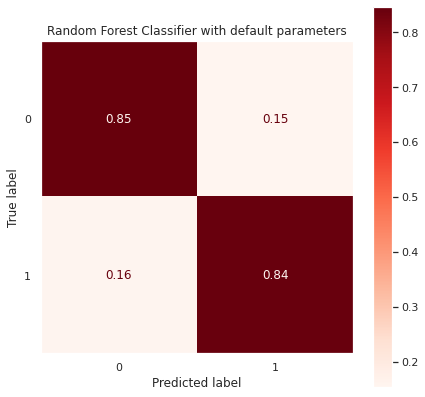

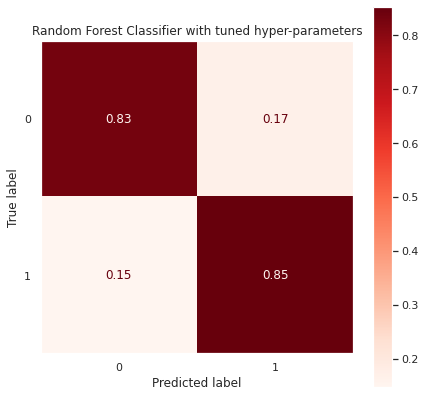

In [ ]:
titles_options = [("Random Forest Classifier with default parameters", rfc_r_base), ("Random Forest Classifier with tuned hyper-parameters",  rfc_tuned_r)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XR_validation, yR_validation,
                                 cmap="Reds", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

Based RFC: ROC AUC=0.887
Tuned RFC: ROC AUC=0.890


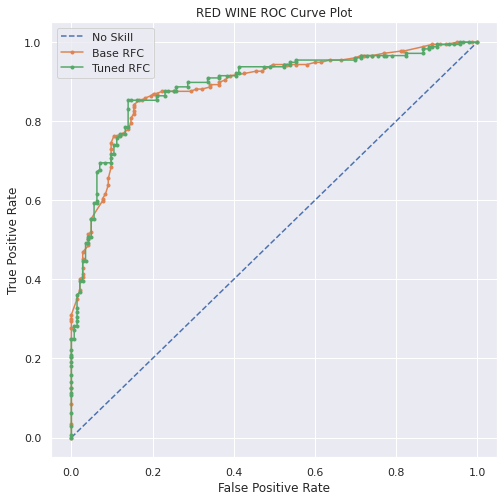

In [ ]:
## RED WINE

# predict probabilities
# basic
base_probs = rfc_r_base.predict_proba(XR_validation)
# tuned
tuned_probs = rfc_tuned_r.predict_proba(XR_validation)

# keep probabilities for the positive outcome only
base_probs = base_probs[:, 1]
tuned_probs = tuned_probs[:, 1]

# calculate scores
base_auc_r = roc_auc_score(yR_validation, base_probs)
tuned_auc_r = roc_auc_score(yR_validation, tuned_probs)

# calculate roc curves
fpr_r, tpr_r, _ = roc_curve(yR_validation, base_probs)
fpr_r2, tpr_r2, _ = roc_curve(yR_validation, tuned_probs)

print('Based RFC: ROC AUC=%.3f' % (base_auc_r))
print('Tuned RFC: ROC AUC=%.3f' % (tuned_auc_r))

# plot the roc curve for the model
plt.figure(figsize=(8,8))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_r, tpr_r, marker='.', label='Base RFC')
plt.plot(fpr_r2, tpr_r2, marker='.', label='Tuned RFC')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("RED WINE ROC Curve Plot")
plt.show()

### White wine

#### Baseline model with default parameters

In [ ]:
rfc_w_base = imb_kfold_train_eval(XW_gridsearch, yW_gridsearch, XW_validation, yW_validation, "WHITE WINE", False, SVMSMOTE(random_state=42), RandomForestClassifier(n_estimators=100, random_state=13))

# Log loss on testing
pred_prob_test = rfc_w_base.predict_proba(XW_validation)
print(f"Log Loss: {log_loss(yW_validation, pred_prob_test):.3f}")

Results for rebalancing the data with SVMSMOTE(k_neighbors=5, m_neighbors=10, n_jobs=1, out_step=0.5, random_state=42,
         sampling_strategy='auto', svm_estimator=None)

Training set metrics for WHITE WINE:

Mean Accuracy: 0.804 (± 0.023)
Mean Recall score: 0.844 (± 0.037)
Mean Precision score: 0.861 (± 0.010)
Mean f1-score: 0.852 (± 0.020)

Test set metrics for WHITE WINE:

Mean Accuracy: 0.821
Mean Recall score: 0.855
Mean Precision score: 0.870
Mean f1-score: 0.863

WHITE WINE Predictions Report on TRAINING set: 

              precision    recall  f1-score   support

           0       0.70      0.72      0.71      1289
           1       0.86      0.84      0.85      2607

    accuracy                           0.80      3896
   macro avg       0.78      0.78      0.78      3896
weighted avg       0.81      0.80      0.81      3896


WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.73      0.75      0.74 

#### Tuning `max_features` and `n_estimators`

In [ ]:
# make pipeline with SVMSMOTE - the best oversampling strategy for Random Forest
pipe = make_pipeline_imb(SVMSMOTE(random_state=42), RandomForestClassifier())
# cross validation method
skf = StratifiedKFold(n_splits=10, shuffle=False, random_state=42)
# parameters
params = {
    'randomforestclassifier__n_estimators': [10, 100, 500, 1000],
    'randomforestclassifier__random_state': [13],
    'randomforestclassifier__max_features': ['sqrt', 'log2'],
}


# scoring
scoring = ['accuracy', 'recall', 'precision', 'f1']
# grid search
grid = GridSearchCV(pipe, param_grid=params, cv=skf, scoring=scoring, refit='f1')

grid.fit(XW_gridsearch, yW_gridsearch)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('svmsmote',
                                        SVMSMOTE(k_neighbors=5, m_neighbors=10,
                                                 n_jobs=1, out_step=0.5,
                                                 random_state=42,
                                                 sampling_strategy='auto',
                                                 svm_estimator=None)),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_wei...
                                                               warm_start=False))],
                                verbose=False),

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for WHITE WINE: \n")
print(f"Mean recall {grid.cv_results_['mean_test_recall'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_recall'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_accuracy'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_accuracy'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_precision'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_precision'][grid.best_index_] * 2:.3f})")

# test set
test_preds = grid.predict(XW_validation)
print(f"Test (validation) set metrics for WHITE WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yW_validation, test_preds):.3f}")
print(f"Mean Recall score: {recall_score(yW_validation, test_preds):.3f}")
print(f"Mean Precision score: {precision_score(yW_validation, test_preds):.3f}")
print(f"Mean f1-score: {f1_score(yW_validation, test_preds):.3f}")

# Log loss on testing
pred_prob_test = grid.predict_proba(XW_validation)
print(f"Log Loss: {log_loss(yW_validation, pred_prob_test):.3f}")

# test set report
print(f"\nWHITE WINE Predictions Report on TEST set: \n")
print(classification_report(yW_validation, test_preds))

{'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__n_estimators': 1000, 'randomforestclassifier__random_state': 13}

Gridsearch cross validation metrics for WHITE WINE: 

Mean recall 0.858 (± 0.047)
Mean accuracy 0.818 (± 0.029)
Mean accuracy 0.868 (± 0.023)
Test (validation) set metrics for WHITE WINE:

Mean Accuracy: 0.827
Mean Recall score: 0.850
Mean Precision score: 0.882
Mean f1-score: 0.866
Log Loss: 0.403

WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.73      0.78      0.75       333
           1       0.88      0.85      0.87       642

    accuracy                           0.83       975
   macro avg       0.81      0.82      0.81       975
weighted avg       0.83      0.83      0.83       975



#### Tuning `max_depth`

In [ ]:
# make pipeline with the best oversampling strategy from the base random forests (SMOTE for red wine)
pipe = make_pipeline_imb(SVMSMOTE(random_state=42), RandomForestClassifier())
# cross validation method
skf = StratifiedKFold(n_splits=10, shuffle=False, random_state=42)
# parameters
params = {
    'randomforestclassifier__max_depth': np.arange(10, 110, 10),
    'randomforestclassifier__n_estimators': [1000],
    'randomforestclassifier__random_state': [13],
    'randomforestclassifier__max_features': ['sqrt'],
}

# scoring
scoring = ['accuracy', 'recall', 'precision', 'f1']
# grid search
grid = GridSearchCV(pipe, param_grid=params, cv=skf, scoring=scoring, refit='f1')
# It will only optimize the scorer present in refit. Other scores in scoring are just monitored. 

grid.fit(XW_gridsearch, yW_gridsearch)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('svmsmote',
                                        SVMSMOTE(k_neighbors=5, m_neighbors=10,
                                                 n_jobs=1, out_step=0.5,
                                                 random_state=42,
                                                 sampling_strategy='auto',
                                                 svm_estimator=None)),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_wei...
             iid='deprecated', n_jobs=None,
             param_grid={'randomforestclassifier__max_depth': array([ 10,  20,  30,  40

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for WHITE WINE: \n")
print(f"Mean recall {grid.cv_results_['mean_test_recall'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_recall'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_accuracy'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_accuracy'][grid.best_index_] * 2:.3f})")
print(f"Mean accuracy {grid.cv_results_['mean_test_precision'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_precision'][grid.best_index_] * 2:.3f})")

# test set
test_preds = grid.predict(XW_validation)
print(f"Test (validation) set metrics for WHITE WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yW_validation, test_preds):.3f}")
print(f"Mean Recall score: {recall_score(yW_validation, test_preds):.3f}")
print(f"Mean Precision score: {precision_score(yW_validation, test_preds):.3f}")
print(f"Mean f1-score: {f1_score(yW_validation, test_preds):.3f}")

# Log loss on testing
pred_prob_test = grid.predict_proba(XW_validation)
print(f"Log Loss: {log_loss(yW_validation, pred_prob_test):.3f}")

# test set report
print(f"\nWHITE WINE Predictions Report on TEST set: \n")
print(classification_report(yW_validation, test_preds))

rfc_tuned_w = grid

{'randomforestclassifier__max_depth': 40, 'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__n_estimators': 1000, 'randomforestclassifier__random_state': 13}

Gridsearch cross validation metrics for WHITE WINE: 

Mean recall 0.858 (± 0.047)
Mean accuracy 0.818 (± 0.029)
Mean accuracy 0.868 (± 0.023)
Test (validation) set metrics for WHITE WINE:

Mean Accuracy: 0.827
Mean Recall score: 0.850
Mean Precision score: 0.882
Mean f1-score: 0.866
Log Loss: 0.403

WHITE WINE Predictions Report on TEST set: 

              precision    recall  f1-score   support

           0       0.73      0.78      0.75       333
           1       0.88      0.85      0.87       642

    accuracy                           0.83       975
   macro avg       0.81      0.82      0.81       975
weighted avg       0.83      0.83      0.83       975



#### Confusion matrices and ROC curves for comparison

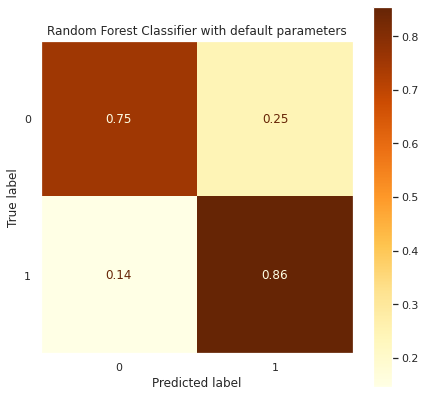

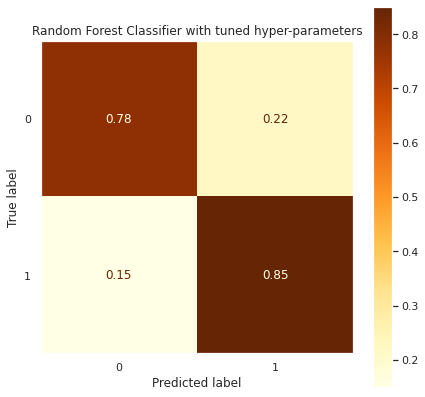

In [ ]:
titles_options = [("Random Forest Classifier with default parameters", rfc_w_base), ("Random Forest Classifier with tuned hyper-parameters", rfc_tuned_w)]
for title, classifier in titles_options:
    fig, ax = plt.subplots(figsize=(7, 7))
    plot_confusion_matrix(classifier, XW_validation, yW_validation,
                                 cmap="YlOrBr", normalize='true', ax=ax)
    ax.set_title(title)
    plt.grid(False)
    plt.show()

Based RFC: ROC AUC=0.885
Tuned RFC: ROC AUC=0.888


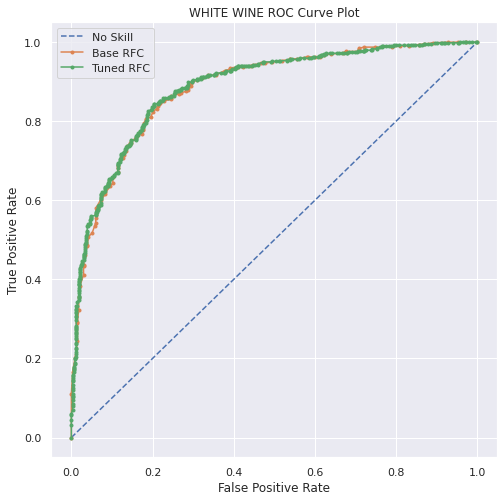

In [ ]:
## WHITE WINE

# predict probabilities
# basic
base_probs = rfc_w_base.predict_proba(XW_validation)
# tuned
tuned_probs = rfc_tuned_w.predict_proba(XW_validation)

# keep probabilities for the positive outcome only
base_probs = base_probs[:, 1]
tuned_probs = tuned_probs[:, 1]

# calculate scores
base_auc_w = roc_auc_score(yW_validation, base_probs)
tuned_auc_w = roc_auc_score(yW_validation, tuned_probs)

# calculate roc curves
fpr_w, tpr_w, _ = roc_curve(yW_validation, base_probs)
fpr_w2, tpr_w2, _ = roc_curve(yW_validation, tuned_probs)

print('Based RFC: ROC AUC=%.3f' % (base_auc_w))
print('Tuned RFC: ROC AUC=%.3f' % (tuned_auc_w))

# plot the roc curve for the model
plt.figure(figsize=(8,8))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr_w, tpr_w, marker='.', label='Base RFC')
plt.plot(fpr_w2, tpr_w2, marker='.', label='Tuned RFC')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.title("WHITE WINE ROC Curve Plot")
plt.show()

### Observations

* max_features, n_estimators and max_depth parameters was performed, as they were repeatedly suggested to be the crucial ones for random forest tuning. 
* For max_features in both wines, ‘sqrt’ and ‘log2’ options were considered, with ‘sqrt’ being superior each time. 
* n_estimators was selected from a limited set of values [10, 100, 500, 1000]. In both wines, 1000 was the best performing value. 
* max_depth parameter was tuned by checking each 10th value from 10 to 110 exclusive. 20 and 40 offered the best results for red and white wine, respectively.
* In both wines, tuned model has slightly better ROC AUC scores and the same or better (white wine) classification matrices.


(https://arxiv.org/pdf/1804.03515.pdf)<br>
https://machinelearningmastery.com/hyperparameters-for-classification-machine-learning-algorithms/




# 5) Machine learning for regression problem  


## 5.1. Prepare the train and test sets


#### Create new dataframe from the one without outliers, prepared in the data pre-processing phase and transform the alcohol_cat categorical variable into numerical

In [ ]:
rdf_reg = rdf.drop(columns=['isSweetMd',	'isSweet75',	'isSweetMn'])
wdf_reg = wdf.drop(columns=['isSweetMd',	'isSweet75',	'isSweetMn'])

rdf_reg = pd.get_dummies(rdf_reg, columns = ['alcohol_cat'])
wdf_reg = pd.get_dummies(wdf_reg, columns = ['alcohol_cat'])

wdf_reg.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweetMy,alcohol_cat_low,alcohol_cat_mid,alcohol_cat_high
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,1,0
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,1,0
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,1,0,1,0
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,1,0,0
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,1,0
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6,0,0,1,0


#### Leave only the previously selected features

In [ ]:
rdf_reg_sf = rdf_reg.loc[:,['alcohol', 'alcohol_cat_high', 'sulphates', 'chlorides', 'total sulfur dioxide', 'volatile acidity', 'quality']]
wdf_reg_sf = wdf_reg.loc[:,['alcohol', 'alcohol_cat_high', 'volatile acidity', 'isSweetMy', 'free sulfur dioxide', 'chlorides', 'quality']]

XR_reg = rdf_reg_sf.drop(['quality'], axis=1).values
yR_reg = rdf_reg_sf['quality'].values

XW_reg = wdf_reg_sf.drop(['quality'], axis=1).values
yW_reg = wdf_reg_sf['quality'].values

print(XR_reg.shape, yR_reg.shape)
print(XW_reg.shape, yW_reg.shape)

(1597, 6) (1597,)
(4871, 6) (4871,)


#### Prepare training and test sets with holdout validation

In [ ]:
# RED WINE
XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg = train_test_split(XR_reg, yR_reg, train_size=0.66, test_size = 0.33, random_state=15)

print(XR_tr_reg.shape, yR_tr_reg.shape)
print(XR_t_reg.shape, yR_t_reg.shape)
# WHITE WINE
XW_tr_reg, XW_t_reg, yW_tr_reg, yW_t_reg = train_test_split(XW_reg, yW_reg, train_size=0.66, test_size=0.3, random_state=15)

print(XW_tr_reg.shape, yW_tr_reg.shape)
print(XW_t_reg.shape, yW_t_reg.shape)

(1054, 6) (1054,)
(528, 6) (528,)
(3214, 6) (3214,)
(1462, 6) (1462,)


## 5.2. Create function for regression models

* Regression metrics: Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error (RMSE), R squared (R2)
* Accuracy and classification reports on rounded predicitions

* Stratified k-fold from classification replaced with repeated k-fold, as this is a regression problem and stratifying divides the train and test set based on class labels to maintain their ratios

* Repeated k fold helps remove the noise and variability of model results which could happen in case of a single run by repeating the same procedure couple of times and reporting the means

https://machinelearningmastery.com/repeated-k-fold-cross-validation-with-python/

* There is a possibility to use an oversampler, because I wanted to experiment with it myself on red wines, but the techniques used are not made for regression, therefore may produce unreliable results and be detrimental to model's performance. 
* There are very few pre-processing proposals for regression; the only ones I found were SMOTER (SMOTE for Regression) implemented in **R** and SMOGN, implementation of SMOTER for **Python**. Howvere, due to time constraints they weren't studied enough to be applied.

http://proceedings.mlr.press/v74/branco17a/branco17a.pdf

In [ ]:
def reg_kfold_train_eval(X_train, X_test, y_train, y_test, wine_type, distrib, oversampler, model):
    
   # define the pipeline with standardisation, normalisation of the data, oversampling and finally a model of choice
    
  if distrib:
    if oversampler == None:
      pipeline_imb = make_pipeline_imb(StandardScaler(), MinMaxScaler(), model)
    else:
      pipeline_imb = make_pipeline_imb(oversampler, StandardScaler(), MinMaxScaler(), model)
  else:
    if oversampler == None:
      pipeline_imb = make_pipeline_imb(model)
    else:
      pipeline_imb = make_pipeline_imb(oversampler, model)
  
  # define the k-fold cross validation strategy
  rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=15)

  #training set
  MAE_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='neg_mean_absolute_error', cv=rkf, error_score='raise')
  MSE_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='neg_mean_squared_error', cv=rkf, error_score='raise')
  RMSE_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='neg_root_mean_squared_error', cv=rkf, error_score='raise')
  R2_scores = cross_val_score(pipeline_imb, X_train, y_train, scoring='r2', cv=rkf, error_score='raise')

  if oversampler == None:
    print(f"Results for unbalanced data\n")
  else:
    print(f"Results for rebalancing the data with {oversampler}\n")

  print(f"Training set metrics for {wine_type}:\n")
  print(f"Mean Absolute Error: {abs(MAE_scores.mean()):.3f} (± {MAE_scores.std() * 2:.3f})")
  print(f"Mean Squared Error: {abs(MSE_scores.mean()):.3f} (± {MSE_scores.std() * 2:.3f})")
  print(f"Root Mean Squared Error: {abs(RMSE_scores.mean()):.3f} (± {RMSE_scores.std() * 2:.3f})")
  print(f"R squared: {R2_scores.mean():.3f} (± {R2_scores.std() * 2:.3f})\n")

  # test set
  pipeline_imb.fit(X_train, y_train)
  test_preds = pipeline_imb.predict(X_test)
  print(f"Test set metrics for {wine_type}:\n")
  print(f"Mean Absolute Error: {mean_absolute_error(y_test, test_preds):.3f}")
  print(f"Mean Squared Error: {mean_squared_error(y_test, test_preds, squared=False):.3f}")
  print(f"Root Mean Squared Error: {mean_squared_error(y_test, test_preds, squared=True):.3f}")
  print(f"R squared: {r2_score(y_test, test_preds):.3f}")

  # rounding up the predictions
  test_preds_rint = np.rint(test_preds)

  print("\n------------------------------------------------------------\n")
  print(f"Test set classification metrics for {wine_type}:\n")
  print(f"Mean Accuracy: {accuracy_score(y_test, test_preds_rint):.3f}\n")

  # test set report
  print(f"Predictions Report: \n")
  print(classification_report(y_test, test_preds_rint, zero_division=0))

  # return the classifier (and just in case, also the test predictions)
  return pipeline_imb, test_preds

## 5.3. Red wine regression models

### Random Forest Regressor

1st place

In [ ]:
rfr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, None, RandomForestRegressor())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Absolute Error: 0.453 (± 0.039)
Mean Squared Error: 0.376 (± 0.085)
Root Mean Squared Error: 0.613 (± 0.068)
R squared: 0.438 (± 0.094)

Test set metrics for RED WINE:

Mean Absolute Error: 0.423
Mean Squared Error: 0.574
Root Mean Squared Error: 0.329
R squared: 0.455

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.663

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.71      0.78      0.74       215
           6       0.64      0.69      0.66       223
           7       0.57      0.41      0.48        70
           8       0.00      0.00      0.00         2

    accuracy                           0.66       528
   macro avg       0.32      0.31      0.31       528
weighted avg      

2nd place

In [ ]:
rfr_rb, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, RandomOverSampler(random_state=42), RandomForestRegressor())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Absolute Error: 0.484 (± 0.049)
Mean Squared Error: 0.447 (± 0.104)
Root Mean Squared Error: 0.668 (± 0.078)
R squared: 0.330 (± 0.190)

Test set metrics for RED WINE:

Mean Absolute Error: 0.460
Mean Squared Error: 0.633
Root Mean Squared Error: 0.401
R squared: 0.335

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.631

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.10      0.07      0.08        15
           5       0.73      0.76      0.74       215
           6       0.61      0.65      0.63       223
           7       0.45      0.34      0.39        70
           8       0.00      0.00      0.00         2

   

3rd place

In [ ]:
rfr_rb, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, SMOTE(k_neighbors=3, random_state=42), RandomForestRegressor())

Results for rebalancing the data with SMOTE(k_neighbors=3, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Absolute Error: 0.499 (± 0.032)
Mean Squared Error: 0.479 (± 0.078)
Root Mean Squared Error: 0.692 (± 0.055)
R squared: 0.273 (± 0.194)

Test set metrics for RED WINE:

Mean Absolute Error: 0.476
Mean Squared Error: 0.652
Root Mean Squared Error: 0.424
R squared: 0.297

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.627

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.14      0.20      0.16        15
           5       0.72      0.79      0.75       215
           6       0.65      0.56      0.60       223
           7       0.47      0.

### Decision Tree Regressor

1st place

In [ ]:
dtr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, None, DecisionTreeRegressor())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Absolute Error: 0.505 (± 0.084)
Mean Squared Error: 0.709 (± 0.240)
Root Mean Squared Error: 0.823 (± 0.126)
R squared: -0.058 (± 0.353)

Test set metrics for RED WINE:

Mean Absolute Error: 0.458
Mean Squared Error: 0.771
Root Mean Squared Error: 0.595
R squared: 0.015

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.602

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.05      0.07      0.06        15
           5       0.67      0.72      0.70       215
           6       0.64      0.59      0.61       223
           7       0.48      0.43      0.45        70
           8       0.00      0.00      0.00         2

    accuracy                           0.60       528
   macro avg       0.31      0.30      0.30       528
weighted avg     

2nd place

In [ ]:
dtr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, RandomOverSampler(random_state=42), DecisionTreeRegressor())

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Absolute Error: 0.508 (± 0.106)
Mean Squared Error: 0.703 (± 0.210)
Root Mean Squared Error: 0.831 (± 0.117)
R squared: -0.057 (± 0.360)

Test set metrics for RED WINE:

Mean Absolute Error: 0.483
Mean Squared Error: 0.808
Root Mean Squared Error: 0.653
R squared: -0.083

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.593

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.07      0.07      0.07        15
           5       0.68      0.69      0.69       215
           6       0.61      0.57      0.59       223
           7       0.46      0.51      0.48        70
           8       0.00      0.00      0.00         2

 

3rd place

In [ ]:
dtr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", False, SMOTE(k_neighbors=3, random_state=42), DecisionTreeRegressor())

Results for rebalancing the data with SMOTE(k_neighbors=3, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Absolute Error: 0.544 (± 0.077)
Mean Squared Error: 0.775 (± 0.199)
Root Mean Squared Error: 0.881 (± 0.100)
R squared: -0.167 (± 0.402)

Test set metrics for RED WINE:

Mean Absolute Error: 0.530
Mean Squared Error: 0.877
Root Mean Squared Error: 0.769
R squared: -0.274

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.570

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.03      0.07      0.04        15
           5       0.72      0.66      0.69       215
           6       0.60      0.54      0.57       223
           7       0.47      

### Support Virtual Regressor

1st place

In [ ]:
svr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", True, None, SVR())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Absolute Error: 0.482 (± 0.046)
Mean Squared Error: 0.430 (± 0.084)
Root Mean Squared Error: 0.655 (± 0.064)
R squared: 0.353 (± 0.108)

Test set metrics for RED WINE:

Mean Absolute Error: 0.456
Mean Squared Error: 0.604
Root Mean Squared Error: 0.365
R squared: 0.395

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.619

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.66      0.78      0.72       215
           6       0.58      0.64      0.61       223
           7       0.56      0.26      0.35        70
           8       0.00      0.00      0.00         2

    accuracy                           0.62       528
   macro avg       0.30      0.28      0.28       528
weighted avg      

2nd place

In [ ]:
svr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", True, SMOTE(k_neighbors=3, random_state=42), SVR())

Results for rebalancing the data with SMOTE(k_neighbors=3, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Absolute Error: 0.671 (± 0.076)
Mean Squared Error: 0.786 (± 0.167)
Root Mean Squared Error: 0.885 (± 0.095)
R squared: -0.193 (± 0.400)

Test set metrics for RED WINE:

Mean Absolute Error: 0.673
Mean Squared Error: 0.909
Root Mean Squared Error: 0.827
R squared: -0.371

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.485

Predictions Report: 

              precision    recall  f1-score   support

           3       0.07      0.33      0.11         3
           4       0.07      0.27      0.11        15
           5       0.62      0.62      0.62       215
           6       0.61      0.33      0.43       223
           7       0.42      

### K-nearest neighbor regressor

1st place

In [ ]:
knnr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", True, None, KNeighborsRegressor(n_neighbors=5))

Results for unbalanced data

Training set metrics for RED WINE:

Mean Absolute Error: 0.518 (± 0.062)
Mean Squared Error: 0.468 (± 0.111)
Root Mean Squared Error: 0.683 (± 0.082)
R squared: 0.296 (± 0.166)

Test set metrics for RED WINE:

Mean Absolute Error: 0.475
Mean Squared Error: 0.632
Root Mean Squared Error: 0.400
R squared: 0.337

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.614

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.66      0.75      0.70       215
           6       0.61      0.59      0.60       223
           7       0.48      0.43      0.45        70
           8       0.00      0.00      0.00         2

    accuracy                           0.61       528
   macro avg       0.29      0.30      0.29       528
weighted avg      

2nd place

In [ ]:
knnr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", True, RandomOverSampler(random_state=42), KNeighborsRegressor(n_neighbors=5))

Results for rebalancing the data with RandomOverSampler(random_state=42, ratio=None, return_indices=False,
                  sampling_strategy='auto')

Training set metrics for RED WINE:

Mean Absolute Error: 0.602 (± 0.054)
Mean Squared Error: 0.660 (± 0.102)
Root Mean Squared Error: 0.812 (± 0.063)
R squared: -0.001 (± 0.262)

Test set metrics for RED WINE:

Mean Absolute Error: 0.593
Mean Squared Error: 0.813
Root Mean Squared Error: 0.661
R squared: -0.096

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.525

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.11      0.27      0.15        15
           5       0.67      0.64      0.65       215
           6       0.56      0.43      0.49       223
           7       0.38      0.54      0.45        70
           8       0.00      0.00      0.00         2

 

3rd place

In [ ]:
knnr_r, test_preds = reg_kfold_train_eval(XR_tr_reg, XR_t_reg, yR_tr_reg, yR_t_reg, "RED WINE", True, SMOTE(k_neighbors=3, random_state=42), KNeighborsRegressor(n_neighbors=5))

Results for rebalancing the data with SMOTE(k_neighbors=3, kind='deprecated', m_neighbors='deprecated', n_jobs=1,
      out_step='deprecated', random_state=42, ratio=None,
      sampling_strategy='auto', svm_estimator='deprecated')

Training set metrics for RED WINE:

Mean Absolute Error: 0.622 (± 0.063)
Mean Squared Error: 0.717 (± 0.162)
Root Mean Squared Error: 0.845 (± 0.095)
R squared: -0.088 (± 0.367)

Test set metrics for RED WINE:

Mean Absolute Error: 0.622
Mean Squared Error: 0.860
Root Mean Squared Error: 0.740
R squared: -0.226

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.513

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.12      0.40      0.19        15
           5       0.67      0.65      0.66       215
           6       0.58      0.41      0.48       223
           7       0.38      

### Observations

* all algorithms performed better on imbalanced data than on the balanced one.
* in previous iterations sometimes the balanced data was able to produce equally good results but only for Random Forest and Decision Trees
  - usually the imbalanced model has better regression metrics and classification metris for the more numerous classes, whereas the balanced models detect the minority classes better
* I used the balancing methods found out to be most successful in previous analysis: ROS and SMOTE.
* out of the two, usually ROS performed better than SMOTE.
* When two models had really similar classification reports, I put emphasis on the weighted average of the metrics because it takes into account the imbalances of the classes
* in terms of the regression metrics, the MAE and RMSE were given precedence in comparing models as they directly show how off the target for all classes together the model was, making it the metrics best suited for the purpose
* out of the two RMSE was prioritiesed as it more strongly penalizes big mistakes

------

* out of all models for red wine, the random forest regressor performs the best, showing the lowest error scores and the highest R2 score (0.455 - however, still bellow 0.5 which, admittedly, is really bad).
  - it also has the best classification report metrics derived from the predictions on the test set rounded to the nearest integer for all majority classes (5, 6, 7)
 - Weighted averages of recall and precision, which account for class imbalance, are highest for this algorithm as well
 - decision trees detect a tiny amount of the severely underrepresented class '4', whereas Random Forests don't detect it at all.

## 5.4. White wine regression models

* As mentioned in the red wine section, it would be hypothetically possible to rebalance the training sets using SMOTE, ROS, ADASYN and similar techniques but they have not been developed specifically for regression problems, hence can offer invalid results and it is better to omit them althogether. 
* As stated above as well, studying more about rebalancing tools for regression is beyond my current capabilities, therefore only unbalanced models were considered for comparison for white wine data.

### Random Forest Regressor

In [ ]:
rfr_w, test_preds = reg_kfold_train_eval(XW_tr_reg, XW_t_reg, yW_tr_reg, yW_t_reg, "WHITE WINE", False, None, RandomForestRegressor())

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Absolute Error: 0.501 (± 0.030)
Mean Squared Error: 0.464 (± 0.072)
Root Mean Squared Error: 0.683 (± 0.050)
R squared: 0.400 (± 0.060)

Test set metrics for WHITE WINE:

Mean Absolute Error: 0.481
Mean Squared Error: 0.673
Root Mean Squared Error: 0.453
R squared: 0.418

------------------------------------------------------------

Test set classification metrics for WHITE WINE:

Mean Accuracy: 0.629

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         8
           4       0.56      0.10      0.17        51
           5       0.66      0.65      0.65       432
           6       0.63      0.74      0.68       662
           7       0.57      0.52      0.54       261
           8       0.80      0.17      0.28        47
           9       0.00      0.00      0.00         1

    accuracy                           0.63      1462
   macro avg

### Decision Tree Regressor

In [ ]:
dtr_w, test_preds = reg_kfold_train_eval(XW_tr_reg, XW_t_reg, yW_tr_reg, yW_t_reg, "WHITE WINE", True, None, DecisionTreeRegressor())

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Absolute Error: 0.577 (± 0.040)
Mean Squared Error: 0.854 (± 0.093)
Root Mean Squared Error: 0.918 (± 0.050)
R squared: -0.084 (± 0.112)

Test set metrics for WHITE WINE:

Mean Absolute Error: 0.561
Mean Squared Error: 0.908
Root Mean Squared Error: 0.825
R squared: -0.059

------------------------------------------------------------

Test set classification metrics for WHITE WINE:

Mean Accuracy: 0.554

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         8
           4       0.26      0.29      0.28        51
           5       0.58      0.58      0.58       432
           6       0.61      0.61      0.61       662
           7       0.51      0.50      0.50       261
           8       0.26      0.30      0.28        47
           9       0.00      0.00      0.00         1

    accuracy                           0.55      1462
   macro a

### Support Virtual Regressor

In [ ]:
svr_w, test_preds = reg_kfold_train_eval(XW_tr_reg, XW_t_reg, yW_tr_reg, yW_t_reg, "WHITE WINE", True, None, SVR())

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Absolute Error: 0.570 (± 0.035)
Mean Squared Error: 0.548 (± 0.074)
Root Mean Squared Error: 0.740 (± 0.050)
R squared: 0.296 (± 0.047)

Test set metrics for WHITE WINE:

Mean Absolute Error: 0.560
Mean Squared Error: 0.726
Root Mean Squared Error: 0.528
R squared: 0.323

------------------------------------------------------------

Test set classification metrics for WHITE WINE:

Mean Accuracy: 0.527

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00        51
           5       0.59      0.43      0.49       432
           6       0.52      0.79      0.63       662
           7       0.44      0.26      0.32       261
           8       0.00      0.00      0.00        47
           9       0.00      0.00      0.00         1

    accuracy                           0.53      1462
   macro avg

### K-nearest neighbor regressor

In [ ]:
knnr_w, test_preds = reg_kfold_train_eval(XW_tr_reg, XW_t_reg, yW_tr_reg, yW_t_reg, "WHITE WINE", True, None, KNeighborsRegressor(n_neighbors=5))

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Absolute Error: 0.574 (± 0.031)
Mean Squared Error: 0.560 (± 0.080)
Root Mean Squared Error: 0.748 (± 0.053)
R squared: 0.280 (± 0.045)

Test set metrics for WHITE WINE:

Mean Absolute Error: 0.569
Mean Squared Error: 0.750
Root Mean Squared Error: 0.563
R squared: 0.277

------------------------------------------------------------

Test set classification metrics for WHITE WINE:

Mean Accuracy: 0.527

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         8
           4       0.50      0.04      0.07        51
           5       0.56      0.54      0.55       432
           6       0.54      0.64      0.59       662
           7       0.43      0.40      0.41       261
           8       0.40      0.13      0.19        47
           9       0.00      0.00      0.00         1

    accuracy                           0.53      1462
   macro avg

### Observations



* By far, the best model when it comes to regression metrics is the Random Forest Regresor (similarily to red wine). It has the lowest error scores and the highest R score of 0.418. In terms of the approximated test set classifications and their metrics, random forest also has the highest accuracy, weighted precision and recall. 
* In the individual metrics for each class, decision tree regressor has significantly higher recall scores for the minority classs, such as 4 and 8 (around 30%), whilst random forest model has less than half of this. At the same time RF has higher recall on most other classes. 
* Additionally, RF has better precision on all classes, especially the minortiy ones making it a better model overall.
* When it comes to the more numerous classes, the random forest regressor also has better recall, especially on class 6. Additionally, it has much higher precision on those classes than the dtr as well, making it probably a better model overall.

## 5.5. Hyper-parameter tuning for Random Forest Regressors with GridSearchCV

### Prepare the train and test sets
* grid set: test for automatic training and testing inside GridSearchCV
* valid set: test sets which are held completely unseen throughout the GridSearch and are used to test the tuned model at the end

In [ ]:
## Hold out validation for gridsearch

# RED WINE
XR_grid, XR_valid, yR_grid, yR_valid = train_test_split(XR_reg, yR_reg, train_size=0.66, test_size = 0.33, random_state=15)

# WHITE WINE
XW_grid, XW_valid, yW_grid, yW_valid = train_test_split(XW_reg, yW_reg, train_size=0.66, test_size=0.33, random_state=15)


### Red wine

#### Baseline models with default parameters

In [ ]:
## BASE MODEL FOR HPT
rfr_r_base, test_preds_base = reg_kfold_train_eval(XR_grid, XR_valid, yR_grid, yR_valid, "RED WINE", False, None, RandomForestRegressor())

Results for unbalanced data

Training set metrics for RED WINE:

Mean Absolute Error: 0.453 (± 0.039)
Mean Squared Error: 0.375 (± 0.093)
Root Mean Squared Error: 0.611 (± 0.070)
R squared: 0.437 (± 0.094)

Test set metrics for RED WINE:

Mean Absolute Error: 0.418
Mean Squared Error: 0.567
Root Mean Squared Error: 0.321
R squared: 0.467

------------------------------------------------------------

Test set classification metrics for RED WINE:

Mean Accuracy: 0.667

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.71      0.77      0.74       215
           6       0.64      0.71      0.68       223
           7       0.59      0.41      0.49        70
           8       0.00      0.00      0.00         2

    accuracy                           0.67       528
   macro avg       0.32      0.32      0.32       528
weighted avg      

#### Tuning `max_features` and `n_estimators`

In [ ]:
# cross validation method
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=15)
# parameters
params = {
    'n_estimators': [10, 50, 150, 500], #the number of trees in the forest [10, 20, 50, 80, 100, 200]
    'random_state': [13],
    'max_features': np.arange(1, 7, 1),
}

# scoring
scoring = ['neg_mean_absolute_error', 'neg_root_mean_squared_error', 'r2']
# grid search
grid = GridSearchCV(RandomForestRegressor(), param_grid=params, cv=rkf, scoring=scoring, refit='r2')

grid.fit(XR_grid, yR_grid)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=15),
             error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                           

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for RED WINE: \n")
print(f"Mean Absolute Error {abs(grid.cv_results_['mean_test_neg_mean_absolute_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_mean_absolute_error'][grid.best_index_] * 2:.3f})")
print(f"Root Mean Squared Error {abs(grid.cv_results_['mean_test_neg_root_mean_squared_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_root_mean_squared_error'][grid.best_index_] * 2:.3f})")
print(f"R squared {grid.cv_results_['mean_test_r2'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_r2'][grid.best_index_] * 2:.3f})\n")

# validation set predictions (rounded up)
test_preds = np.rint(grid.predict(XR_valid))

print(f"Test (validation) set regression metrics for RED WINE:\n")
print(f"Mean Absolute Error: {mean_absolute_error(yR_valid, test_preds):.3f}")
print(f"Root Mean Squared Error: {mean_squared_error(yR_valid, test_preds, squared=True):.3f}")
print(f"R squared: {r2_score(yR_valid, test_preds):.3f}")

print("\n------------------------------------------------------------\n")
print(f"Test (validation) set classification metrics for RED WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yR_valid, test_preds):.3f}\n")

# test set report
print(f"Predictions Report: \n")
print(classification_report(yR_valid, test_preds, zero_division=0))

{'max_features': 1, 'n_estimators': 150, 'random_state': 13}

Gridsearch cross validation metrics for RED WINE: 

Mean Absolute Error 0.446 (± 0.045)
Root Mean Squared Error 0.603 (± 0.079)
R squared 0.453 (± 0.092)

Test (validation) set regression metrics for RED WINE:

Mean Absolute Error: 0.328
Root Mean Squared Error: 0.366
R squared: 0.394

------------------------------------------------------------

Test (validation) set classification metrics for RED WINE:

Mean Accuracy: 0.691

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.72      0.80      0.76       215
           6       0.66      0.74      0.70       223
           7       0.73      0.39      0.50        70
           8       0.00      0.00      0.00         2

    accuracy                           0.69       528
   macro avg       0.35      0.32      0.33       5

#### Tuning `max_depth`

In [ ]:
# cross validation method
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=15)
# parameters
params = {
    'n_estimators': [150], #the number of trees in the forest [10, 20, 50, 80, 100, 200]
    'max_depth': np.arange(10, 110, 10),# [5, 10, 20, 40, 80, 100, None]
    'random_state': [13],
    'max_features': [1], # [1, 2, 5, 7, 9, None]
}

# scoring
scoring = ['neg_mean_absolute_error', 'neg_root_mean_squared_error', 'r2']
# grid search
grid = GridSearchCV(RandomForestRegressor(), param_grid=params, cv=rkf, scoring=scoring, refit='r2')

grid.fit(XR_grid, yR_grid)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=15),
             error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0...
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jobs=None,


In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for RED WINE: \n")
print(f"Mean Absolute Error {abs(grid.cv_results_['mean_test_neg_mean_absolute_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_mean_absolute_error'][grid.best_index_] * 2:.3f})")
print(f"Root Mean Squared Error {abs(grid.cv_results_['mean_test_neg_root_mean_squared_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_root_mean_squared_error'][grid.best_index_] * 2:.3f})")
print(f"R squared {grid.cv_results_['mean_test_r2'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_r2'][grid.best_index_] * 2:.3f})\n")

# validation set predictions (rounded up)
test_preds = np.rint(grid.predict(XR_valid))

print(f"Test (validation) set regression metrics for RED WINE:\n")
print(f"Mean Absolute Error: {mean_absolute_error(yR_valid, test_preds):.3f}")
print(f"Root Mean Squared Error: {mean_squared_error(yR_valid, test_preds, squared=True):.3f}")
print(f"R squared: {r2_score(yR_valid, test_preds):.3f}")

print("\n------------------------------------------------------------\n")
print(f"Test (validation) set classification metrics for RED WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yR_valid, test_preds):.3f}\n")

# test set report
print(f"Predictions Report: \n")
print(classification_report(yR_valid, test_preds, zero_division=0))

rfr_tuned_r = grid
test_preds_tuned = test_preds

{'max_depth': 30, 'max_features': 1, 'n_estimators': 150, 'random_state': 13}

Gridsearch cross validation metrics for RED WINE: 

Mean Absolute Error 0.446 (± 0.045)
Root Mean Squared Error 0.603 (± 0.079)
R squared 0.453 (± 0.092)

Test (validation) set regression metrics for RED WINE:

Mean Absolute Error: 0.328
Root Mean Squared Error: 0.366
R squared: 0.394

------------------------------------------------------------

Test (validation) set classification metrics for RED WINE:

Mean Accuracy: 0.691

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.72      0.80      0.76       215
           6       0.66      0.74      0.70       223
           7       0.73      0.39      0.50        70
           8       0.00      0.00      0.00         2

    accuracy                           0.69       528
   macro avg       0.35      0.32 

#### Confusion matrices with all quality labels included

In [ ]:
# Confusion matrix function
def plot_multiclass_confusion_matrix(cm, cmap, classes=None, title='Confusion matrix'):
    if classes is not None:
        sns.heatmap(cm, cmap=cmap, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True)
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

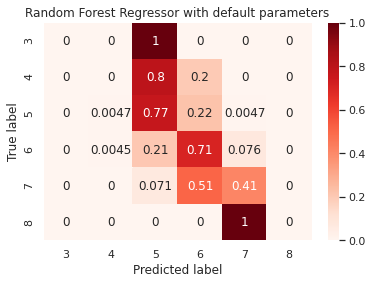

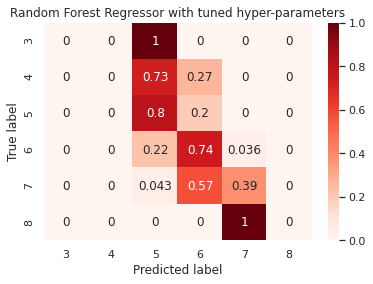

In [ ]:
# calculate confusion matrices
cmr_base = confusion_matrix(yR_valid, np.rint(test_preds_base))
cmr_tuned = confusion_matrix(yR_valid, np.rint(test_preds_tuned))

# normalise
cmr_basen = cmr_base / cmr_base.sum(axis=1).reshape(-1,1)
cmr_tunedn = cmr_tuned /cmr_tuned.sum(axis=1).reshape(-1,1)

classes = [3,4,5,6,7,8]

plot_multiclass_confusion_matrix(cmr_basen, classes=classes, title="Random Forest Regressor with default parameters", cmap="Reds")
plot_multiclass_confusion_matrix(cmr_tunedn, classes=classes, title="Random Forest Regressor with tuned hyper-parameters", cmap="Reds")

#### Conclusions

For red wine, the tuned model shows a significant improvement in the MAE score (0.328 vs. 0.418) but has a slightly higher RMSE (0.366 vs. 0.321) and the R2 score is worse as well. In terms of classification metrics on the rounded predictions, accuracy, and overall results for all detected classes (5-7) are higher, indicated by the f1-scores and weighted averages.

### White wine

#### Baseline model

In [ ]:
## BASE MODEL FOR HTP
rfr_w_base, test_preds_base_w = reg_kfold_train_eval(XW_grid, XW_valid, yW_grid, yW_valid, "WHITE WINE", False, None, RandomForestRegressor())

Results for unbalanced data

Training set metrics for WHITE WINE:

Mean Absolute Error: 0.499 (± 0.027)
Mean Squared Error: 0.458 (± 0.051)
Root Mean Squared Error: 0.676 (± 0.039)
R squared: 0.409 (± 0.061)

Test set metrics for WHITE WINE:

Mean Absolute Error: 0.484
Mean Squared Error: 0.674
Root Mean Squared Error: 0.455
R squared: 0.423

------------------------------------------------------------

Test set classification metrics for WHITE WINE:

Mean Accuracy: 0.631

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.64      0.13      0.21        55
           5       0.67      0.60      0.64       475
           6       0.62      0.76      0.68       724
           7       0.59      0.54      0.56       289
           8       0.92      0.22      0.35        55
           9       0.00      0.00      0.00         1

    accuracy                           0.63      1608
   macro avg

#### Tuning `max_features` and `n_estimators`

In [ ]:
# cross validation method
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=15)
# parameters
params = {
    'n_estimators': [50, 150, 500, 1000], #the number of trees in the forest [10, 20, 50, 80, 100, 200]
    'random_state': [13],
    'max_features': np.arange(1, 7, 1), # [1, 2, 5, 7, 9, None]
}

# scoring
scoring = ['neg_mean_absolute_error', 'neg_root_mean_squared_error', 'r2']
# grid search
grid = GridSearchCV(RandomForestRegressor(), param_grid=params, cv=rkf, scoring=scoring, refit='r2')

grid.fit(XW_grid, yW_grid)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=15),
             error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                           

In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for WHITE WINE: \n")
print(f"Mean Absolute Error {abs(grid.cv_results_['mean_test_neg_mean_absolute_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_mean_absolute_error'][grid.best_index_] * 2:.3f})")
print(f"Root Mean Squared Error {abs(grid.cv_results_['mean_test_neg_root_mean_squared_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_root_mean_squared_error'][grid.best_index_] * 2:.3f})")
print(f"R squared {grid.cv_results_['mean_test_r2'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_r2'][grid.best_index_] * 2:.3f})\n")

# validation set predictions (rounded up)
test_preds = np.rint(grid.predict(XW_valid))

print(f"Test (validation) set regression metrics for WHITE WINE:\n")
print(f"Mean Absolute Error: {mean_absolute_error(yW_valid, test_preds):.3f}")
print(f"Root Mean Squared Error: {mean_squared_error(yW_valid, test_preds, squared=True):.3f}")
print(f"R squared: {r2_score(yW_valid, test_preds):.3f}")

print("\n------------------------------------------------------------\n")
print(f"Test (validation) set classification metrics for WHITE WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yW_valid, test_preds):.3f}\n")

# test set report
print(f"Predictions Report: \n")

{'max_features': 1, 'n_estimators': 1000, 'random_state': 13}

Gridsearch cross validation metrics for WHITE WINE: 

Mean Absolute Error 0.484 (± 0.025)
Root Mean Squared Error 0.658 (± 0.035)
R squared 0.443 (± 0.062)

Test (validation) set regression metrics for WHITE WINE:

Mean Absolute Error: 0.406
Root Mean Squared Error: 0.492
R squared: 0.375

------------------------------------------------------------

Test (validation) set classification metrics for WHITE WINE:

Mean Accuracy: 0.633

Predictions Report: 



#### Tuning `max_depth`

In [ ]:
# cross validation method
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=15)
# parameters
params = {
    'n_estimators': [1000], #the number of trees in the forest [10, 20, 50, 80, 100, 200]
    'max_depth': np.arange(10, 110, 10),# [5, 10, 20, 40, 80, 100, None]
    'random_state': [13],
    'max_features': [1], # [1, 2, 5, 7, 9, None]
}

# scoring
scoring = ['neg_mean_absolute_error', 'neg_root_mean_squared_error', 'r2']
# grid search
grid = GridSearchCV(RandomForestRegressor(), param_grid=params, cv=rkf, scoring=scoring, refit='r2')

grid.fit(XW_grid, yW_grid)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=15),
             error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0...
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jobs=None,


In [ ]:
print(grid.best_params_)

print("\nGridsearch cross validation metrics for WHITE WINE: \n")
print(f"Mean Absolute Error {abs(grid.cv_results_['mean_test_neg_mean_absolute_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_mean_absolute_error'][grid.best_index_] * 2:.3f})")
print(f"Root Mean Squared Error {abs(grid.cv_results_['mean_test_neg_root_mean_squared_error'][grid.best_index_]):.3f} (± {grid.cv_results_['std_test_neg_root_mean_squared_error'][grid.best_index_] * 2:.3f})")
print(f"R squared {grid.cv_results_['mean_test_r2'][grid.best_index_]:.3f} (± {grid.cv_results_['std_test_r2'][grid.best_index_] * 2:.3f})\n")

# validation set predictions (rounded up)
test_preds = np.rint(grid.predict(XW_valid))

print(f"Test (validation) set regression metrics for WHITE WINE:\n")
print(f"Mean Absolute Error: {mean_absolute_error(yW_valid, test_preds):.3f}")
print(f"Root Mean Squared Error: {mean_squared_error(yW_valid, test_preds, squared=True):.3f}")
print(f"R squared: {r2_score(yW_valid, test_preds):.3f}")

print("\n------------------------------------------------------------\n")
print(f"Test (validation) set classification metrics for WHITE WINE:\n")
print(f"Mean Accuracy: {accuracy_score(yW_valid, test_preds):.3f}\n")

# test set report
print(f"Predictions Report: \n")
print(classification_report(yW_valid, test_preds, zero_division=0))

rfr_tuned_w = grid
test_preds_tuned_w = test_preds

{'max_depth': 40, 'max_features': 1, 'n_estimators': 1000, 'random_state': 13}

Gridsearch cross validation metrics for WHITE WINE: 

Mean Absolute Error 0.484 (± 0.025)
Root Mean Squared Error 0.658 (± 0.035)
R squared 0.443 (± 0.062)

Test (validation) set regression metrics for WHITE WINE:

Mean Absolute Error: 0.406
Root Mean Squared Error: 0.492
R squared: 0.375

------------------------------------------------------------

Test (validation) set classification metrics for WHITE WINE:

Mean Accuracy: 0.633

Predictions Report: 

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.80      0.07      0.13        55
           5       0.67      0.62      0.65       475
           6       0.63      0.77      0.69       724
           7       0.58      0.55      0.56       289
           8       1.00      0.13      0.23        55
           9       0.00      0.00      0.00         1

    accuracy               

#### Confusion matrices with all quality labels included

In [ ]:
# Confusion matrix function
def plot_multiclass_confusion_matrix(cm, cmap, classes=None, title='Confusion matrix'):
    if classes is not None:
        sns.heatmap(cm, cmap=cmap, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True)
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

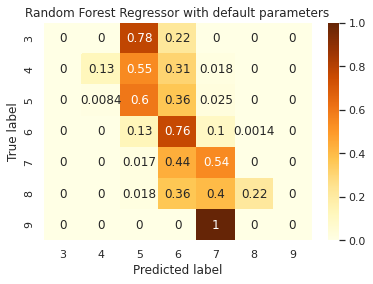

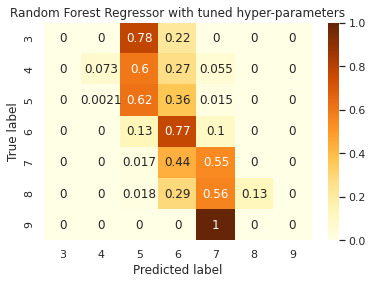

In [ ]:
# calculate confusion matrices
cmw_base = confusion_matrix(yW_valid, np.rint(test_preds_base_w))
cmw_tuned = confusion_matrix(yW_valid, np.rint(test_preds_tuned_w))

# normalise
cmw_basen = cmw_base / cmw_base.sum(axis=1).reshape(-1,1)
cmw_tunedn = cmw_tuned /cmw_tuned.sum(axis=1).reshape(-1,1)

classes = [3,4,5,6,7,8,9]

plot_multiclass_confusion_matrix(cmw_basen, classes=classes, title="Random Forest Regressor with default parameters", cmap="YlOrBr")
plot_multiclass_confusion_matrix(cmw_tunedn, classes=classes, title="Random Forest Regressor with tuned hyper-parameters", cmap="YlOrBr")

#### Observations

Tuned model for white wine improves the MAE scores, but worsens RMSE by approximately half as much, and the R2 score drops too. In terms of label classification, tuned model gives worse predictions for the minority classes ‘4’ and ‘8’ but better for all others (Figure 16).